###Mount Google Drive
Mount Google Drive - where all nuScenes data and resulting run data will be strored

In [ ]:
#Need to mount my Google Drive
from google.colab import drive
drive.mount("/content/gdrive/")

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


Set environment variable for path to nuScenes dataset

In [ ]:
%cd /content/gdrive/MyDrive/MScDissertation
import os
cwd = os.getcwd()
print("cwd:",cwd)
dataroot=os.path.join(cwd,'data/sets/nuscenes') #needed to remove / before data to make it work - now we should be able to access the singapore-onenorth file
print("dataroot (after joining)",dataroot)



# Add a new environment variable for the nuScenes path
os.environ['NUSCENES'] = dataroot

print("NUSCENES:", os.environ['NUSCENES'])

/content/gdrive/MyDrive/MScDissertation
cwd: /content/gdrive/MyDrive/MScDissertation
dataroot (after joining) /content/gdrive/MyDrive/MScDissertation/data/sets/nuscenes
NUSCENES: /content/gdrive/MyDrive/MScDissertation/data/sets/nuscenes


###Clone and pull code from Github repository

All code for this project is strored at [the following Github link](https://github.com/aokane001/Dissertation-repo). Clone this repository, pull in recent changes and change to the "src" directory which is the main sub-folder for code

In [ ]:
!git clone https://github.com/aokane001/Dissertation-repo

fatal: destination path 'Dissertation-repo' already exists and is not an empty directory.


In [ ]:
#NB Need to actuall change directory forst before pulling
%cd Dissertation-repo/
!git pull
#then switch to src - this is where most of the files we will want to run are
%cd src/

/content/gdrive/MyDrive/MScDissertation/Dissertation-repo
Already up to date.
/content/gdrive/MyDrive/MScDissertation/Dissertation-repo/src


###Import necessary packages

Import all python packages needed for this project, in particular nuScenes-devkit and efficientnet. Warnings can be ignored. Some minor errors related to matplotlib versions can be resolved by restarting the runtime and running all cells again.

In [ ]:
#pip installing all the other stuff we will need - that will be called by other files
!python3 -m pip install --upgrade pip
!pip install efficientnet_pytorch==0.7.0
!pip install torchvision torch tensorboardX
!pip install pyquaternion
import functools
!python3 -m pip install --upgrade Pillow
!pip install nuscenes-devkit &> /dev/null  # Install nuScenes.
#NB mpl_toolkits is not on PyPi so not installable by pip
#Since I have matplotlib already installed simply use the following command
import matplotlib
import mpl_toolkits
#NB Was getting several ShapelyDeprecation warnings - this is to help ignore them for now
import shapely
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

###Set parameters for TF Grid baseline

Set parameters here ine one place, so they can then be referenced below in all relevant function calls

In [ ]:
#With TF Grid this is set as part of the config file - then when running the actual train file it is
#run by firing the main.py file which runs the train.py file and we specify the arguments to pass and point to the config file where the train label is set
#so it never actually gets explicitly passed in the train.py (on which we based train() below) - so I think that's why we need to set it explicitly here
train_label = 'lane_divider' #'walkway' #'vehicle'  #'drivable_area'

#Want to set the logdir here - this is what will actually be passed when we call the function below and pass logdir-logdir
#but in the function definition set the default to just be "./runs"
logdir='./runs'

version = "mini"
dataroot = os.environ["NUSCENES"]
#Use 60 epochs for full runs - as per TF Grid
nepochs = 60
#since only one GPU is available in Colab and we start counting from 0
gpuid = 0

#params related to data_aug_conf - i.e. related to data augmentation of camera images
H=900
W=1600
resize_lim=(0.193, 0.225)
final_dim=(128, 352)
bot_pct_lim=(0.0, 0.22)
rot_lim=(-5.4, 5.4)
rand_flip=True
ncams=5
max_grad_norm=5.0
pos_weight=2.13

#params related to grid_conf - i.e. grid configuration of final semantic grid - want this to be 200 x 200 cells i.e. -50m to 50m range in 0.5m intervals
xbound=[-64.0, 64.0, 0.5]
ybound=[-64.0, 64.0, 0.5]
zbound=[-10.0, 10.0, 20.0]
dbound=[4.0, 45.0,1.0] #this is D in literature of Lift Splat Shoot - range of distances

#params related to training function
bsz=2 #batch size
nworkers=2

lr = 1e-3 #learning rate
weight_decay = 1e-7 #weight_decay for L2 regularisation
num_classes = 1 #ultimately only training for 1 class at a time

#params related to PointPillars backbone
num_points = 100000
#NB - AS WE ARE training BASED ON MINI - PASS 34718 WHEN CALLING TRAIN
# trainval avg 34720  , mini avg 34718
n_points=34718

#As per TFGrid config files this was left as is - defined based on xbound, ybound so that grid sizes match up and allow for concatenation
#Comment and let this be passed wheb defining grid_conf
#pc_range= [xbound[0],ybound[0],-4,xbound[1],ybound[1],4]
#voxel_size = [xbound[2],ybound[2],8]

max_points_voxel = 100 #this is N in TF Grid literature
max_voxels = 10000 #this is P in TF Grid literature
input_features= 4 #four initial inputs - supplemented to get up to 9-dimensional within PointPillars block
use_norm = True #we do want to use BatchNorm
vfe_filters = [64] #this is effectively C=64 for PointPillars - controls number of channels
with_distance = False

#below for tf_config
n_head = 4
block_exp = 4
n_layer = 8
vert_anchors = 8
horz_anchors = 8
seq_len = 1
embd_pdrop = 0.1
resid_pdrop = 0.1
attn_pdrop = 0.1
n_views=1

#Will need to pass this as the place to store data for visualisations
img_save_dir = './runs/viz_model_preds/' #need '/' here so that file path is saved correctly when passing to savefig in viz_model_preds() below

#for lidar_check() below
show_lidar=True #want to see lidar scans
viz_train=False #set this to True to see data augmentation and visualise train data rather than val data

#for viz_model_preds below - or visualisation
map_folder = os.environ["NUSCENES"]

###Define train() function

In [ ]:
#import necessary packages and code from other scripts in Github repo
#the following command effectively mirrors the train.py script from TF Grid repo
import torch
import torch.nn.functional as F
from time import time
from tensorboardX import SummaryWriter
import numpy as np
import os

from models_TFGrid import compile_model #this is the script for the 4T version of TF Grid

from data import compile_data
from tools import SimpleLoss, get_batch_iou, get_val_info,points_to_voxel_loop

#Define train() function
def train(
  train_label = train_label, #In TFGrid this isn't in the definition of train but really it is needed for compile_data that is called as part of it
                             #so it should be passed - in reality it seems the Fire part of main.py that calls the config file gets it from there - but it should be here
  version = version,
  dataroot = dataroot,
  nepochs = nepochs, #60 for full runs
  gpuid = gpuid,

  H = H,
  W = W,
  resize_lim = resize_lim,
  final_dim = final_dim,
  bot_pct_lim = bot_pct_lim,
  rot_lim = rot_lim,
  rand_flip = rand_flip,
  ncams = ncams,
  max_grad_norm = max_grad_norm,
  pos_weight = pos_weight,
  logdir = logdir,
  xbound = xbound,
  ybound = ybound,
  zbound = zbound,
  dbound = dbound,

  bsz = bsz,
  nworkers = nworkers,
  lr = lr,
  weight_decay = weight_decay,
  num_classes = num_classes,
  num_points = num_points,
  n_points = n_points,

  max_points_voxel = max_points_voxel,
  max_voxels = max_voxels,
  input_features= input_features,
  use_norm = use_norm,
  vfe_filters = vfe_filters,
  with_distance = with_distance,

  n_head = n_head,
  block_exp = block_exp,
  n_layer = n_layer,
  vert_anchors = vert_anchors,
  horz_anchors = horz_anchors,
  seq_len = seq_len,
  embd_pdrop = embd_pdrop,
  resid_pdrop = resid_pdrop,
  attn_pdrop = attn_pdrop,
  n_views= n_views
  ):

  #The following dicts are then defined based on passed params
  grid_conf = {
    'xbound': xbound,
    'ybound': ybound,
    'zbound': zbound,
    'dbound': dbound,
  }

  data_aug_conf = {
    'resize_lim': resize_lim,
    'final_dim': final_dim,
    'rot_lim': rot_lim,
    'H': H, 'W': W,
    'rand_flip': rand_flip,
    'bot_pct_lim': bot_pct_lim,
    'cams': ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT','CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT'],
    'Ncams': ncams,
  }

  cfg_pp = {
    'num_classes':num_classes,
    'num_points': num_points,
    'pc_range': [xbound[0],ybound[0],-4,xbound[1],ybound[1],4], #NB-define this based on xbound, ybound so grid sizes will match
    'voxel_size' : [xbound[2],ybound[2],8], #NB-define this based on xbound, ybound so grid sizes will match
    'max_points_voxel' : max_points_voxel,
    'max_voxels': max_voxels,
    'input_features': input_features,
    'batch_size': bsz,
    'use_norm': use_norm,
    'vfe_filters': vfe_filters,
    'with_distance': with_distance,
    'n_points': n_points,
  }

  tf_config = {
    'n_head':n_head,
    'block_exp':block_exp,
    'n_layer':n_layer,
    'vert_anchors':vert_anchors,
    'horz_anchors':horz_anchors,
    'seq_len':seq_len,
    'embd_pdrop':embd_pdrop,
    'resid_pdrop':resid_pdrop,
    'attn_pdrop':attn_pdrop,
    'n_views':n_views

  }

  print('Loading data ...')
  #Had to change the way this is called slightly - it is strange, in train.py in TFGrid - it passes n_points and pc_range explicitly but this isn't how it is defined in models.py
  trainloader, valloader = compile_data(version, dataroot, data_aug_conf=data_aug_conf,
                                          grid_conf=grid_conf, bsz=bsz, nworkers=nworkers,
                                          parser_name='segmentationdata',cfg_pp=cfg_pp, train_label=train_label) #other paraemeter - cond, dist, rank, sw can be left as default

  device = torch.device('cpu') if gpuid < 0 else torch.device(f'cuda:{gpuid}')
  print('Compiling model ...')
  model = compile_model(grid_conf, data_aug_conf, outC=1, cfg_pp=cfg_pp, tf_config = tf_config) ### outC number of output channels
  model.to(device)
  opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
  loss_fn = SimpleLoss(pos_weight).cuda(gpuid)
  writer = SummaryWriter(logdir=logdir)
  val_step = 500 if version == 'mini' else 5000
  model.train()
  counter = 0
  print('Starting training ...')
  for epoch in range(nepochs):
      print(f"Epoch: {epoch+1}/{nepochs}") #NOTE - ACTUAL VALUE OF epoch WILL START COUNTING FROM 0 - THIS IS JUST FOR CONVENIENCE OF READING OUTPUT TO START FROM 1
      np.random.seed()
      for batchi, (imgs, rots, trans, intrins, post_rots, post_trans, binimgs, points) in enumerate(trainloader):
          t0 = time()
          opt.zero_grad()
          voxels, coors, num_points = points_to_voxel_loop(points, cfg_pp)
          preds = model(imgs.to(device),
                  rots.to(device),
                  trans.to(device),
                  intrins.to(device),
                  post_rots.to(device),
                  post_trans.to(device),
                  voxels.to(device),
                  coors.to(device),
                  num_points.to(device),
                  )

          binimgs = binimgs.to(device)
          loss = loss_fn(preds, binimgs)
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
          opt.step()
          counter += 1
          t1 = time()
          if counter % 10 == 0:
              print(counter, loss.item())
              writer.add_scalar('train/loss', loss, counter)
          if counter % 50 == 0:
              intersection, union, iou = get_batch_iou(preds, binimgs)
              writer.add_scalar('train/iou', iou, counter)
              writer.add_scalar('train/epoch', epoch, counter)
              writer.add_scalar('train/step_time', t1 - t0, counter)
          if counter % val_step == 0:
              val_info = get_val_info(model, valloader, loss_fn, device, cfg_pp=cfg_pp,grid_conf=grid_conf, use_tqdm= True)
              print('VAL', val_info)
              writer.add_scalar('val/loss', val_info['loss'], counter)
              writer.add_scalar('val/iou', val_info['iou'], counter)
          if counter % val_step == 0:
              model.eval()
              mname = os.path.join(logdir, "model{}.pt".format(counter)) #NB This is the location-same runs/ directory where summary will be saved
                                                                         #where the model will also be saved every val_step=500 number of training steps
              print('saving ... ', mname)
              torch.save({
              'epoch': epoch,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': opt.state_dict(),
              'loss': loss,
              'counter':counter
              }, mname)
              model.train()


###Now we want to actually call train() to commence training

Loading data ...
Getting all samples
Getting all samples
Compiling model ...


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 360MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded pretrained weights for efficientnet-b0
Starting training ...
Epoch: 1/60
10 0.3705071806907654
20 0.26976704597473145
30 0.2279582917690277
40 0.2965979278087616
50 0.3224814832210541
60 0.3514132499694824
70 0.18643556535243988
80 0.2908639907836914
90 0.23068679869174957
100 0.16265836358070374
110 0.18117563426494598
120 0.10673671215772629
130 0.2277495265007019
140 0.22995281219482422
150 0.34890079498291016
160 0.24578438699245453
Epoch: 2/60
170 0.19130545854568481
180 0.15674486756324768
190 0.1603313684463501
200 0.2461024820804596
210 0.17732806503772736
220 0.2814198434352875
230 0.15305578708648682
240 0.153530091047287
250 0.14947083592414856
260 0.1899932622909546
270 0.215497687458992
280 0.13621683418750763
290 0.22452576458454132
300 0.1861683577299118
310 0.21786203980445862
320 0.24492032825946808
Epoch: 3/60
330 0.1085851788520813
340 0.28472700715065
350 0.23682740330696106
360 0.2014707624912262
370 0.18381741642951965
380 0.20309415459632874
390 0.11528322

  0%|          | 0/40 [00:00<?, ?it/s]/content/gdrive/MyDrive/MScDissertation/Dissertation-repo/src/tools.py:113: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  ax2.imshow(ndimage.rotate(cv2.flip(np.array(binimgs[j].T),0), -90, reshape=False), vmin=0, vmax=1, cmap='Blues')


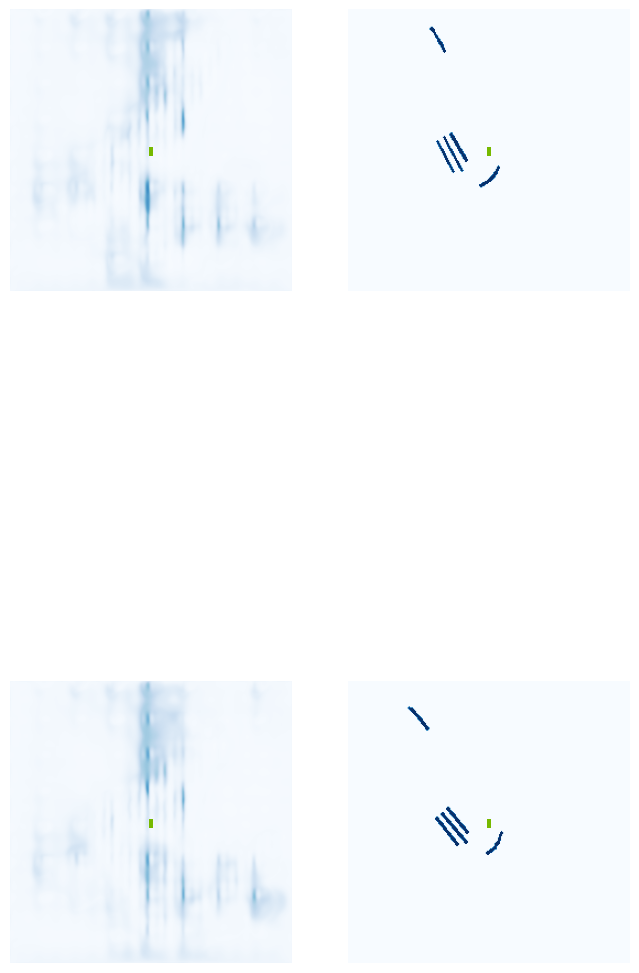

  2%|▎         | 1/40 [00:15<10:00, 15.40s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.01.jpg


 12%|█▎        | 5/40 [00:38<04:24,  7.57s/it]

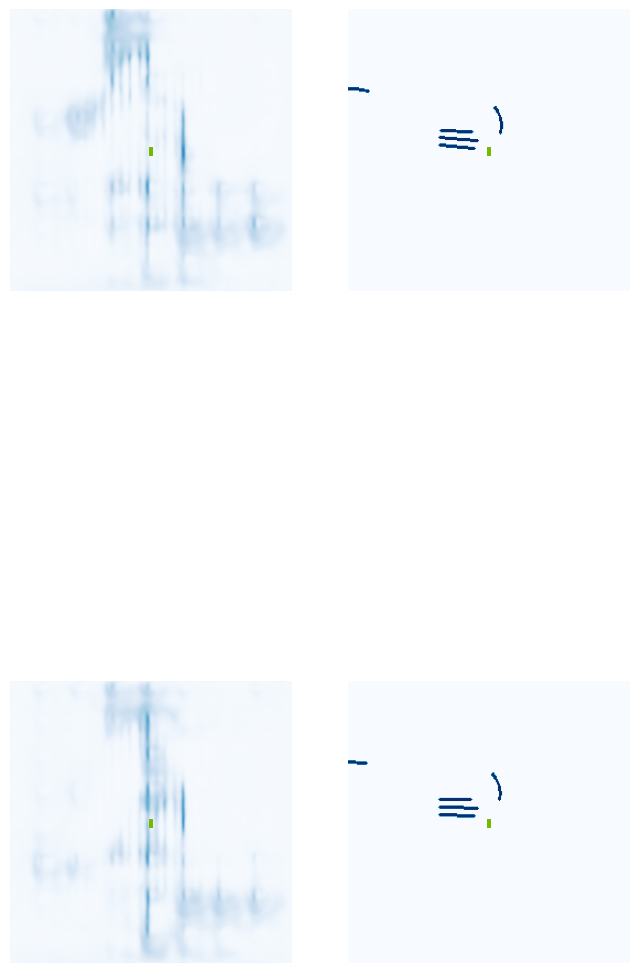

 15%|█▌        | 6/40 [00:38<02:56,  5.20s/it]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [01:03<02:35,  5.17s/it]

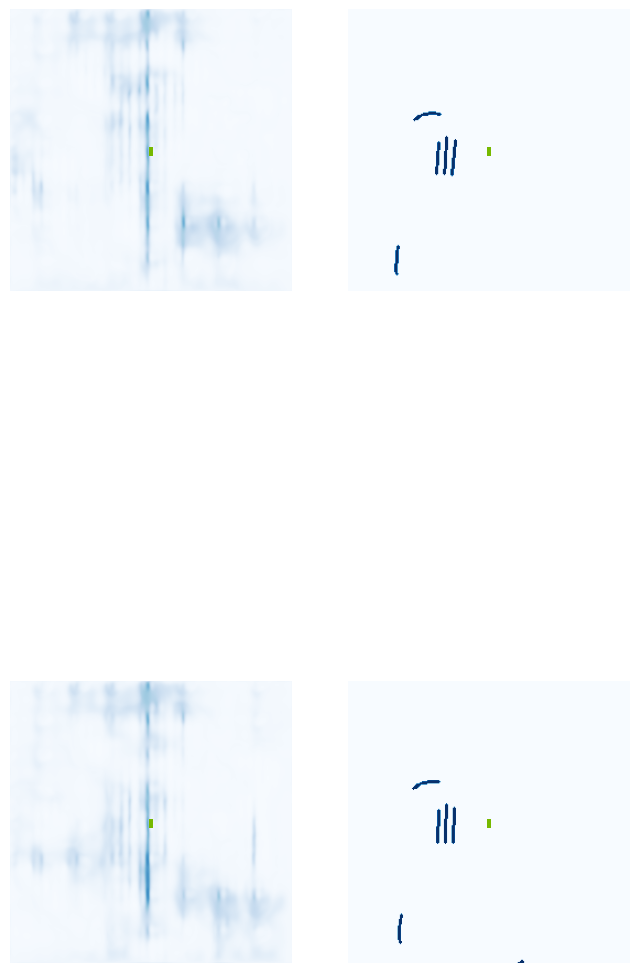

 28%|██▊       | 11/40 [01:18<04:00,  8.28s/it]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [01:44<03:20,  8.01s/it]

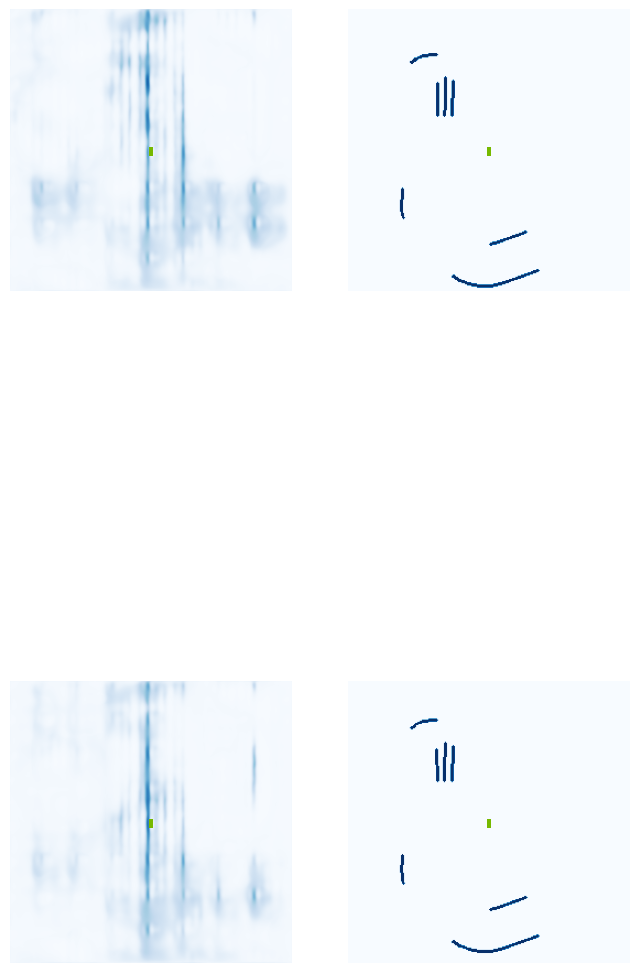

 40%|████      | 16/40 [01:45<02:18,  5.78s/it]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [02:08<01:42,  5.10s/it]

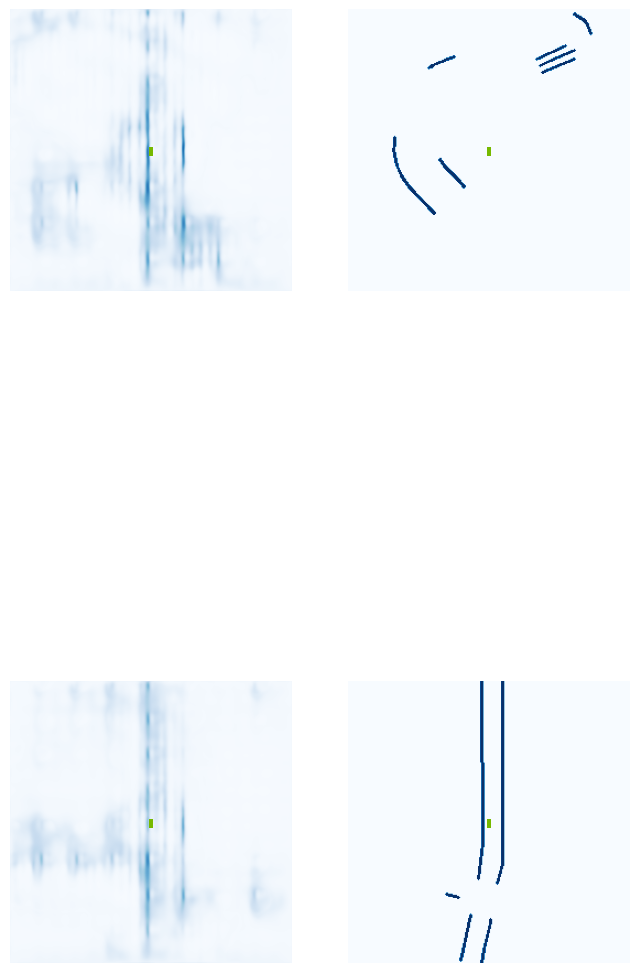

 52%|█████▎    | 21/40 [02:20<02:13,  7.04s/it]

Image saved! ... ./runs/get_val_info/20-iou-0.00.jpg


 62%|██████▎   | 25/40 [02:43<01:42,  6.84s/it]

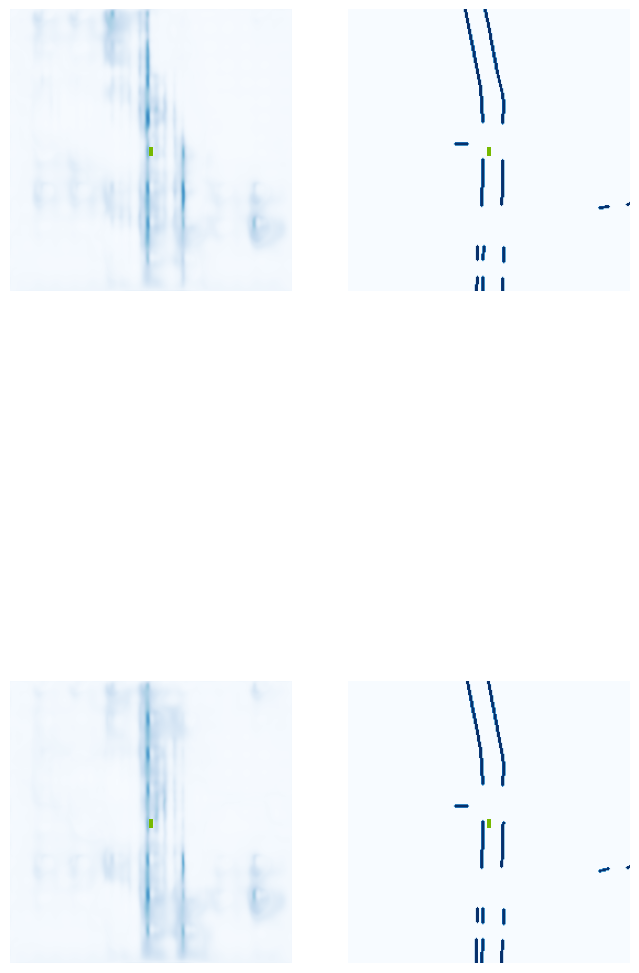

 65%|██████▌   | 26/40 [02:44<01:09,  4.96s/it]

Image saved! ... ./runs/get_val_info/25-iou-0.00.jpg


 75%|███████▌  | 30/40 [03:08<00:50,  5.07s/it]

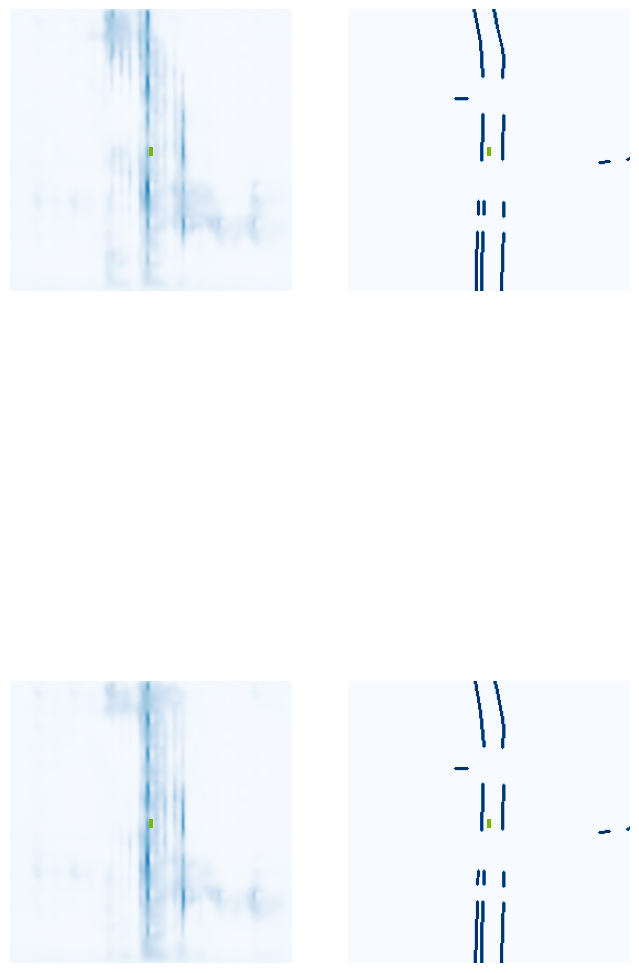

 78%|███████▊  | 31/40 [03:20<01:03,  7.09s/it]

Image saved! ... ./runs/get_val_info/30-iou-0.01.jpg


 88%|████████▊ | 35/40 [03:43<00:34,  6.89s/it]

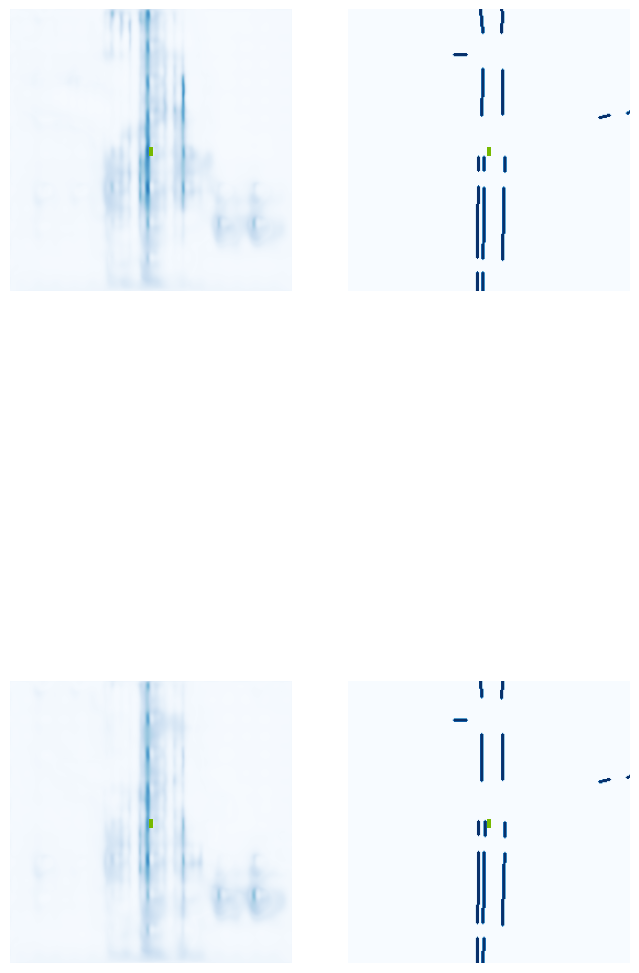

 90%|█████████ | 36/40 [03:44<00:19,  5.00s/it]

Image saved! ... ./runs/get_val_info/35-iou-0.04.jpg


100%|██████████| 40/40 [04:09<00:00,  6.23s/it]


VAL {'loss': 0.13075380965515418, 'iou': 0.010904148057418555}
saving ...  ./runs/model500.pt
510 0.14583377540111542
520 0.22056947648525238
530 0.2296387106180191
540 0.15915744006633759
550 0.16735777258872986
560 0.24018791317939758
570 0.19343909621238708
580 0.11823727190494537
590 0.17134764790534973
600 0.1476336121559143
610 0.12619361281394958
620 0.19474224746227264
630 0.18972352147102356
640 0.15177682042121887
Epoch: 5/60
650 0.17949581146240234
660 0.1200312152504921
670 0.17392820119857788
680 0.149562805891037
690 0.29905468225479126
700 0.13638794422149658
710 0.12878501415252686
720 0.12976975739002228
730 0.12447094917297363
740 0.1825384646654129
750 0.136430025100708
760 0.10745768249034882
770 0.1215972900390625
780 0.11229084432125092
790 0.14836394786834717
800 0.11081401258707047
Epoch: 6/60
810 0.1662103831768036
820 0.12006451934576035
830 0.16160137951374054
840 0.08419711887836456
850 0.089532271027565
860 0.10923776030540466
870 0.24430081248283386
880 0.

  0%|          | 0/40 [00:00<?, ?it/s]

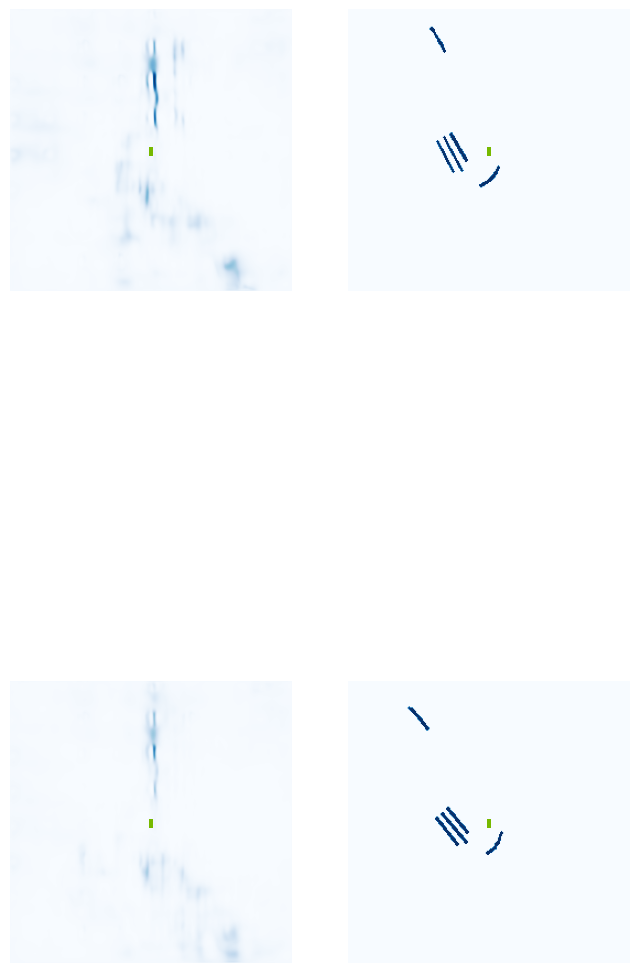

  2%|▎         | 1/40 [00:01<00:46,  1.18s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.75it/s]

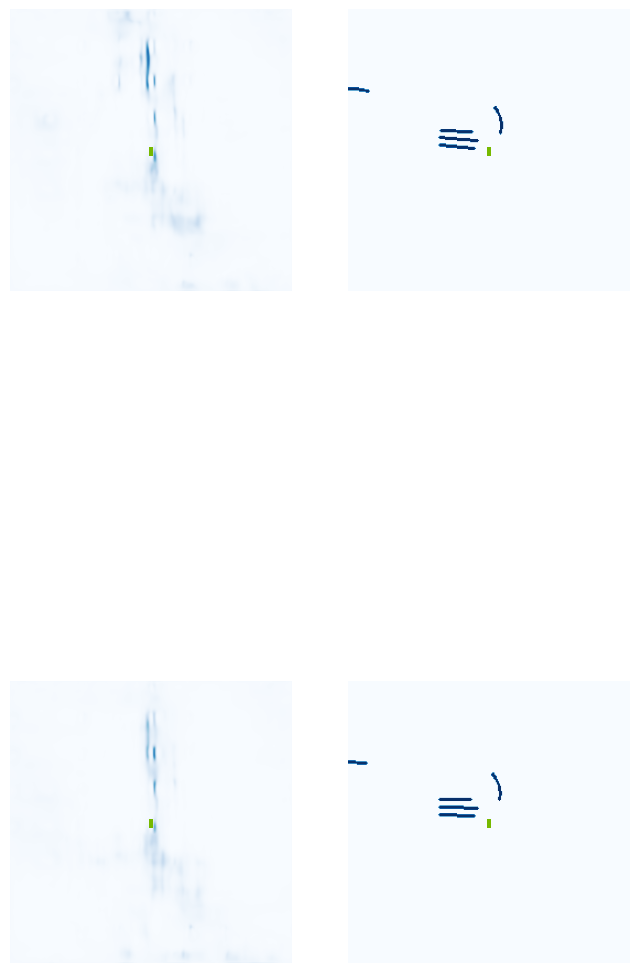

 15%|█▌        | 6/40 [00:02<00:14,  2.31it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.15it/s]

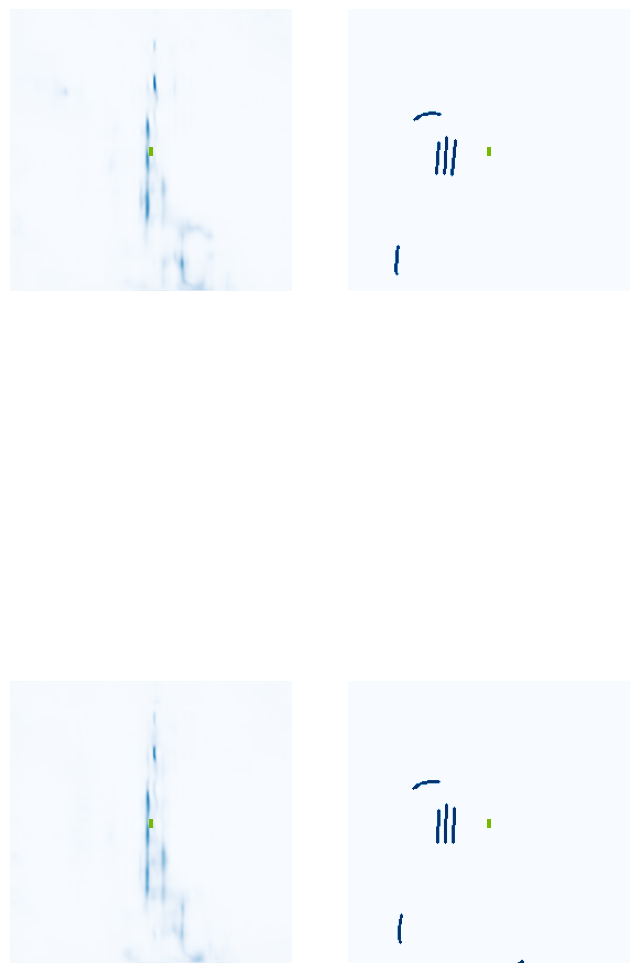

 28%|██▊       | 11/40 [00:04<00:11,  2.55it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.21it/s]

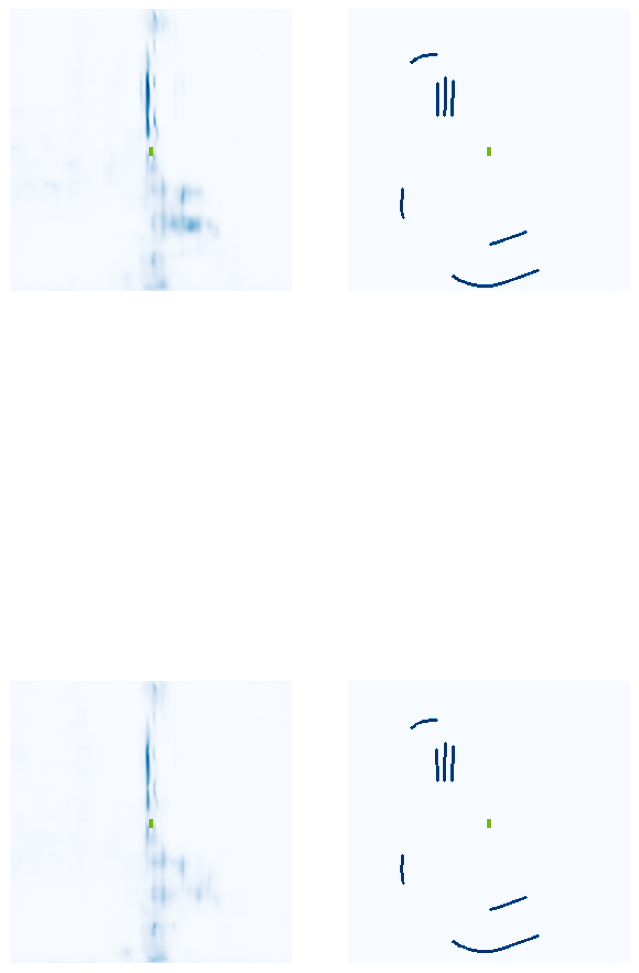

 40%|████      | 16/40 [00:06<00:09,  2.55it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.22it/s]

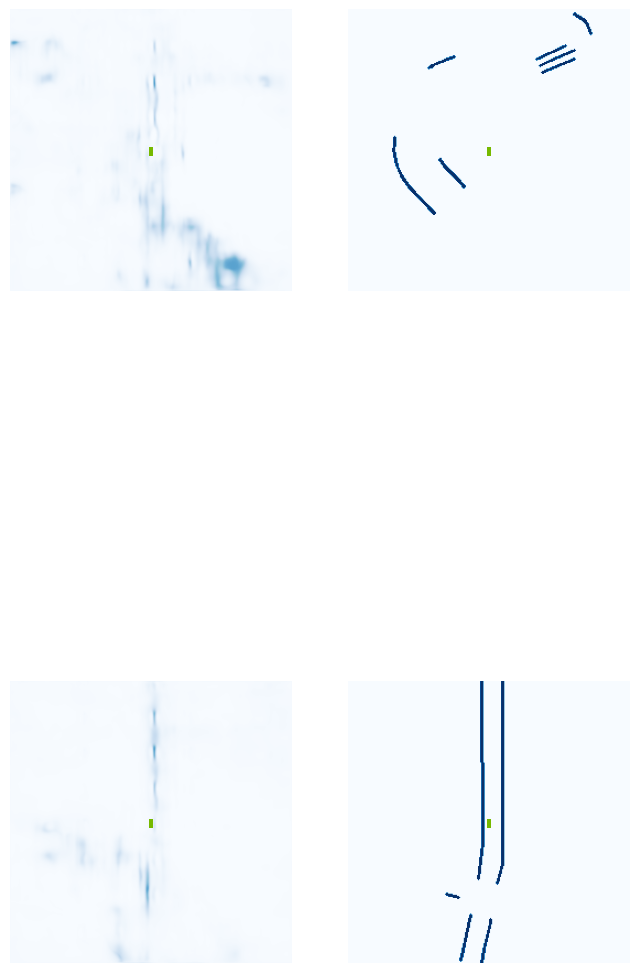

 52%|█████▎    | 21/40 [00:08<00:07,  2.58it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.00.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.18it/s]

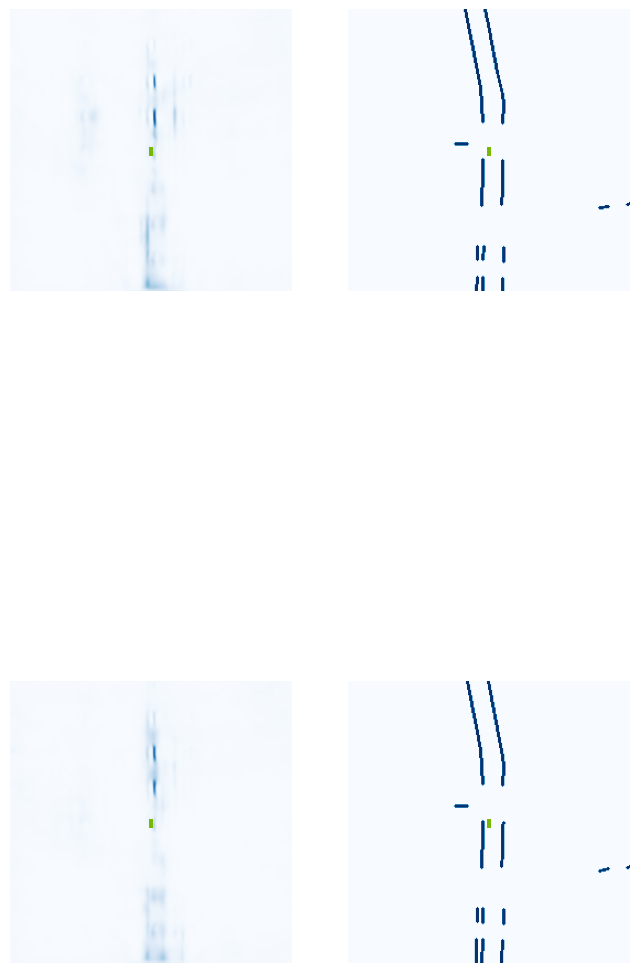

 65%|██████▌   | 26/40 [00:09<00:05,  2.55it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.00.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.20it/s]

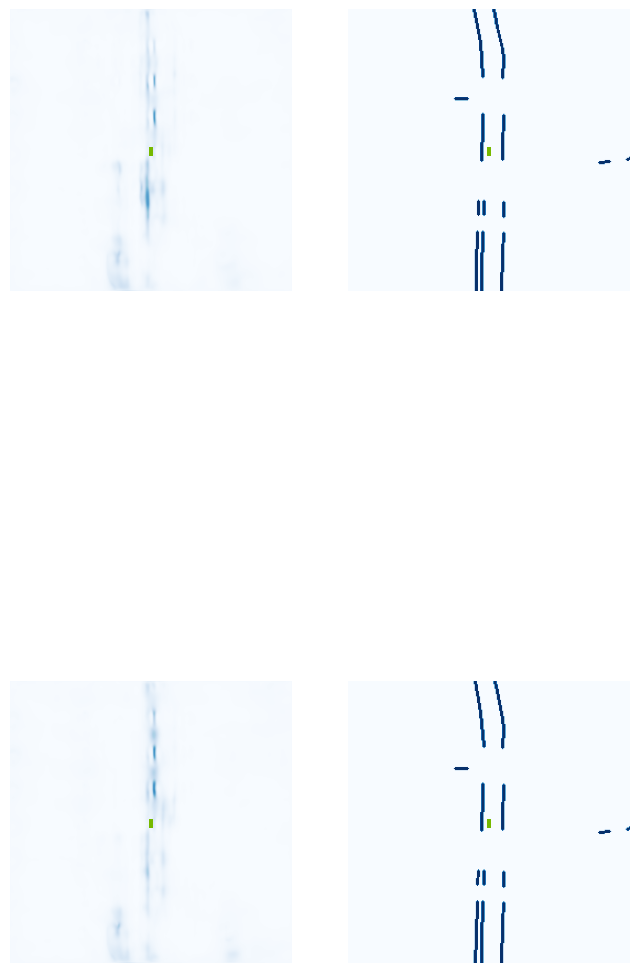

 78%|███████▊  | 31/40 [00:11<00:04,  2.04it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.00.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  2.98it/s]

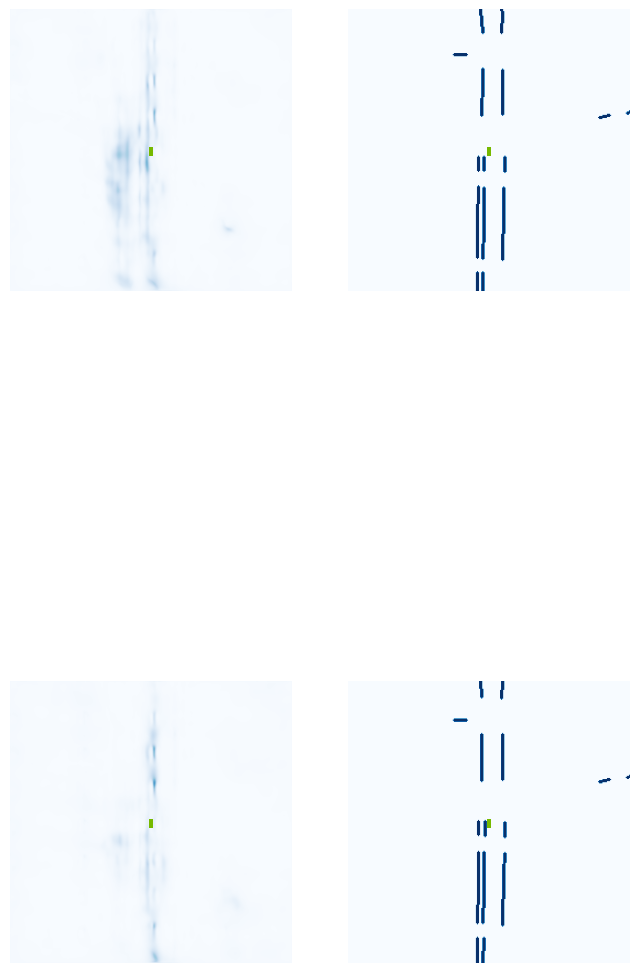

 90%|█████████ | 36/40 [00:13<00:01,  2.49it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.00.jpg


100%|██████████| 40/40 [00:14<00:00,  2.72it/s]


VAL {'loss': 0.13919615543182987, 'iou': 0.0021820706528028035}
saving ...  ./runs/model1000.pt
1010 0.12858879566192627
1020 0.12264543026685715
1030 0.11710405349731445
1040 0.09194990992546082
1050 0.10404442250728607
1060 0.15422460436820984
1070 0.07967925071716309
1080 0.10626136511564255
1090 0.09115409851074219
1100 0.1288023293018341
1110 0.21773791313171387
1120 0.1420617401599884
Epoch: 8/60
1130 0.15966583788394928
1140 0.13085786998271942
1150 0.1725165992975235
1160 0.12822121381759644
1170 0.12045833468437195
1180 0.09896686673164368
1190 0.17399558424949646
1200 0.19066128134727478
1210 0.06838883459568024
1220 0.11032671481370926
1230 0.14164531230926514
1240 0.11115435510873795
1250 0.22566074132919312
1260 0.08013011515140533
1270 0.10692279785871506
1280 0.1873137652873993
Epoch: 9/60
1290 0.17305827140808105
1300 0.12356336414813995
1310 0.14825160801410675
1320 0.10314089059829712
1330 0.12885689735412598
1340 0.10096906125545502
1350 0.11305216699838638
1360 0.09

  0%|          | 0/40 [00:00<?, ?it/s]

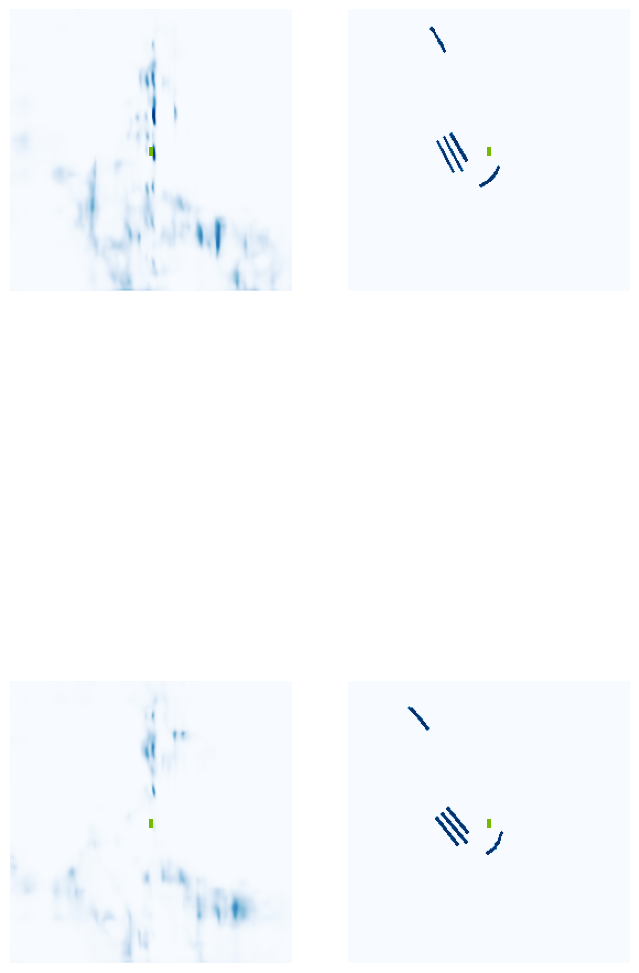

  2%|▎         | 1/40 [00:01<00:49,  1.27s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:13,  2.66it/s]

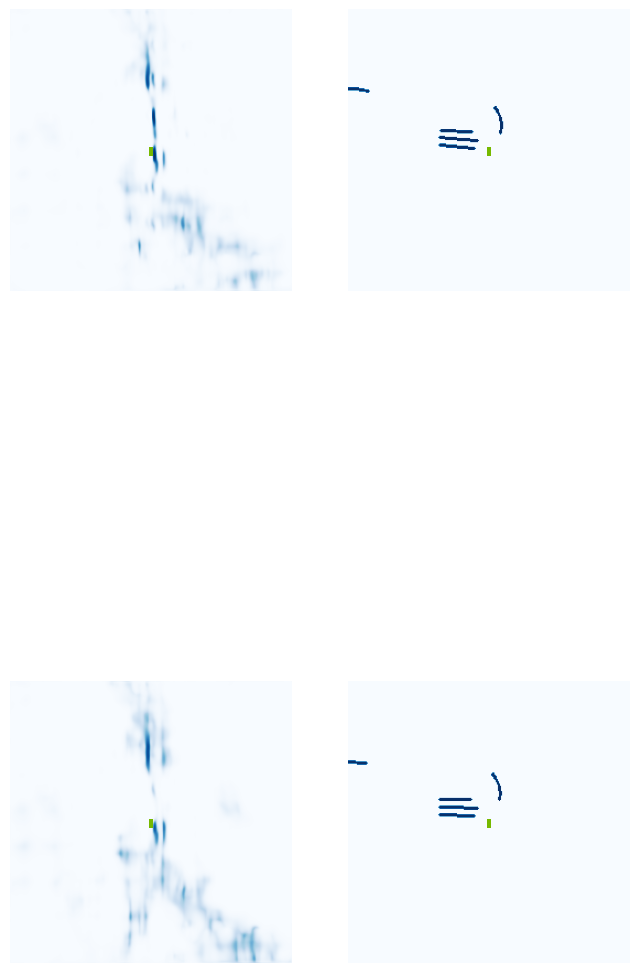

 15%|█▌        | 6/40 [00:03<00:18,  1.81it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:10,  2.91it/s]

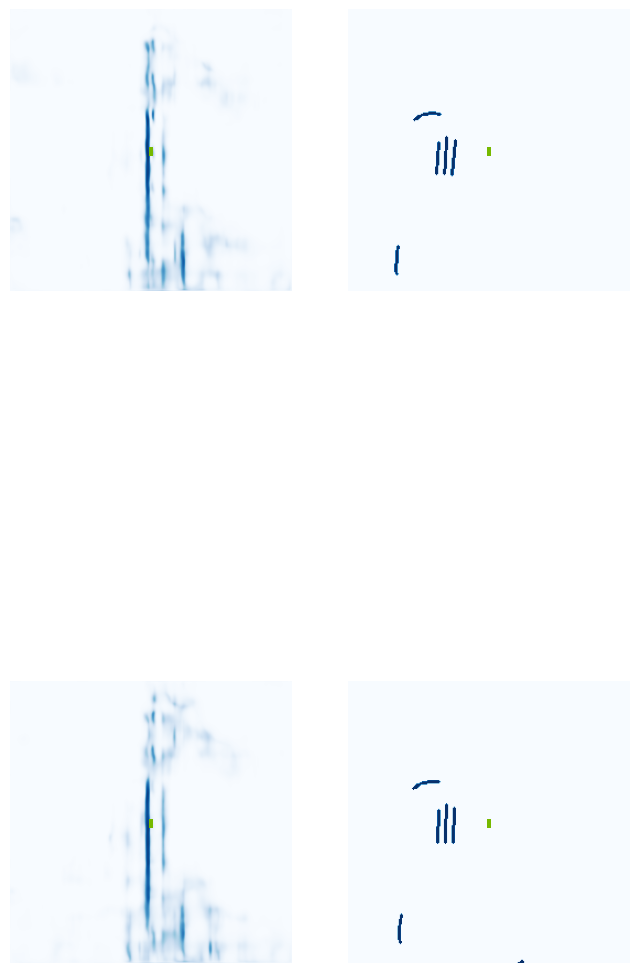

 28%|██▊       | 11/40 [00:05<00:11,  2.43it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:06<00:07,  3.17it/s]

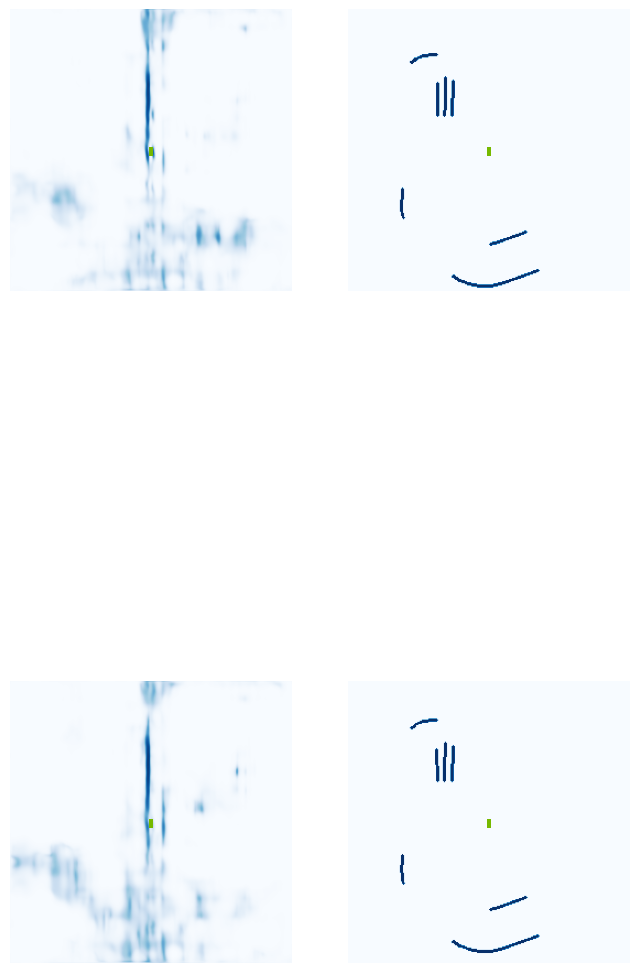

 40%|████      | 16/40 [00:06<00:09,  2.55it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.21it/s]

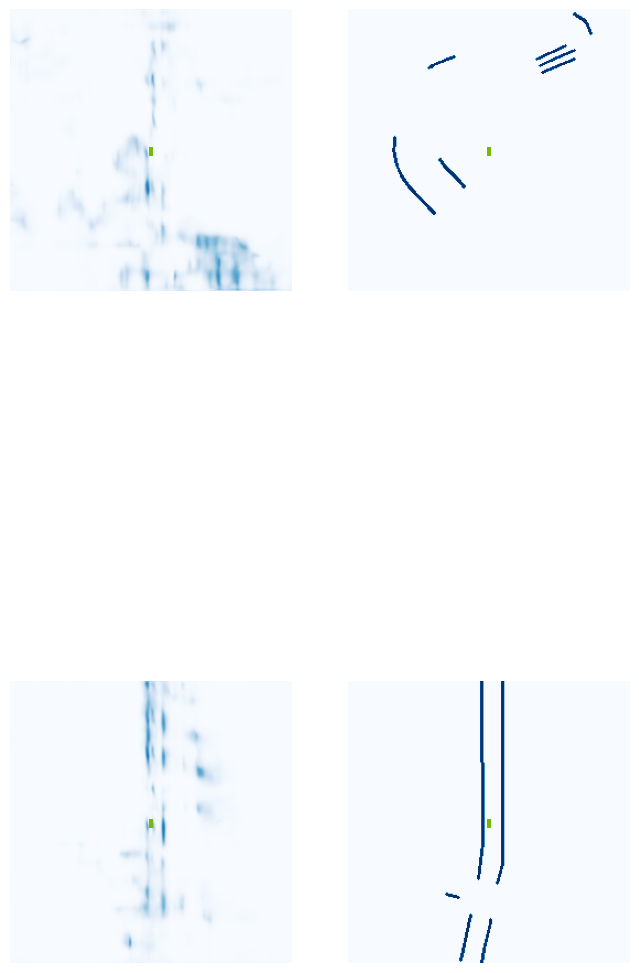

 52%|█████▎    | 21/40 [00:08<00:07,  2.57it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.03.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.20it/s]

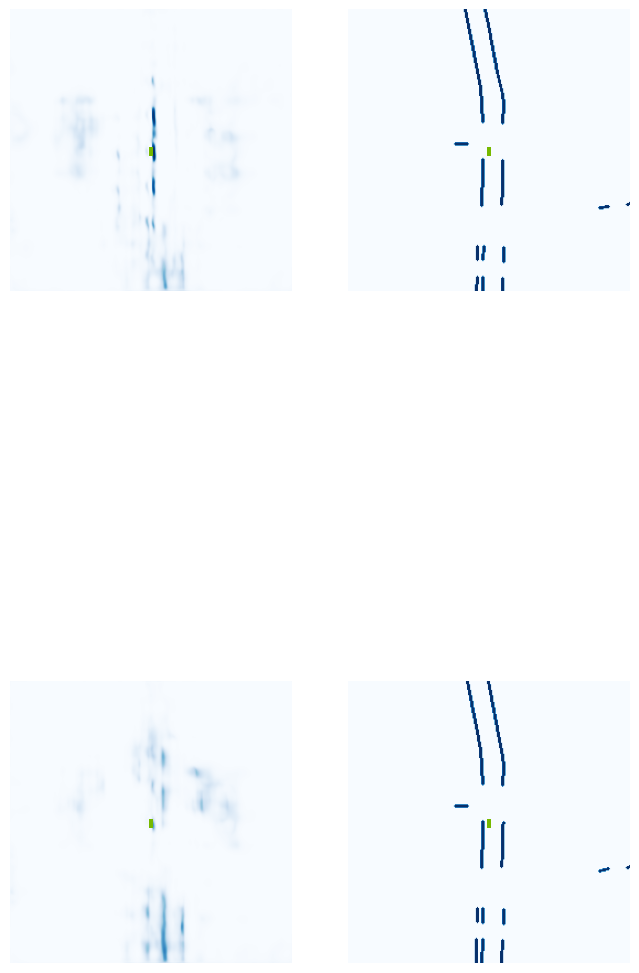

 65%|██████▌   | 26/40 [00:10<00:05,  2.57it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.00.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.22it/s]

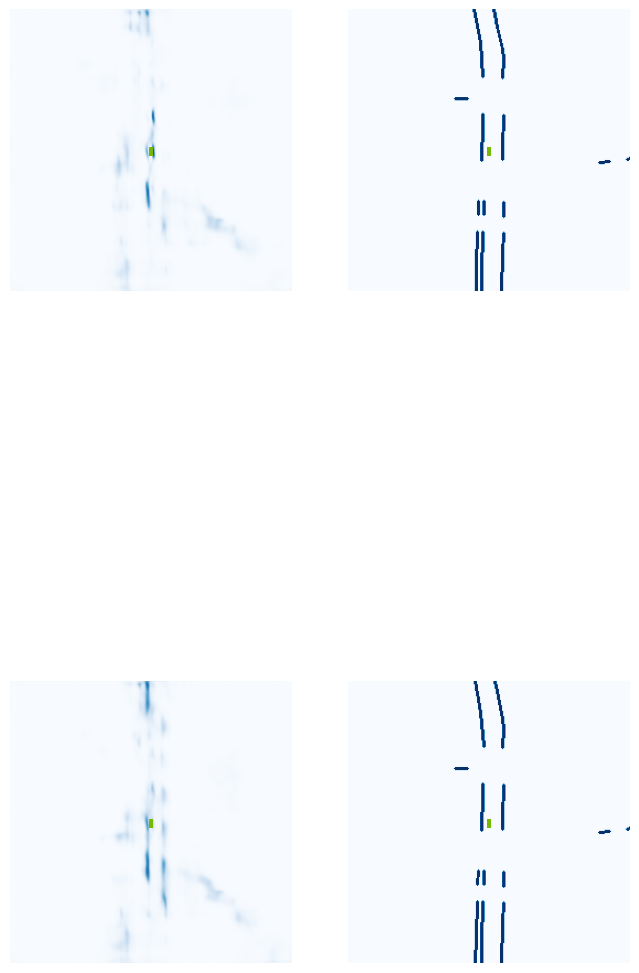

 78%|███████▊  | 31/40 [00:11<00:03,  2.58it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.01.jpg


 88%|████████▊ | 35/40 [00:13<00:01,  3.20it/s]

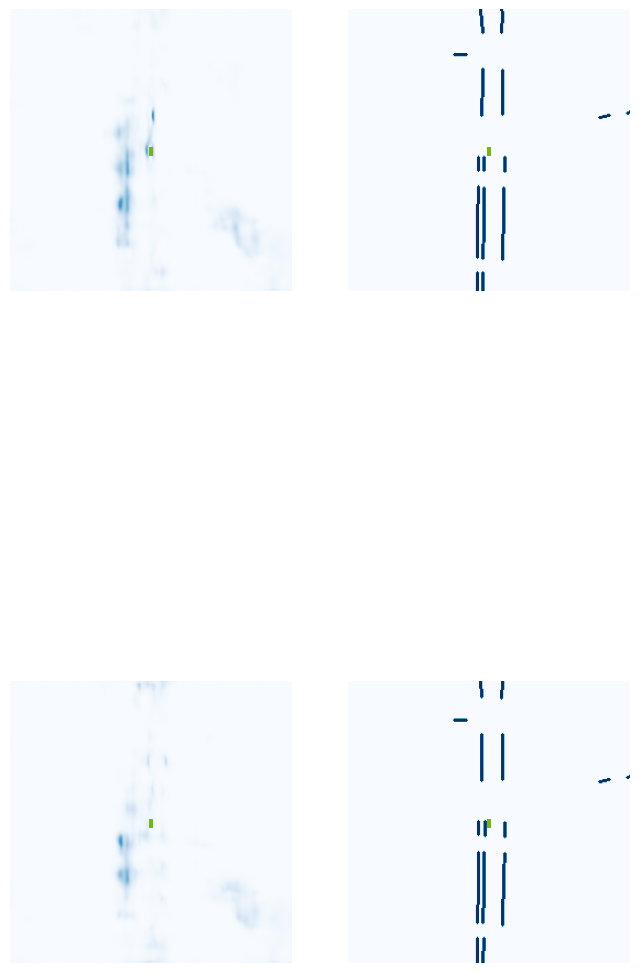

 90%|█████████ | 36/40 [00:13<00:01,  2.56it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.00.jpg


100%|██████████| 40/40 [00:14<00:00,  2.70it/s]


VAL {'loss': 0.1738908690066985, 'iou': 0.004757425810057389}
saving ...  ./runs/model1500.pt
1510 0.05284995585680008
1520 0.04214150458574295
1530 0.0736592710018158
1540 0.09598815441131592
1550 0.08897089958190918
1560 0.2049228549003601
1570 0.09817181527614594
1580 0.1311819702386856
1590 0.14071932435035706
1600 0.08174452185630798
1610 0.11589762568473816
Epoch: 11/60
1620 0.045603975653648376
1630 0.07091695070266724
1640 0.21001769602298737
1650 0.0933772474527359
1660 0.09949325025081635
1670 0.09012594819068909
1680 0.15082137286663055
1690 0.1119469404220581
1700 0.09134018421173096
1710 0.1255493015050888
1720 0.07394136488437653
1730 0.12424421310424805
1740 0.10465122759342194
1750 0.07124591618776321
1760 0.10571544617414474
1770 0.05444619432091713
Epoch: 12/60
1780 0.09383711218833923
1790 0.09397126734256744
1800 0.16429093480110168
1810 0.1046571135520935
1820 0.08061078935861588
1830 0.04846573993563652
1840 0.09776295721530914
1850 0.04906580597162247
1860 0.1207

  0%|          | 0/40 [00:00<?, ?it/s]

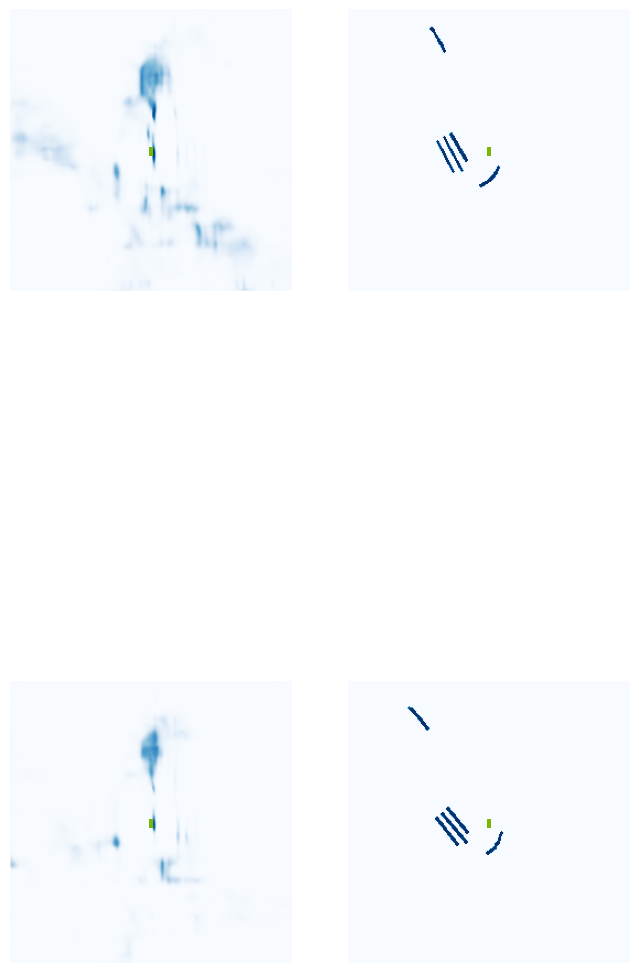

  2%|▎         | 1/40 [00:01<00:47,  1.22s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.01.jpg


 12%|█▎        | 5/40 [00:02<00:13,  2.67it/s]

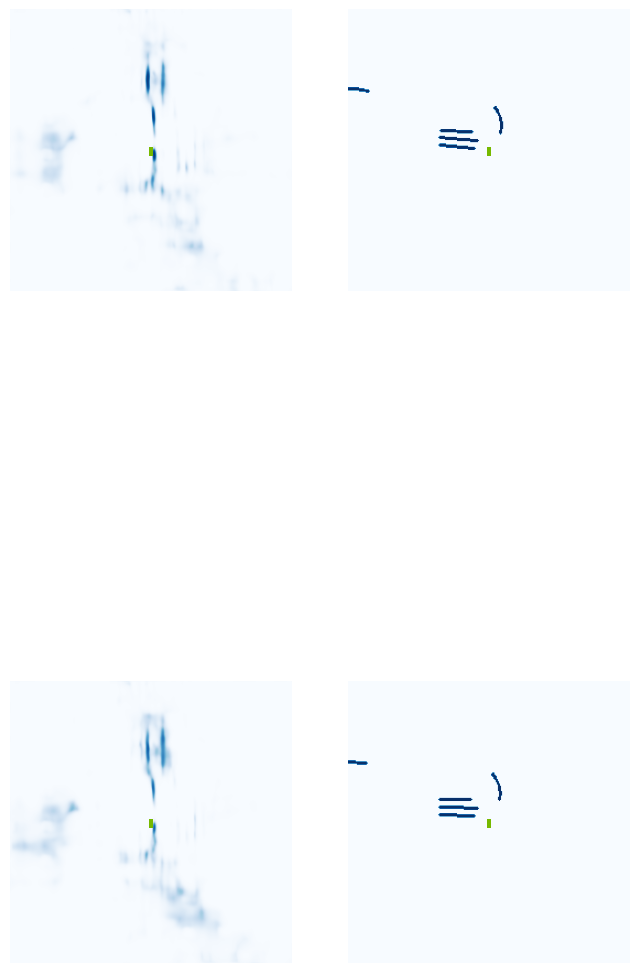

 15%|█▌        | 6/40 [00:02<00:15,  2.23it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.11it/s]

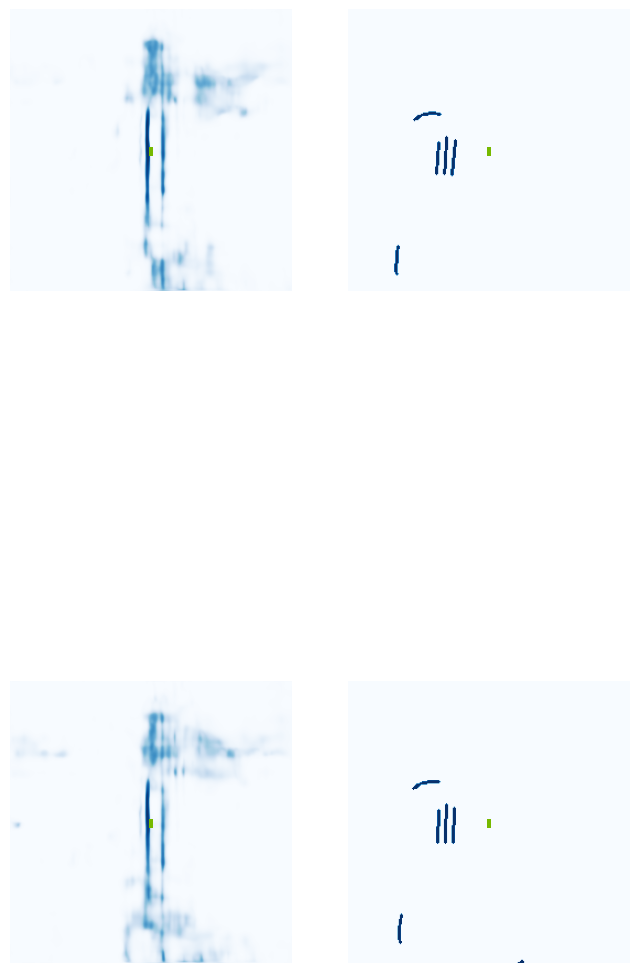

 28%|██▊       | 11/40 [00:04<00:11,  2.50it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.17it/s]

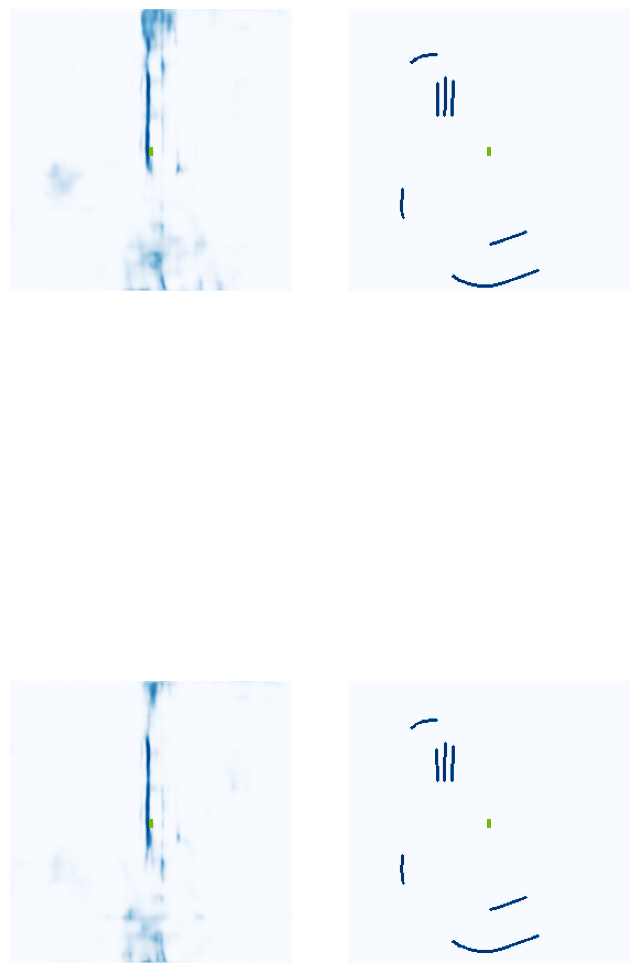

 40%|████      | 16/40 [00:06<00:09,  2.56it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.21it/s]

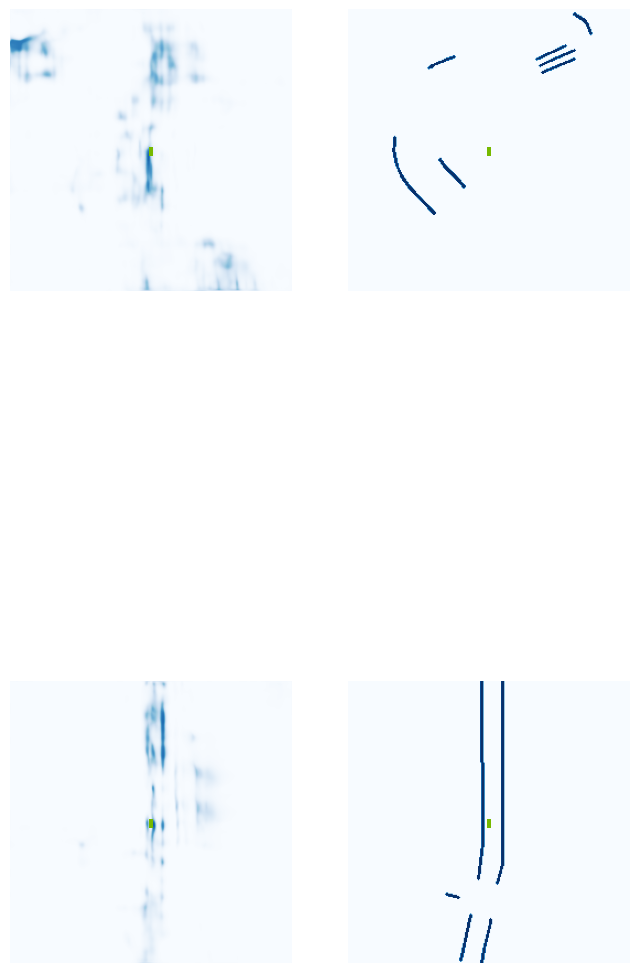

 52%|█████▎    | 21/40 [00:08<00:07,  2.57it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.03.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.19it/s]

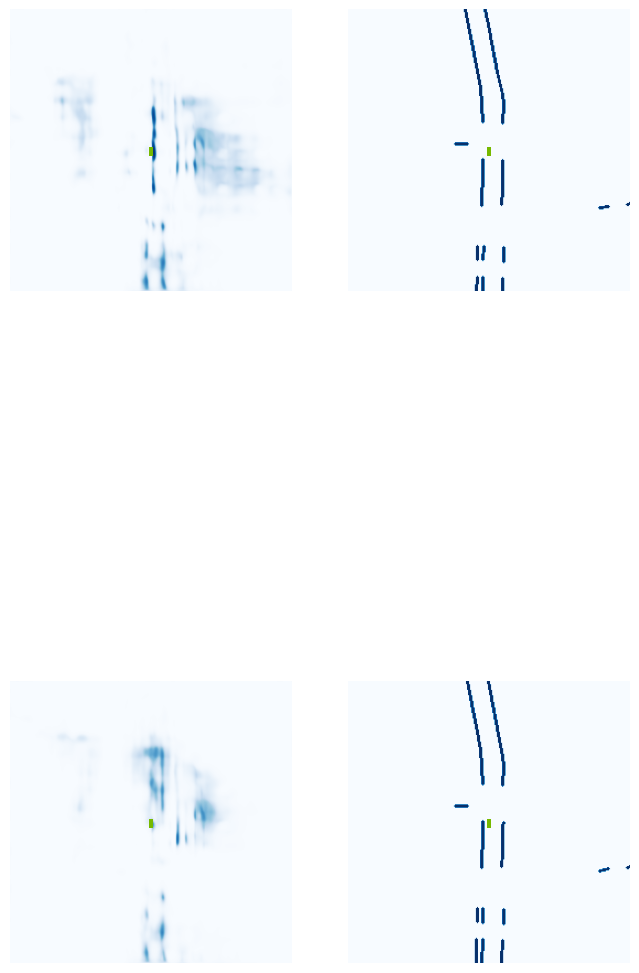

 65%|██████▌   | 26/40 [00:09<00:05,  2.56it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.01.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.21it/s]

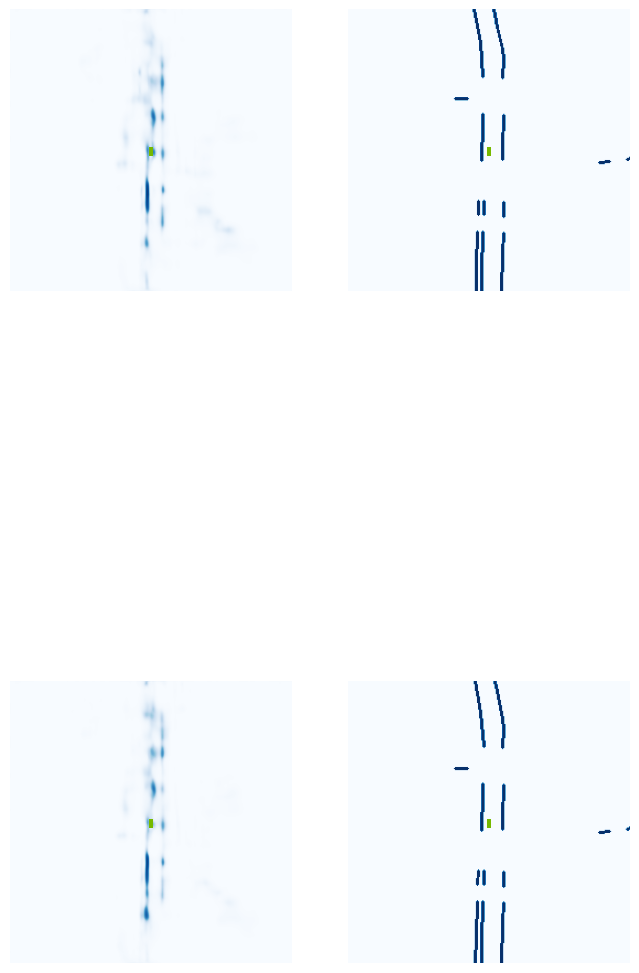

 78%|███████▊  | 31/40 [00:11<00:03,  2.60it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.04.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.22it/s]

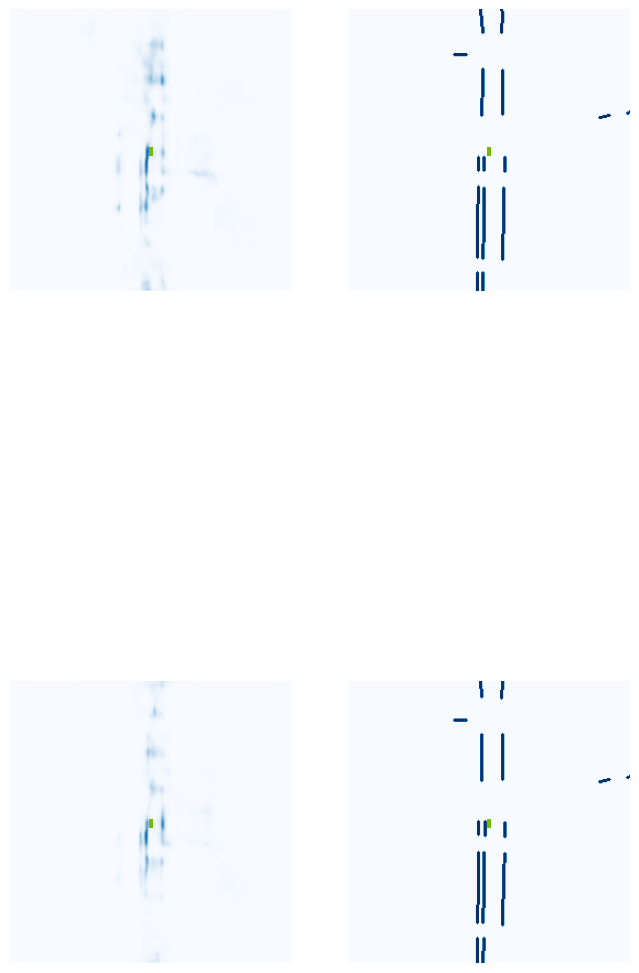

 90%|█████████ | 36/40 [00:13<00:01,  2.60it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.03.jpg


100%|██████████| 40/40 [00:14<00:00,  2.76it/s]


VAL {'loss': 0.16454237129217314, 'iou': 0.02152546806681864}
saving ...  ./runs/model2000.pt
2010 0.06333841383457184
2020 0.1085275262594223
2030 0.14433106780052185
2040 0.09886406362056732
2050 0.11532418429851532
2060 0.14829900860786438
2070 0.11050157248973846
2080 0.09811954200267792
2090 0.09994770586490631
Epoch: 14/60
2100 0.09174764156341553
2110 0.07232648134231567
2120 0.08666222542524338
2130 0.034514956176280975
2140 0.05453053116798401
2150 0.190902441740036
2160 0.1382310539484024
2170 0.054359979927539825
2180 0.08114725351333618
2190 0.047087594866752625
2200 0.06028934568166733
2210 0.042483121156692505
2220 0.11686055362224579
2230 0.0636669397354126
2240 0.0790812149643898
2250 0.08051234483718872
Epoch: 15/60
2260 0.10743778198957443
2270 0.1009339690208435
2280 0.12519896030426025
2290 0.09720055013895035
2300 0.14038752019405365
2310 0.10962598025798798
2320 0.15413130819797516
2330 0.06874755024909973
2340 0.0725369080901146
2350 0.06898681819438934
2360 0.07

  0%|          | 0/40 [00:00<?, ?it/s]

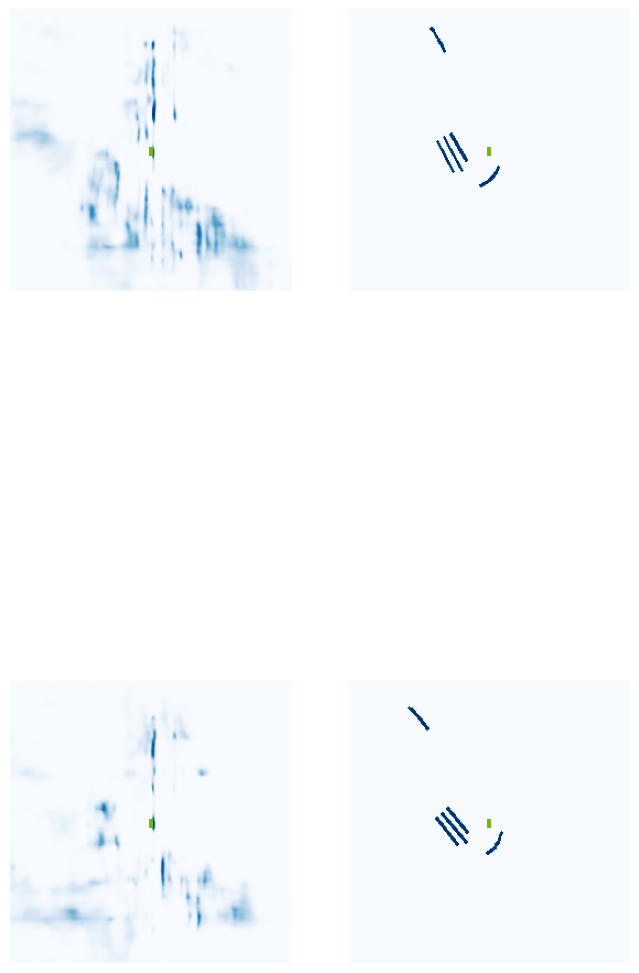

  2%|▎         | 1/40 [00:01<00:47,  1.21s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.73it/s]

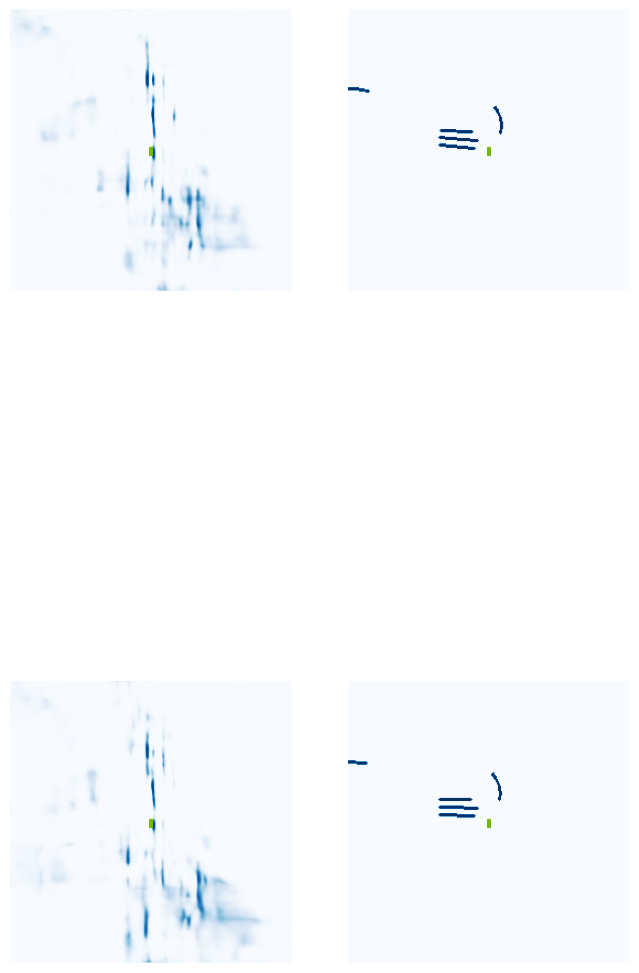

 15%|█▌        | 6/40 [00:02<00:14,  2.29it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.14it/s]

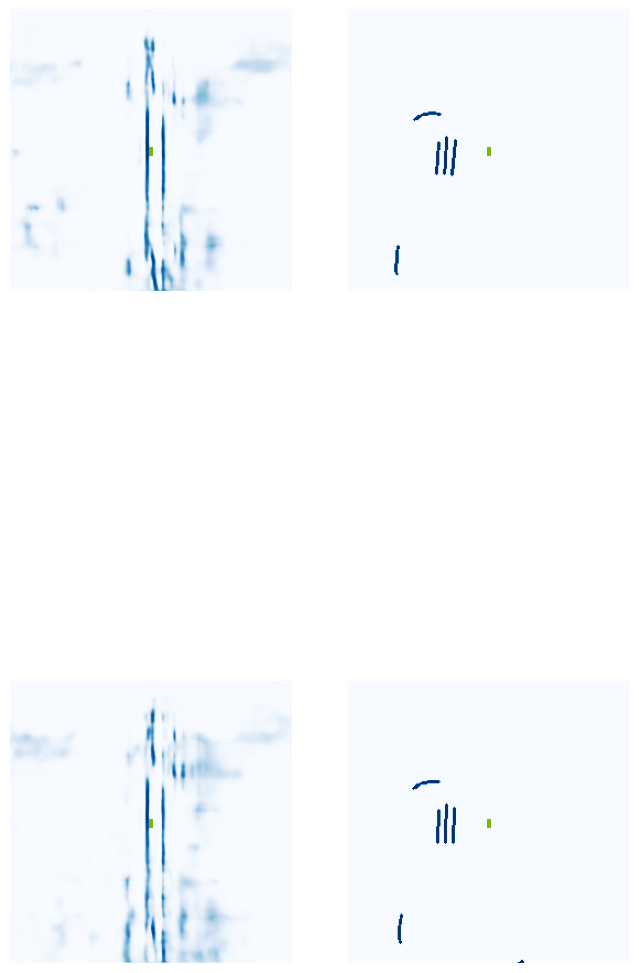

 28%|██▊       | 11/40 [00:04<00:11,  2.50it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.19it/s]

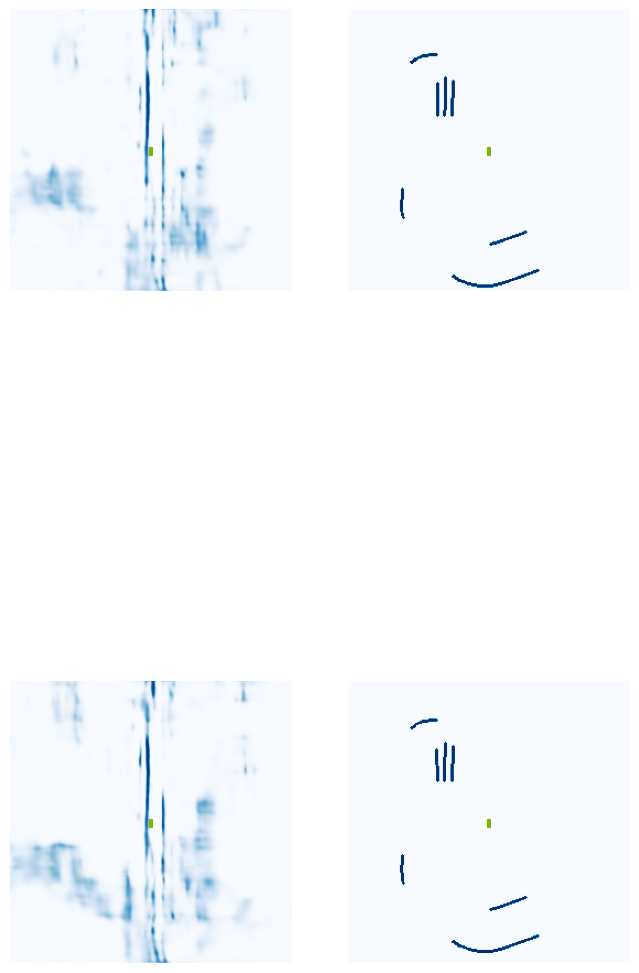

 40%|████      | 16/40 [00:06<00:09,  2.55it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.20it/s]

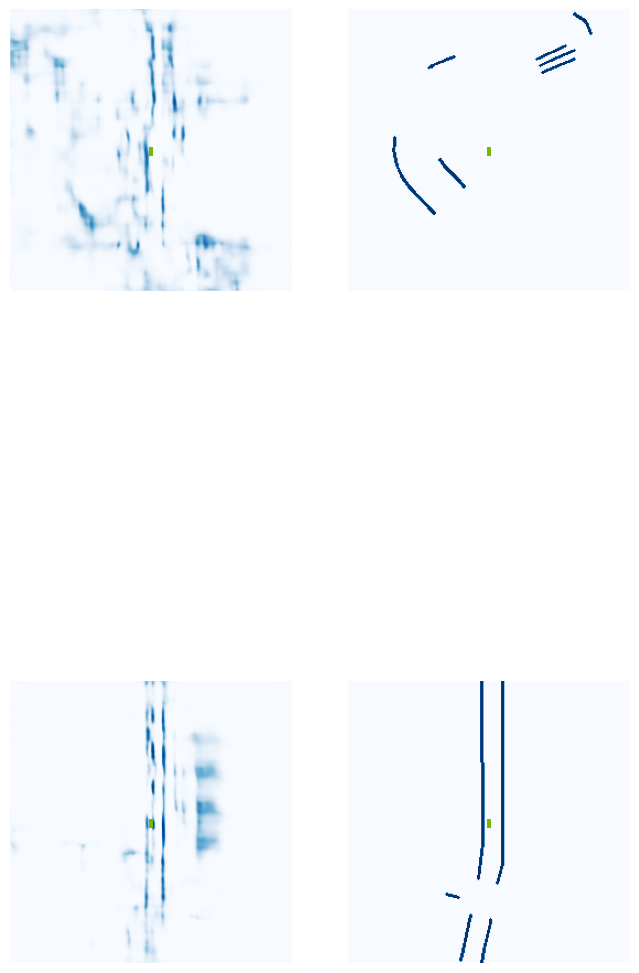

 52%|█████▎    | 21/40 [00:08<00:07,  2.49it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.06.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.16it/s]

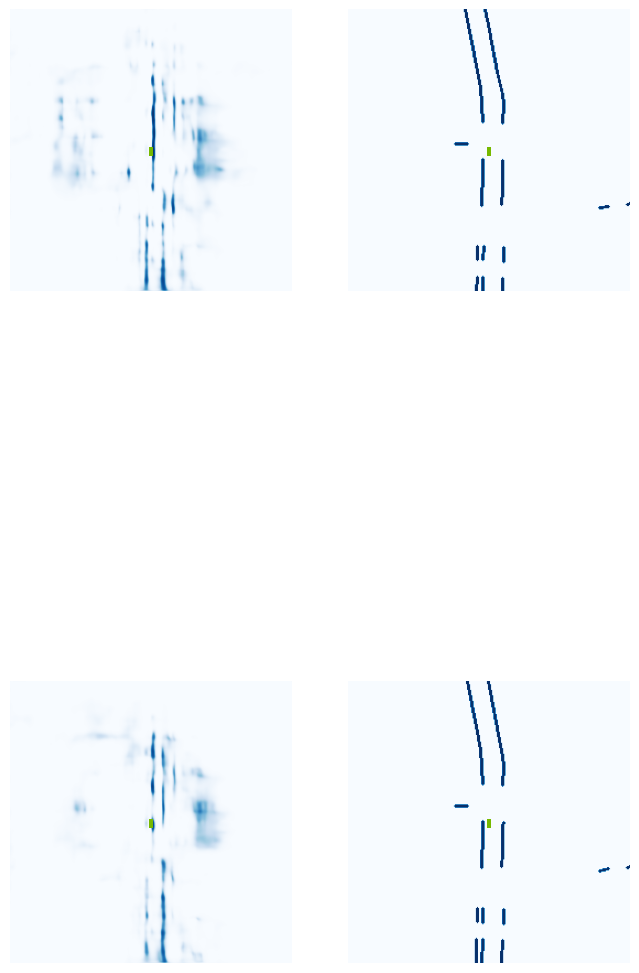

 65%|██████▌   | 26/40 [00:09<00:05,  2.54it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.20it/s]

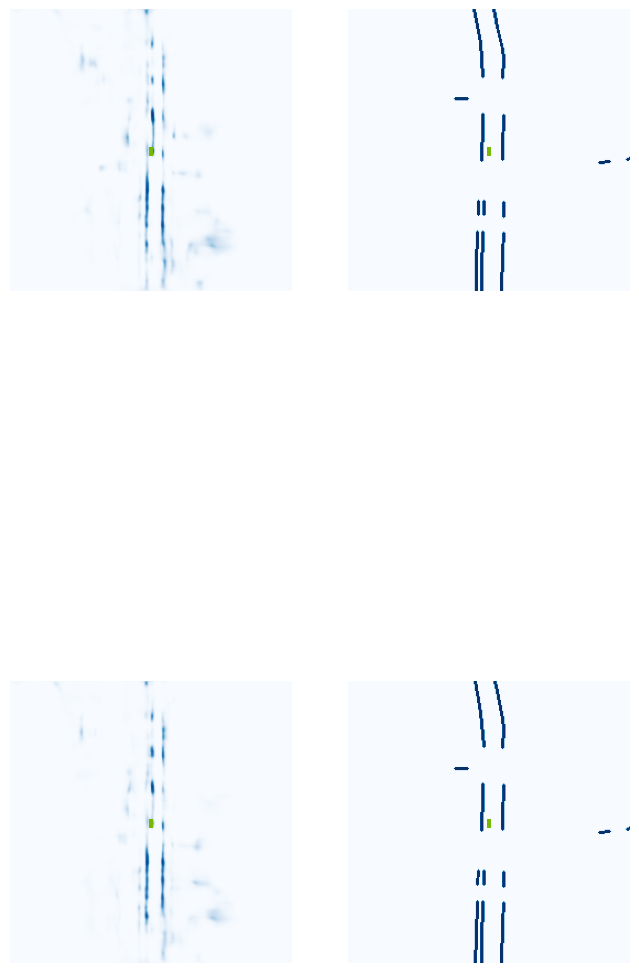

 78%|███████▊  | 31/40 [00:11<00:03,  2.58it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.04.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.23it/s]

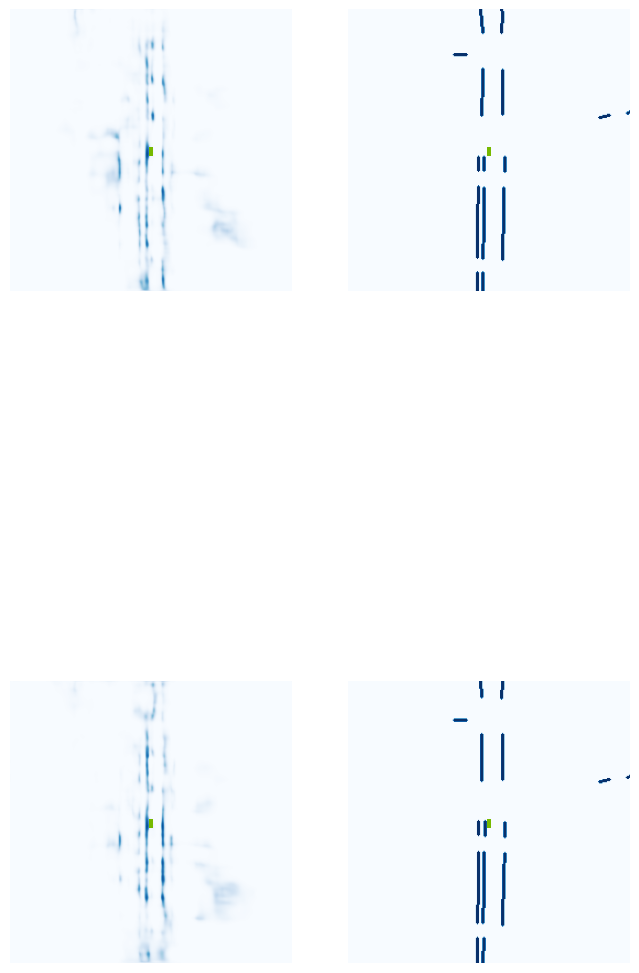

 90%|█████████ | 36/40 [00:13<00:01,  2.55it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.06.jpg


100%|██████████| 40/40 [00:14<00:00,  2.76it/s]


VAL {'loss': 0.17284175440853025, 'iou': 0.039302342312712624}
saving ...  ./runs/model2500.pt
2510 0.08569680154323578
2520 0.10833847522735596
2530 0.16369782388210297
2540 0.06335115432739258
2550 0.07261320948600769
2560 0.13153211772441864
2570 0.12699274718761444
Epoch: 17/60
2580 0.050277747213840485
2590 0.07672449946403503
2600 0.07056090235710144
2610 0.05907613784074783
2620 0.06266046315431595
2630 0.05141846463084221
2640 0.09670529514551163
2650 0.06667685508728027
2660 0.06505344808101654
2670 0.11232942342758179
2680 0.04563642293214798
2690 0.0808454155921936
2700 0.12168769538402557
2710 0.05078592896461487
2720 0.04929241165518761
2730 0.04265614598989487
Epoch: 18/60
2740 0.040889278054237366
2750 0.11970333755016327
2760 0.03072476014494896
2770 0.051540177315473557
2780 0.134645476937294
2790 0.04689016938209534
2800 0.07020892202854156
2810 0.06691350042819977
2820 0.03990798816084862
2830 0.04678019881248474
2840 0.08429469913244247
2850 0.09930006414651871
2860

  0%|          | 0/40 [00:00<?, ?it/s]

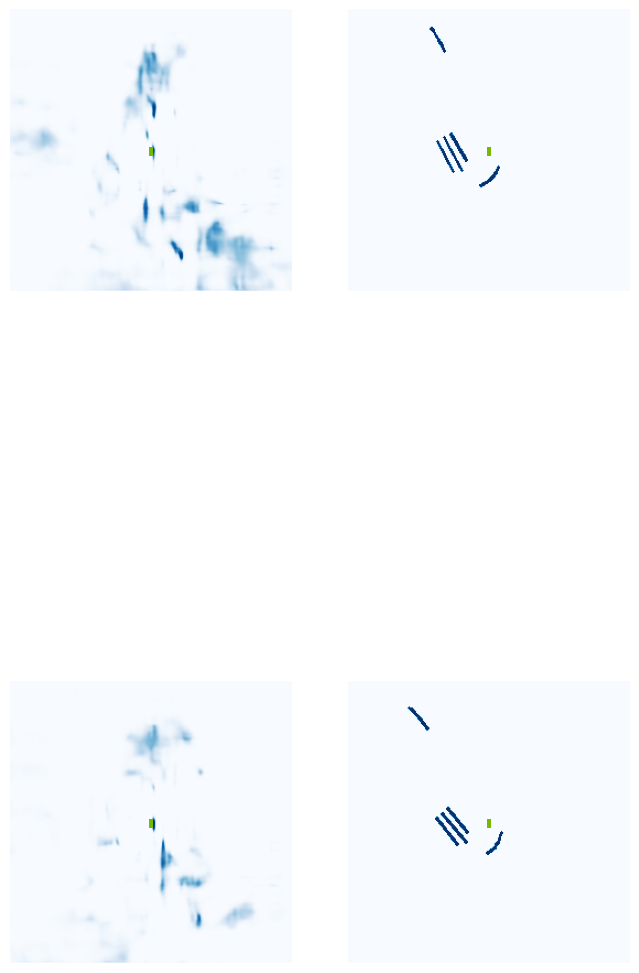

  2%|▎         | 1/40 [00:01<00:47,  1.22s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:13,  2.69it/s]

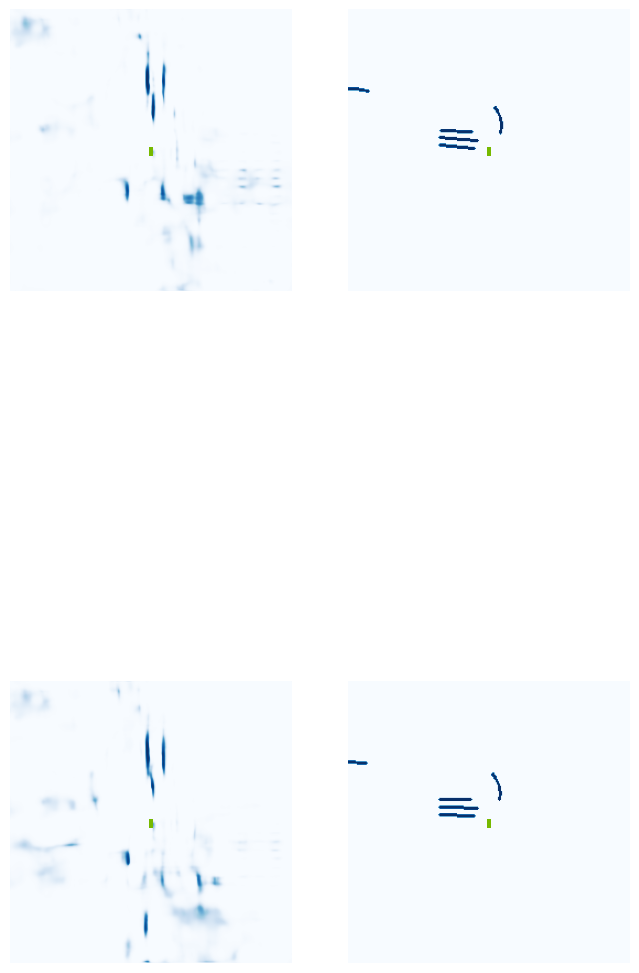

 15%|█▌        | 6/40 [00:02<00:14,  2.28it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.14it/s]

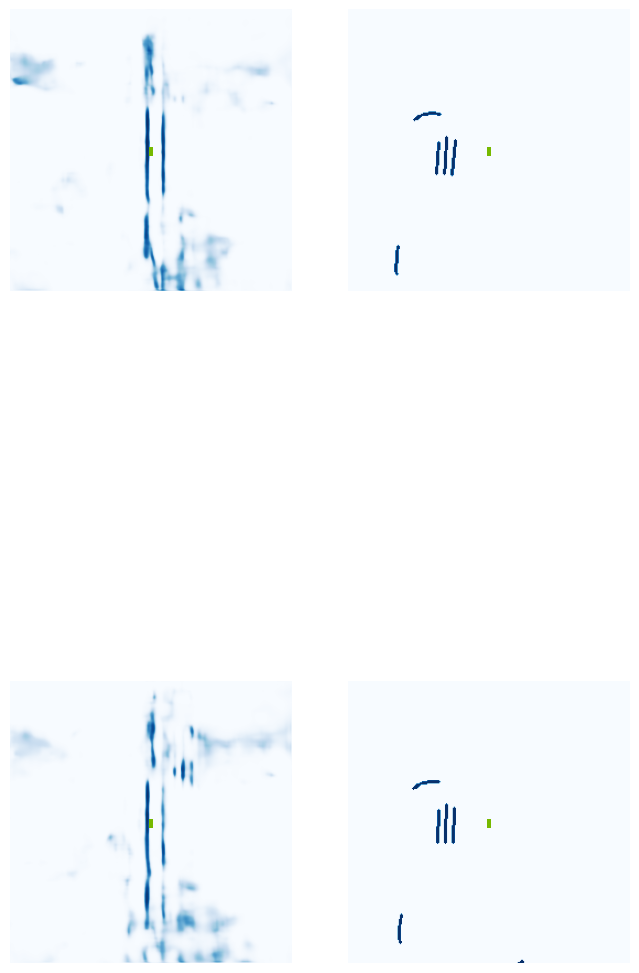

 28%|██▊       | 11/40 [00:04<00:11,  2.53it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.20it/s]

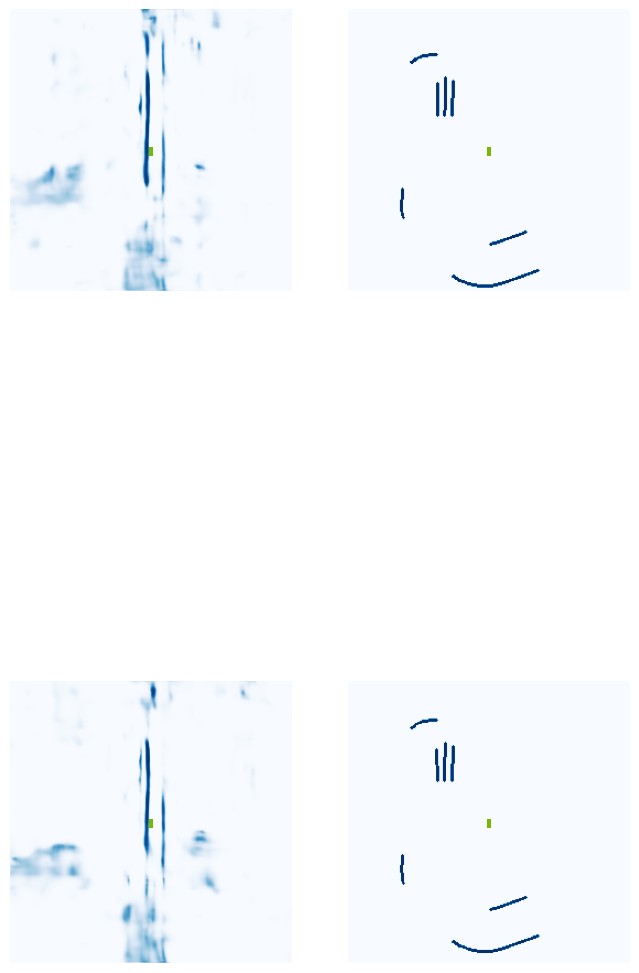

 40%|████      | 16/40 [00:06<00:09,  2.54it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.22it/s]

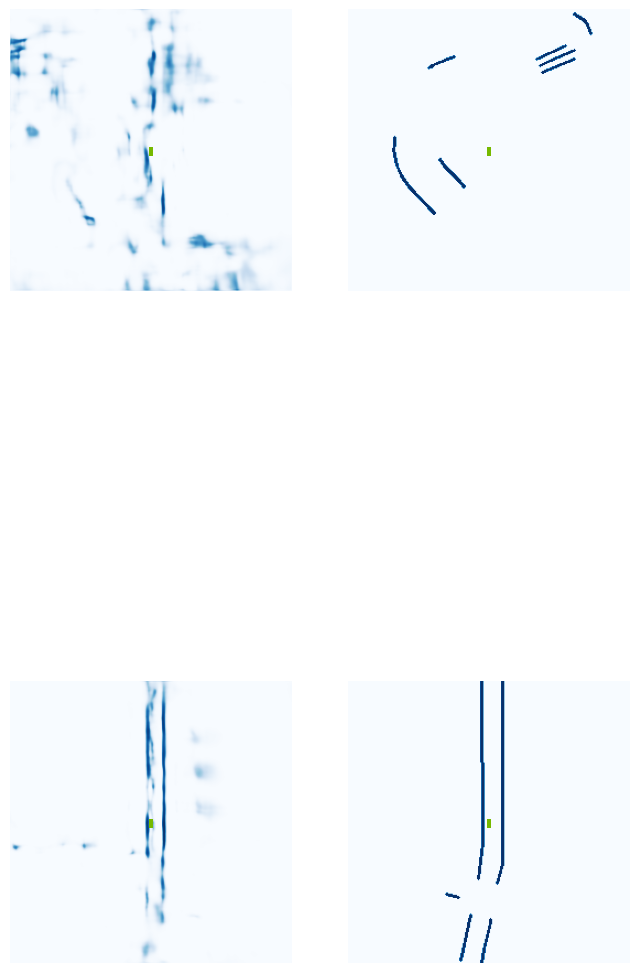

 52%|█████▎    | 21/40 [00:08<00:09,  2.05it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.11.jpg


 62%|██████▎   | 25/40 [00:09<00:05,  2.98it/s]

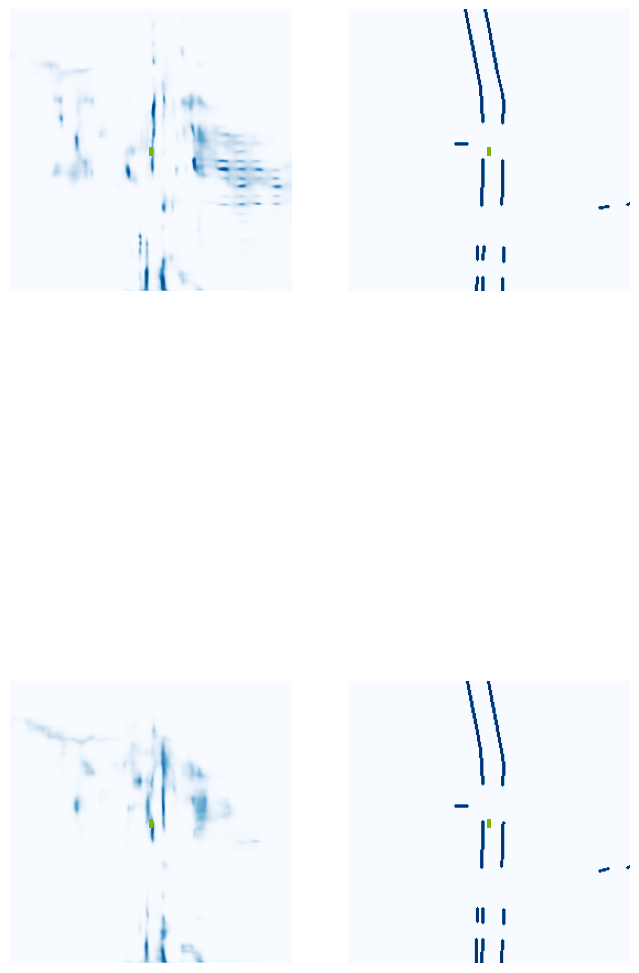

 65%|██████▌   | 26/40 [00:10<00:05,  2.48it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.18it/s]

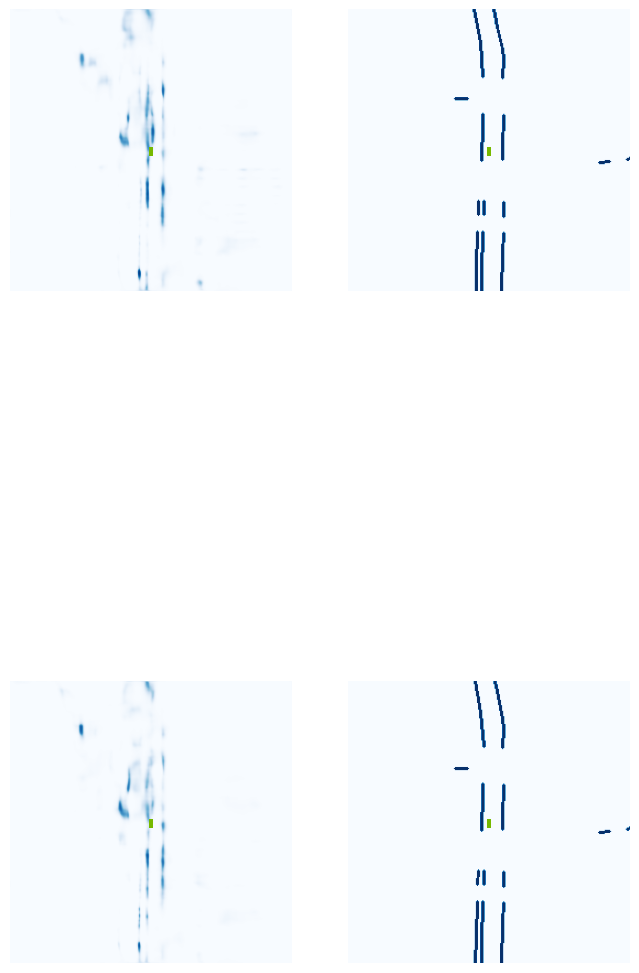

 78%|███████▊  | 31/40 [00:11<00:03,  2.60it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.01.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.20it/s]

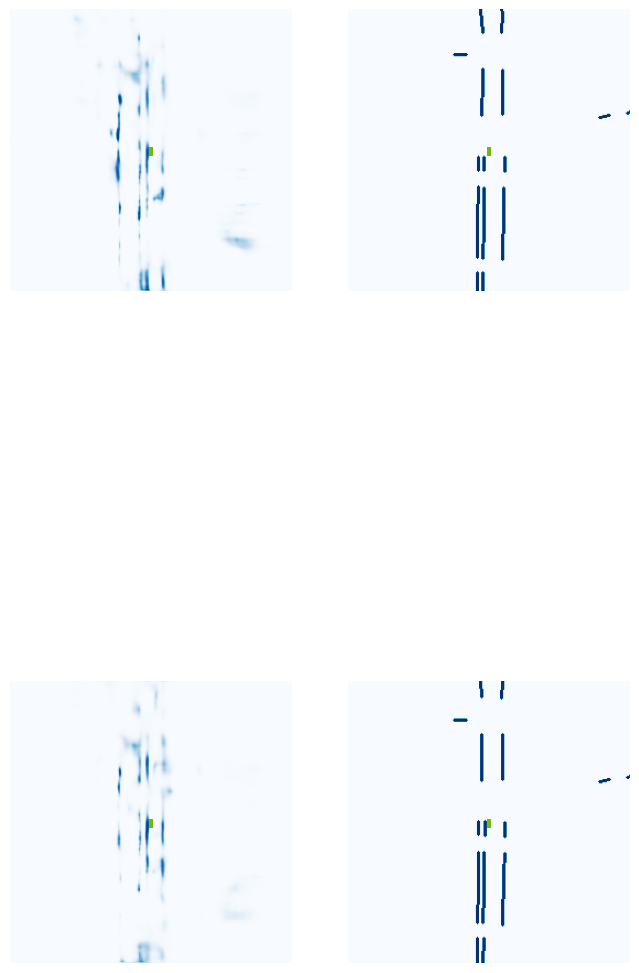

 90%|█████████ | 36/40 [00:13<00:01,  2.54it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.05.jpg


100%|██████████| 40/40 [00:14<00:00,  2.71it/s]


VAL {'loss': 0.17997149387259542, 'iou': 0.03425350936700934}
saving ...  ./runs/model3000.pt
3010 0.07329663634300232
3020 0.02071930095553398
3030 0.04926782846450806
3040 0.03568900376558304
3050 0.05755230411887169
Epoch: 20/60
3060 0.13453048467636108
3070 0.08700944483280182
3080 0.06852558255195618
3090 0.03916516155004501
3100 0.05183304473757744
3110 0.028658445924520493
3120 0.0587482675909996
3130 0.06332951784133911
3140 0.03032381273806095
3150 0.030749840661883354
3160 0.043572939932346344
3170 0.06402567028999329
3180 0.06150464713573456
3190 0.1393895447254181
3200 0.04042356461286545
3210 0.04743494465947151
3220 0.04555632919073105
Epoch: 21/60
3230 0.04716029763221741
3240 0.03482023626565933
3250 0.08856610208749771
3260 0.05856803059577942
3270 0.028922485187649727
3280 0.07738817483186722
3290 0.05641850084066391
3300 0.05017811805009842
3310 0.04073050618171692
3320 0.08245240896940231
3330 0.06074094399809837
3340 0.16398397088050842
3350 0.05625288188457489
336

  0%|          | 0/40 [00:00<?, ?it/s]

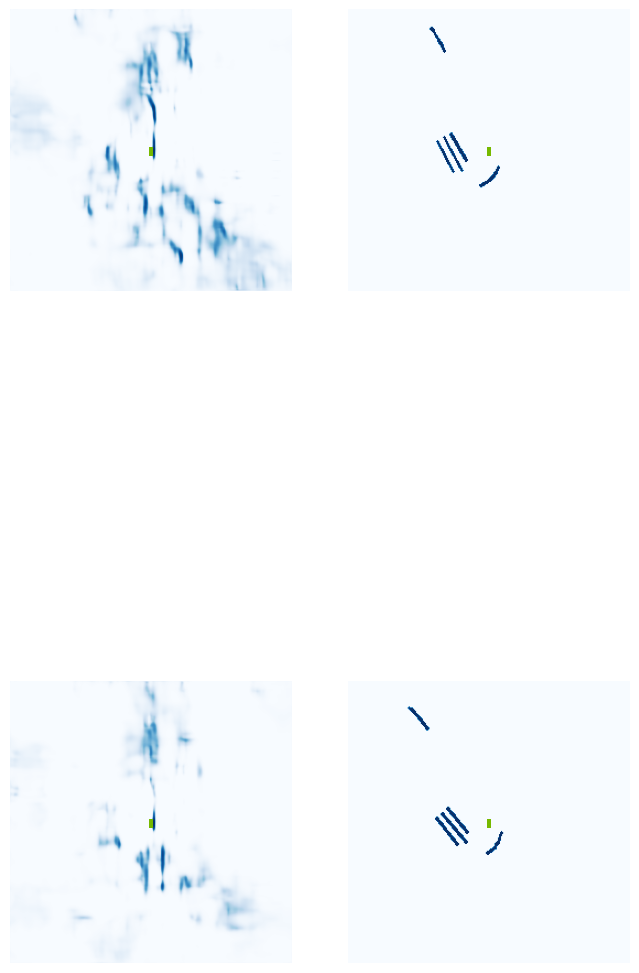

  2%|▎         | 1/40 [00:01<00:48,  1.25s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.03.jpg


 12%|█▎        | 5/40 [00:02<00:13,  2.67it/s]

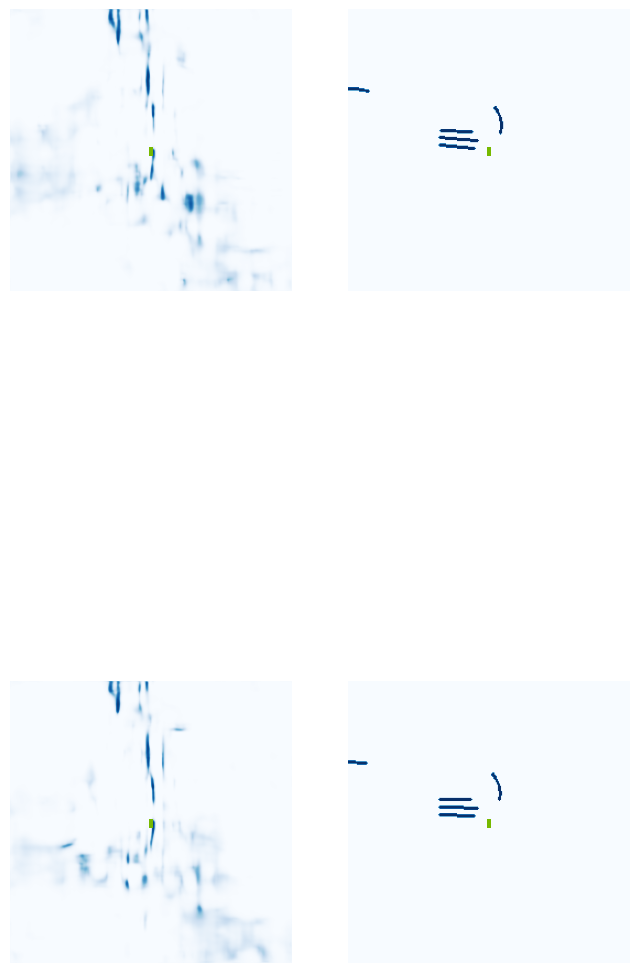

 15%|█▌        | 6/40 [00:03<00:15,  2.24it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.09it/s]

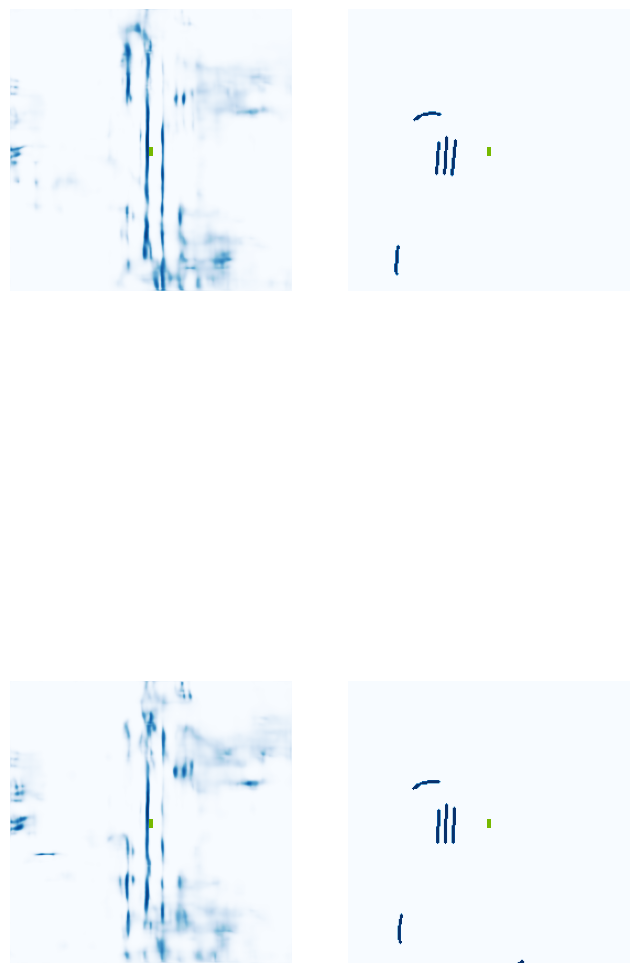

 28%|██▊       | 11/40 [00:04<00:11,  2.47it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.14it/s]

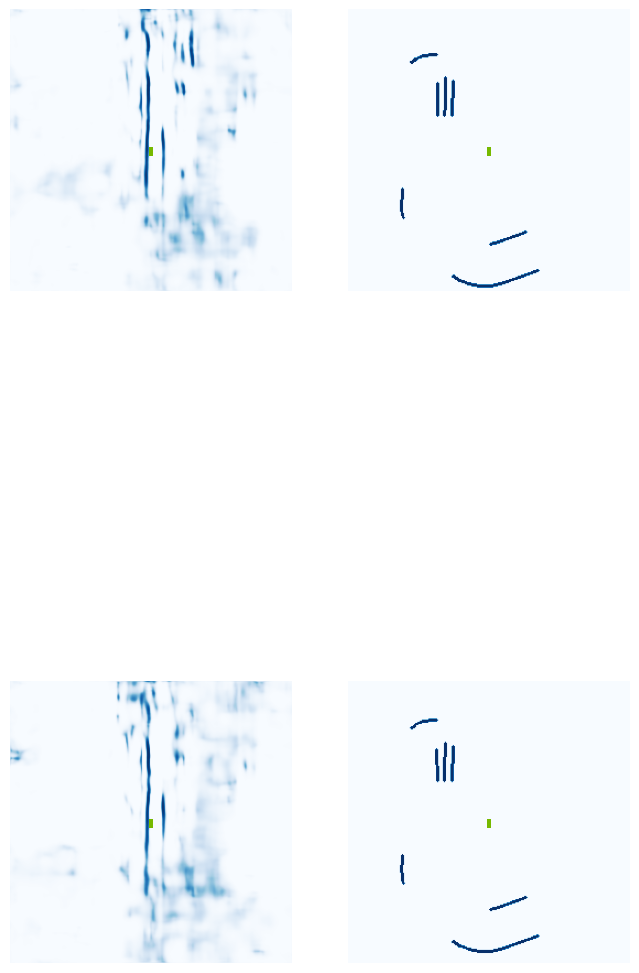

 40%|████      | 16/40 [00:06<00:09,  2.49it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.14it/s]

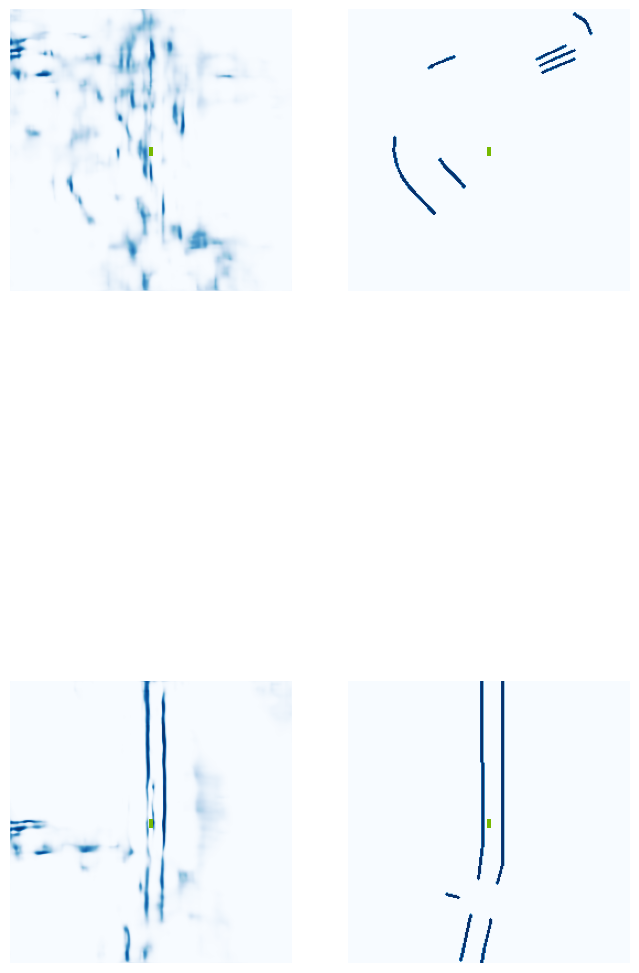

 52%|█████▎    | 21/40 [00:08<00:07,  2.53it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.11.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.15it/s]

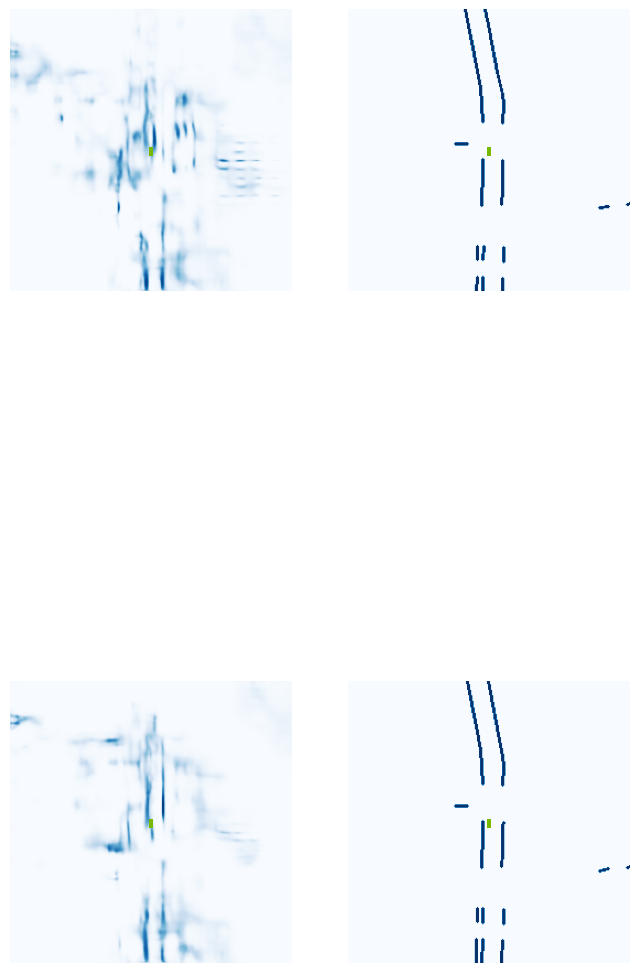

 65%|██████▌   | 26/40 [00:09<00:05,  2.52it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.21it/s]

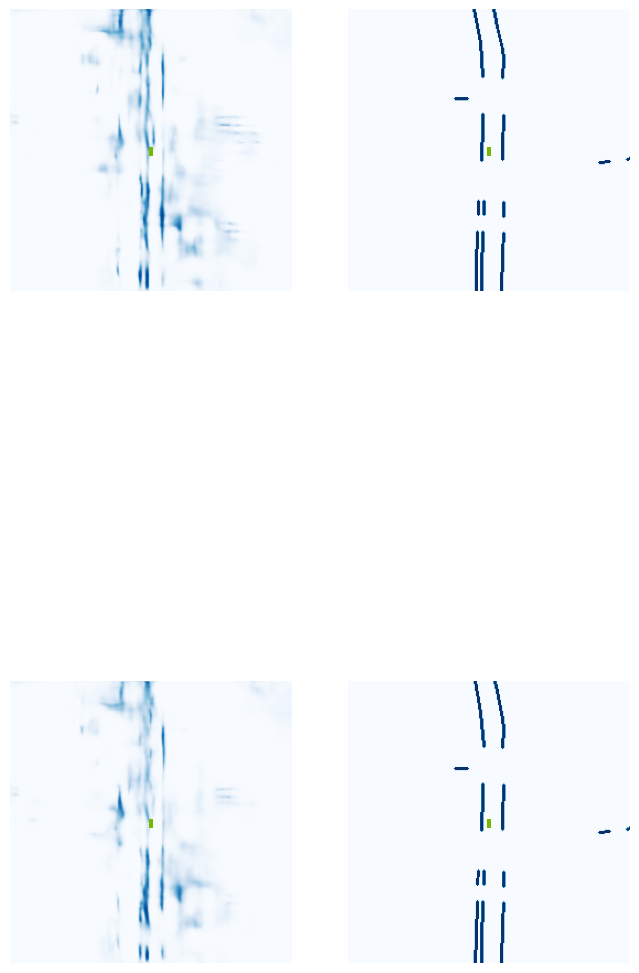

 78%|███████▊  | 31/40 [00:11<00:03,  2.54it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.07.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.18it/s]

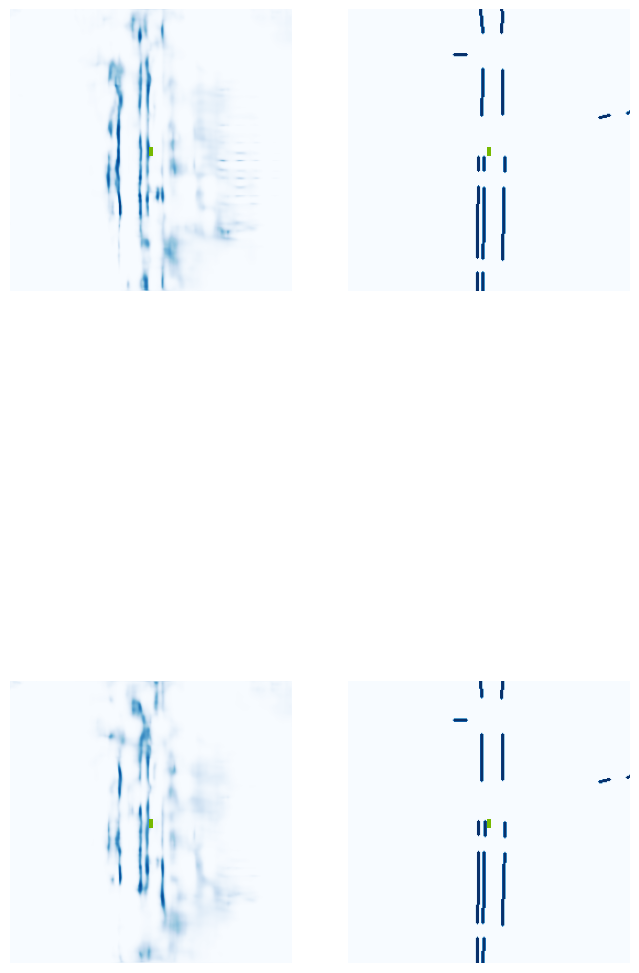

 90%|█████████ | 36/40 [00:13<00:01,  2.53it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.10.jpg


100%|██████████| 40/40 [00:14<00:00,  2.73it/s]


VAL {'loss': 0.17003269935095752, 'iou': 0.047875523638539794}
saving ...  ./runs/model3500.pt
3510 0.05888690426945686
3520 0.05014018714427948
3530 0.07170647382736206
3540 0.03343726694583893
Epoch: 23/60
3550 0.06807421147823334
3560 0.11109748482704163
3570 0.04597325623035431
3580 0.022275574505329132
3590 0.12900008261203766
3600 0.032058823853731155
3610 0.0797049030661583
3620 0.11443570256233215
3630 0.03615357726812363
3640 0.07442177832126617
3650 0.04609968885779381
3660 0.04075845703482628
3670 0.029976513236761093
3680 0.01634921506047249
3690 0.009576958604156971
3700 0.045521192252635956
Epoch: 24/60
3710 0.05816514045000076
3720 0.03677310422062874
3730 0.053779516369104385
3740 0.030392877757549286
3750 0.10577590763568878
3760 0.0584753155708313
3770 0.010364551097154617
3780 0.0448308140039444
3790 0.043731652200222015
3800 0.022179199382662773
3810 0.025769595056772232
3820 0.0520697683095932
3830 0.0673878863453865
3840 0.057241037487983704
3850 0.058025293052196

  0%|          | 0/40 [00:00<?, ?it/s]

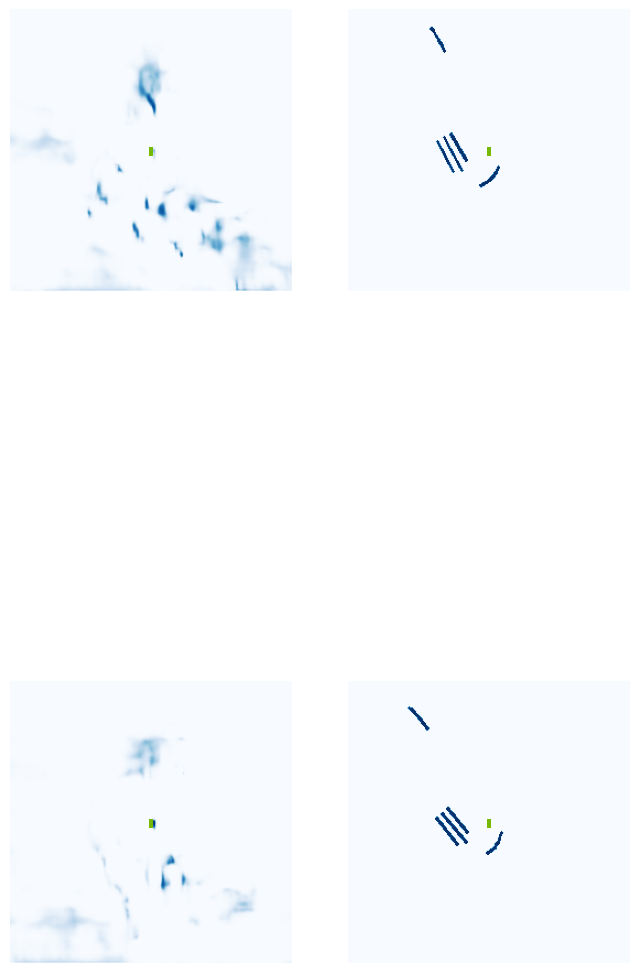

  2%|▎         | 1/40 [00:01<00:47,  1.21s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.72it/s]

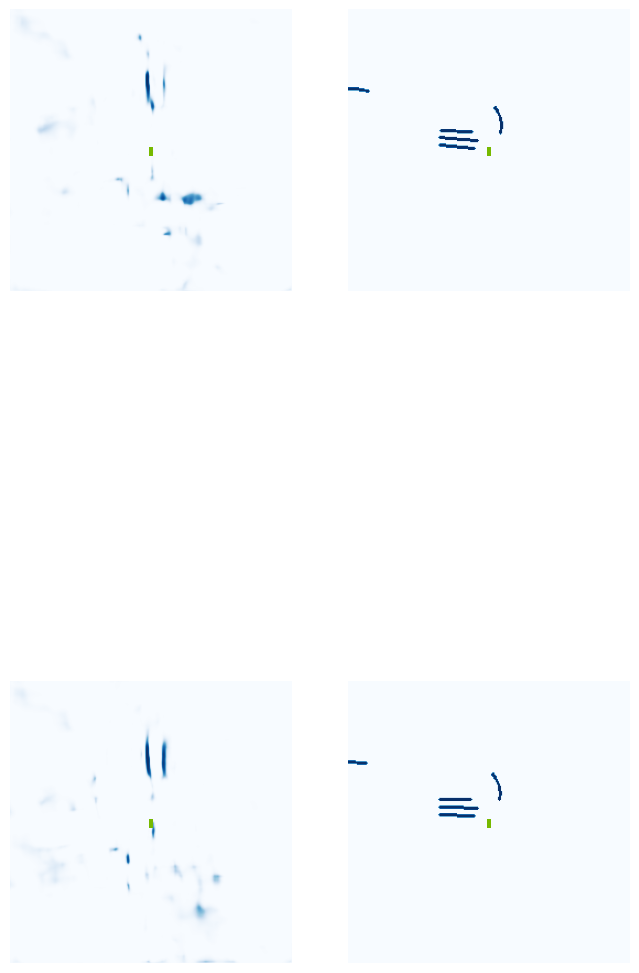

 15%|█▌        | 6/40 [00:02<00:14,  2.32it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.14it/s]

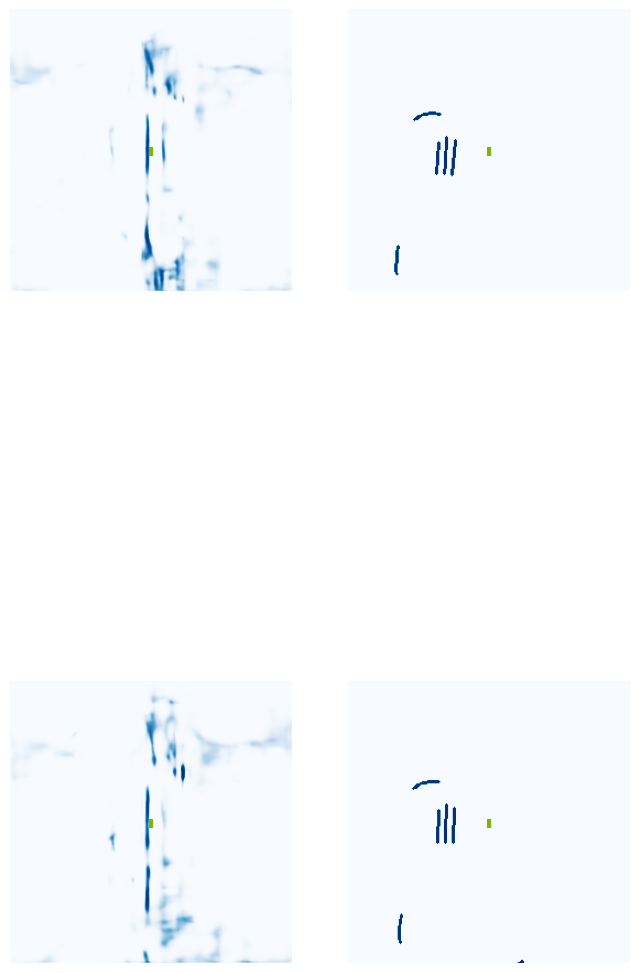

 28%|██▊       | 11/40 [00:04<00:11,  2.53it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.19it/s]

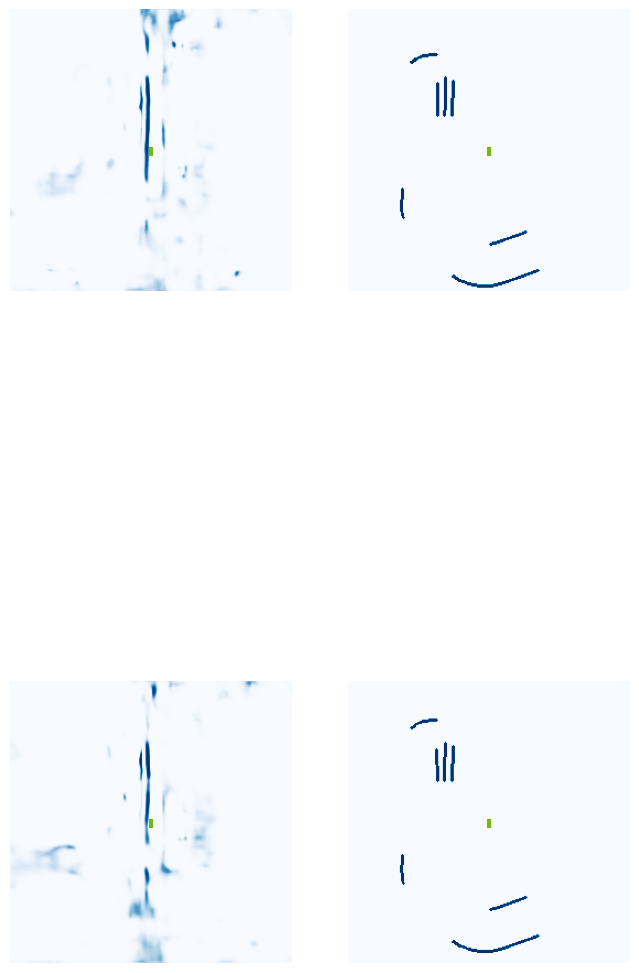

 40%|████      | 16/40 [00:06<00:09,  2.46it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.15it/s]

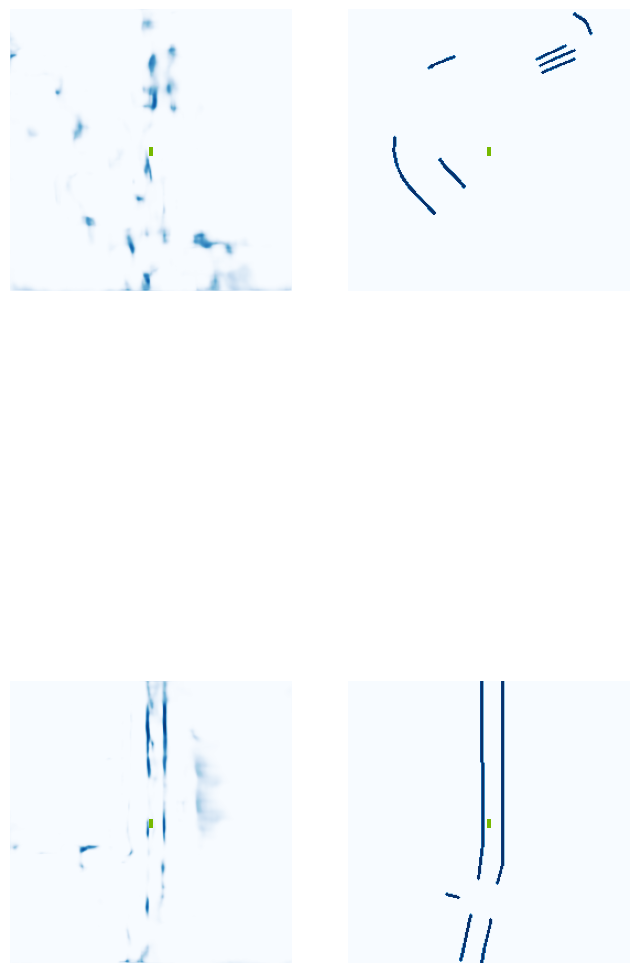

 52%|█████▎    | 21/40 [00:08<00:07,  2.53it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.08.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.16it/s]

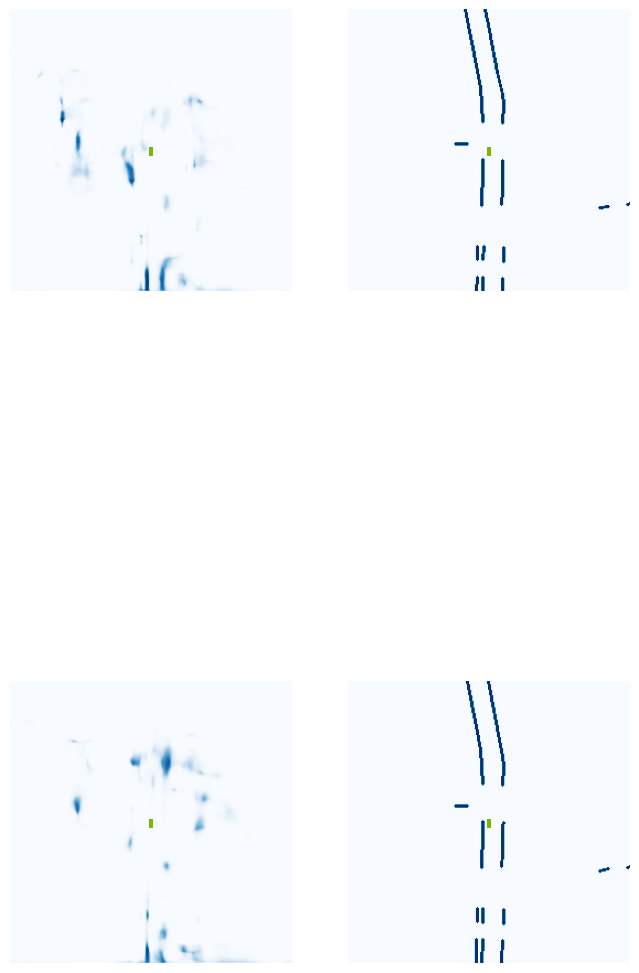

 65%|██████▌   | 26/40 [00:09<00:05,  2.55it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.02.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.18it/s]

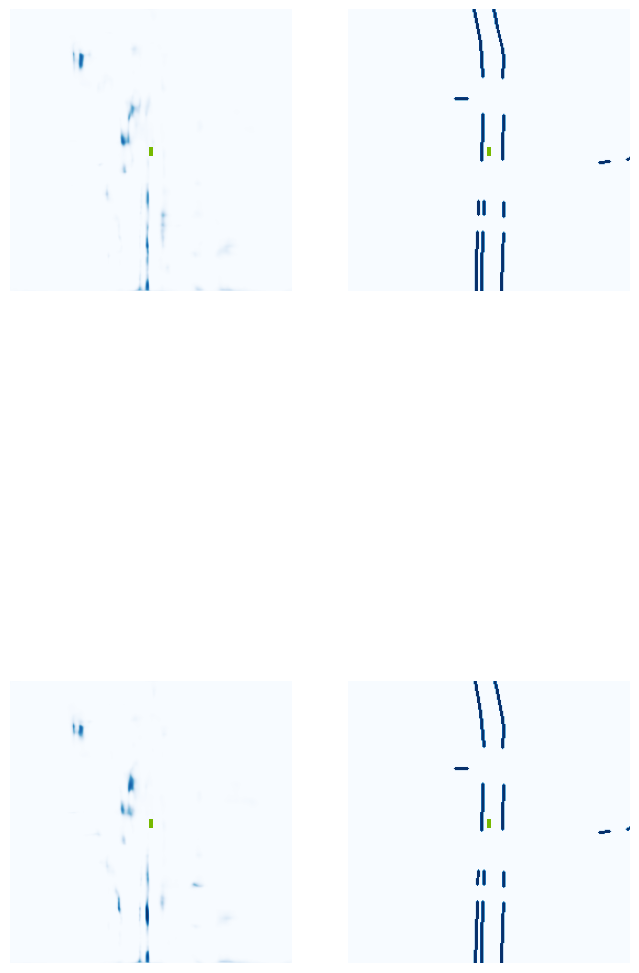

 78%|███████▊  | 31/40 [00:11<00:03,  2.58it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.01.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.23it/s]

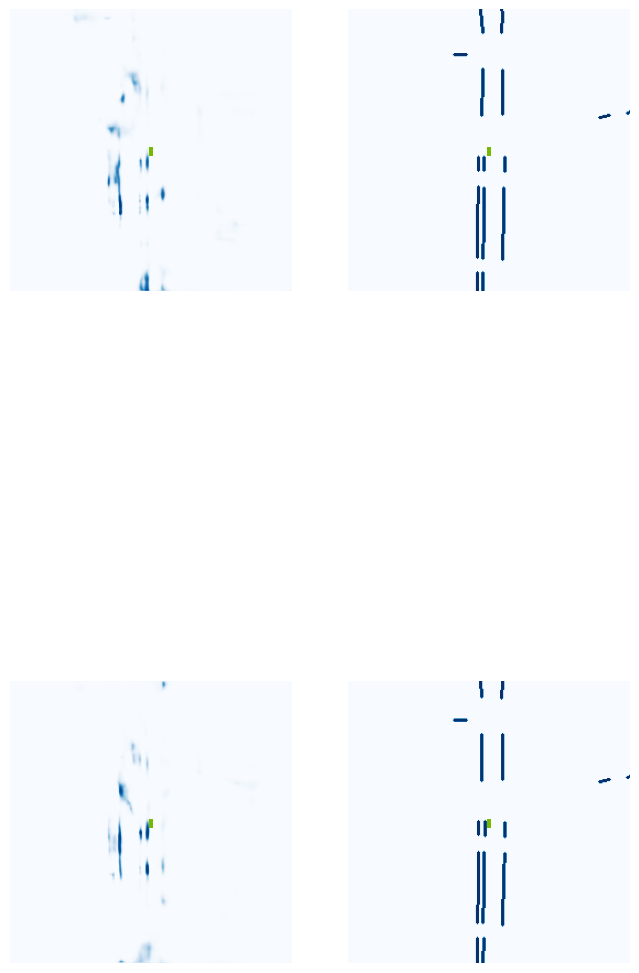

 90%|█████████ | 36/40 [00:13<00:01,  2.61it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.05.jpg


100%|██████████| 40/40 [00:14<00:00,  2.76it/s]


VAL {'loss': 0.21929241164966864, 'iou': 0.01777229019343735}
saving ...  ./runs/model4000.pt
4010 0.013654530048370361
4020 0.0065804170444607735
Epoch: 26/60
4030 0.058176517486572266
4040 0.09356947988271713
4050 0.0678023099899292
4060 0.03389862924814224
4070 0.05856766551733017
4080 0.04238814488053322
4090 0.03115822747349739
4100 0.06780529022216797
4110 0.02478804625570774
4120 0.02846684679389
4130 0.09478479623794556
4140 0.041738029569387436
4150 0.027335671707987785
4160 0.03537147492170334
4170 0.033821117132902145
4180 0.033237308263778687
Epoch: 27/60
4190 0.023176776245236397
4200 0.08858552575111389
4210 0.05172121152281761
4220 0.031284891068935394
4230 0.07020322233438492
4240 0.033264003694057465
4250 0.07816831022500992
4260 0.02878318354487419
4270 0.04002966731786728
4280 0.03159873187541962
4290 0.030119609087705612
4300 0.11903026700019836
4310 0.08365669846534729
4320 0.01459309458732605
4330 0.08548462390899658
4340 0.07041830569505692
Epoch: 28/60
4350 0.05

  0%|          | 0/40 [00:00<?, ?it/s]

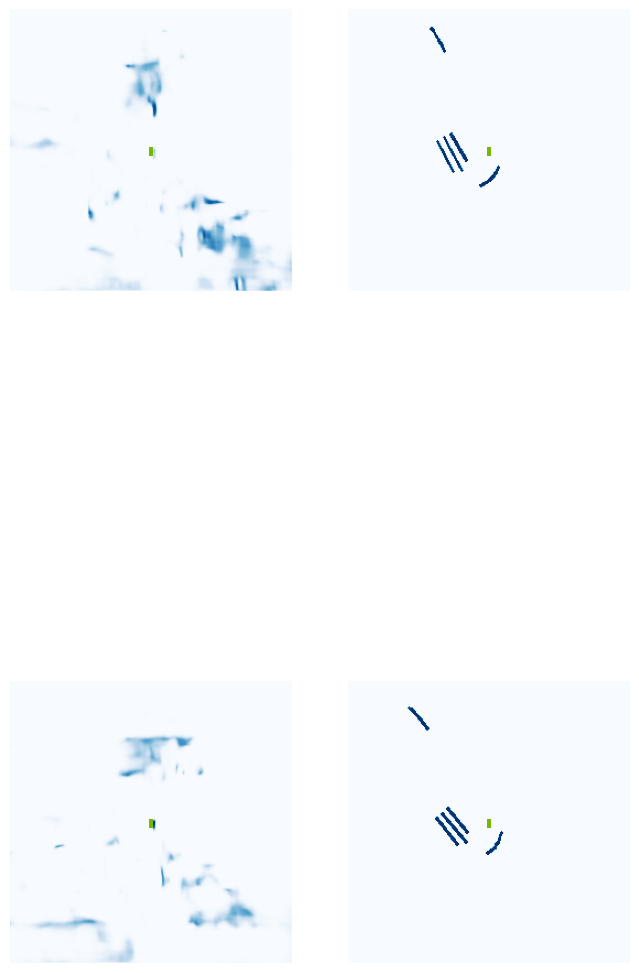

  2%|▎         | 1/40 [00:01<00:46,  1.19s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.70it/s]

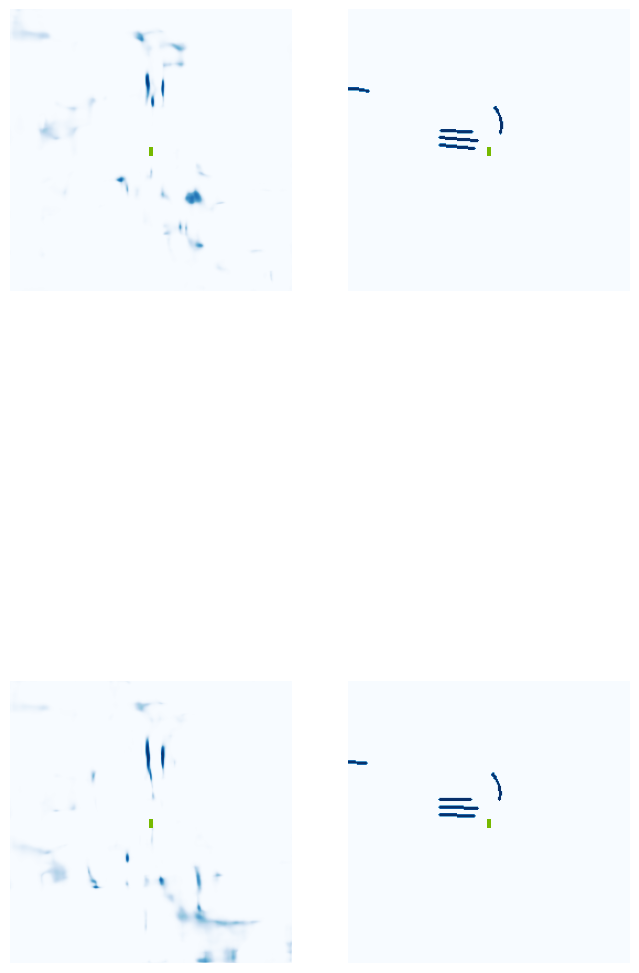

 15%|█▌        | 6/40 [00:03<00:18,  1.84it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:10,  2.92it/s]

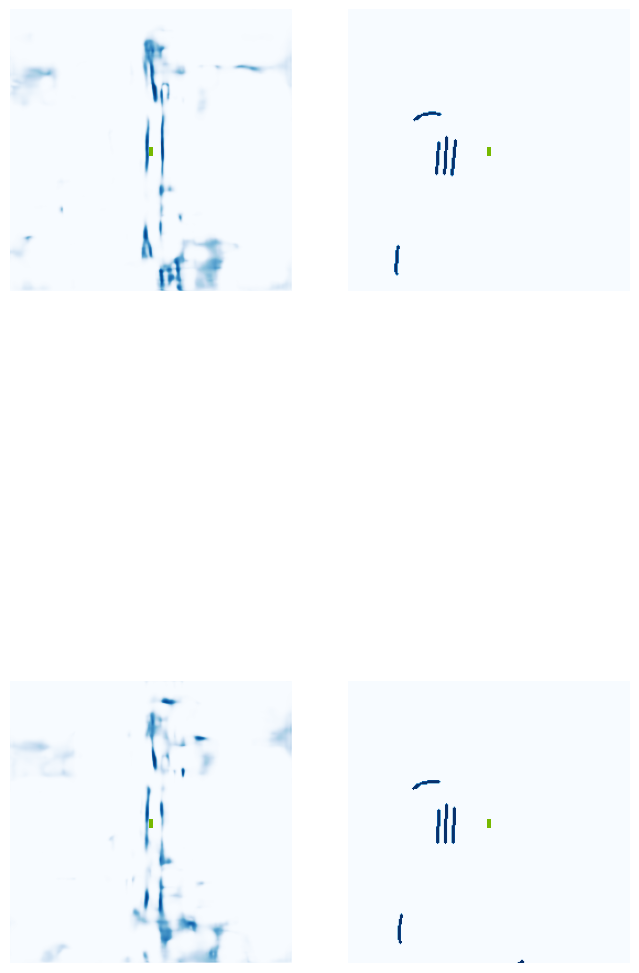

 28%|██▊       | 11/40 [00:04<00:11,  2.44it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:06<00:07,  3.18it/s]

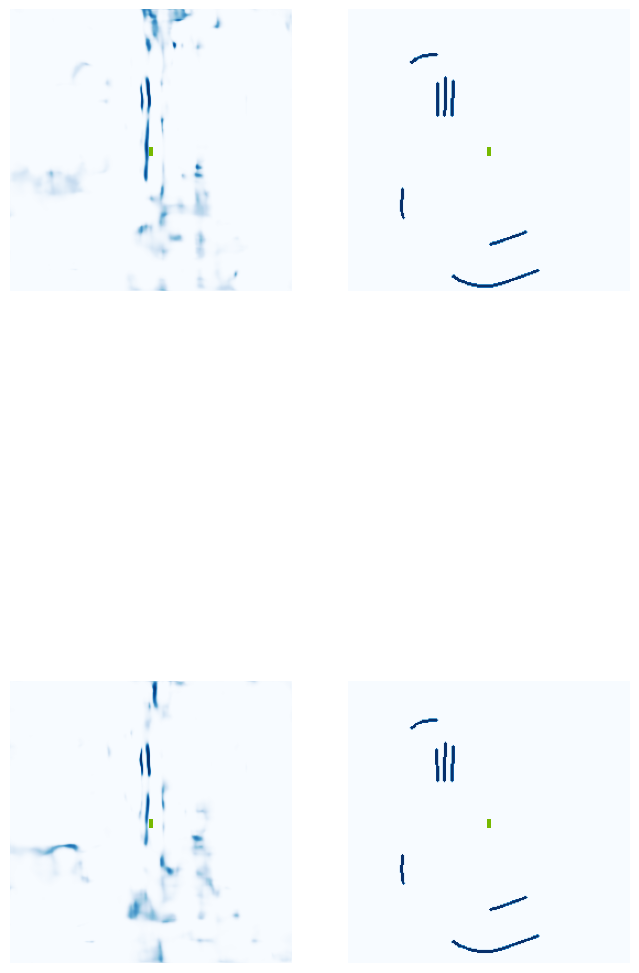

 40%|████      | 16/40 [00:06<00:09,  2.55it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.20it/s]

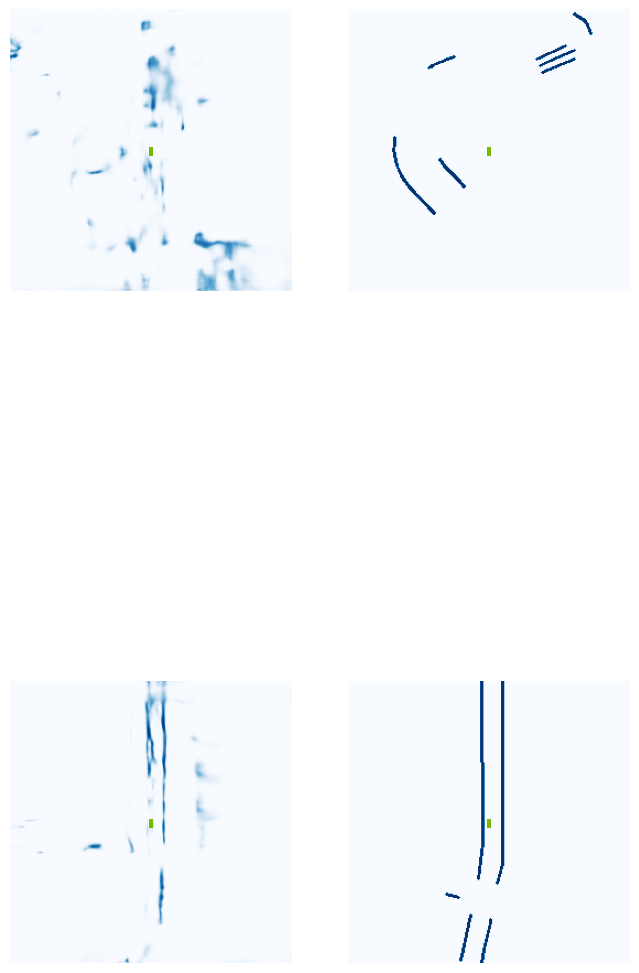

 52%|█████▎    | 21/40 [00:08<00:07,  2.53it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.09.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.12it/s]

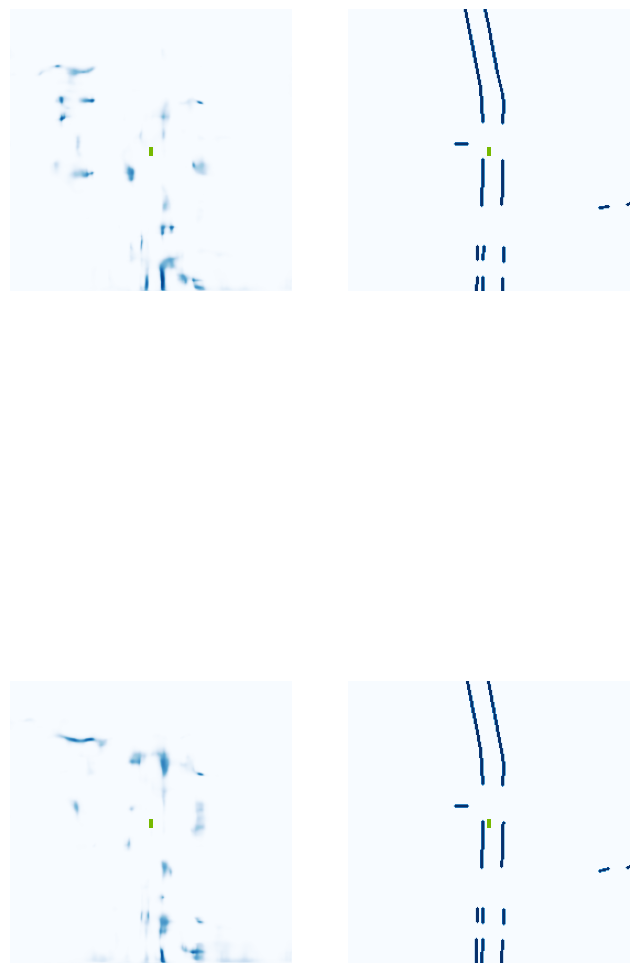

 65%|██████▌   | 26/40 [00:10<00:05,  2.48it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.15it/s]

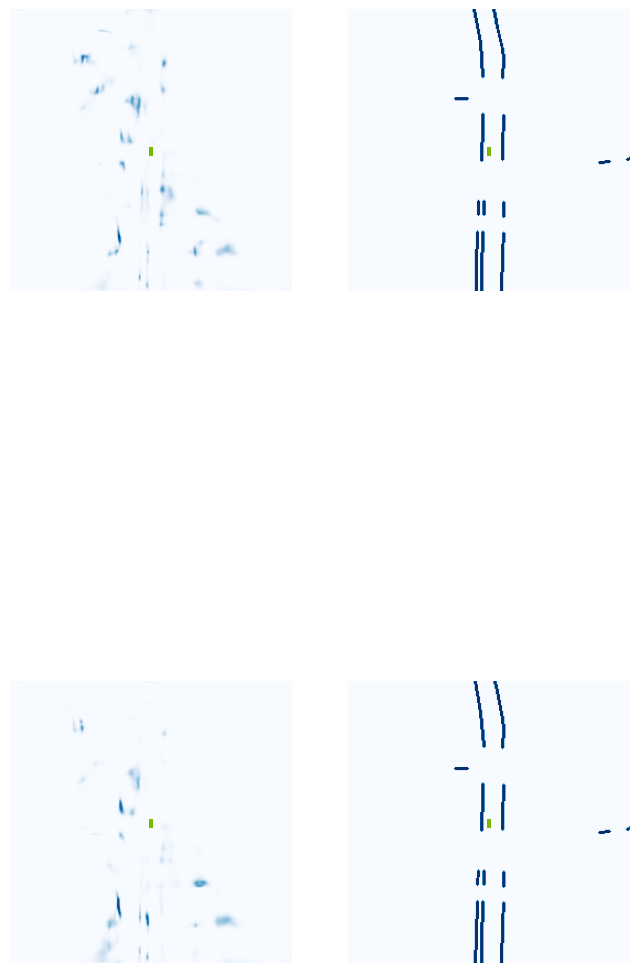

 78%|███████▊  | 31/40 [00:11<00:03,  2.55it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.00.jpg


 88%|████████▊ | 35/40 [00:13<00:01,  3.22it/s]

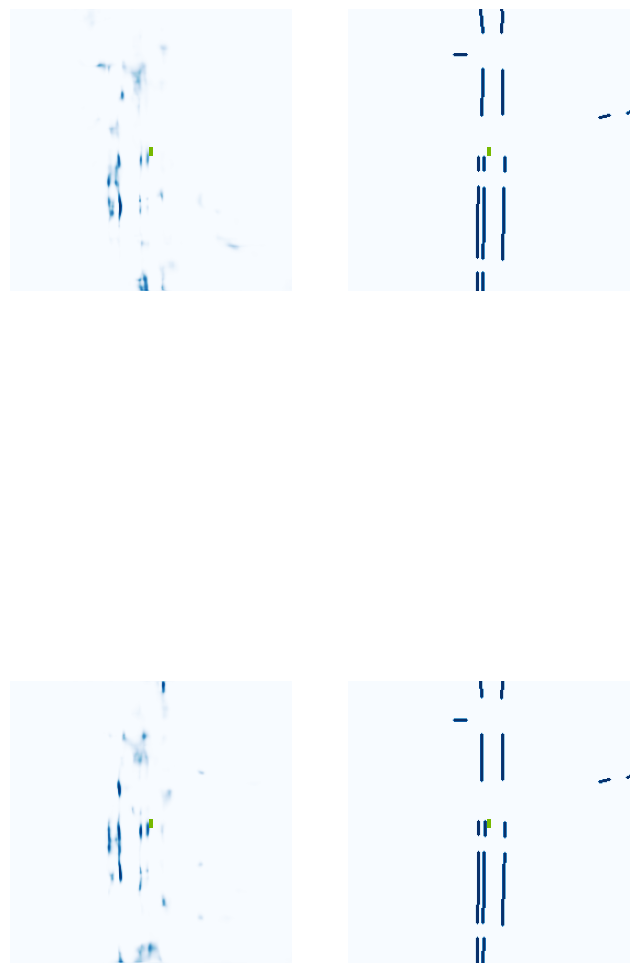

 90%|█████████ | 36/40 [00:13<00:01,  2.54it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.04.jpg


100%|██████████| 40/40 [00:14<00:00,  2.70it/s]


VAL {'loss': 0.22727363013926846, 'iou': 0.0172132504196912}
saving ...  ./runs/model4500.pt
Epoch: 29/60
4510 0.02453649789094925
4520 0.044545456767082214
4530 0.04885835945606232
4540 0.03712580353021622
4550 0.02402884140610695
4560 0.07674004882574081
4570 0.060263071209192276
4580 0.03217839077115059
4590 0.0369177982211113
4600 0.028347963467240334
4610 0.031595442444086075
4620 0.013039356097579002
4630 0.020113276317715645
4640 0.04885752499103546
4650 0.0349835604429245
4660 0.0726323127746582
Epoch: 30/60
4670 0.0683133453130722
4680 0.07636631280183792
4690 0.032985009253025055
4700 0.08003032207489014
4710 0.026772622019052505
4720 0.024494020268321037
4730 0.03610531985759735
4740 0.061115607619285583
4750 0.02792024239897728
4760 0.040075503289699554
4770 0.0890636295080185
4780 0.023700125515460968
4790 0.01847759634256363
4800 0.019163262099027634
4810 0.018351193517446518
4820 0.07388630509376526
4830 0.0625142753124237
Epoch: 31/60
4840 0.0313662625849247
4850 0.0161

  0%|          | 0/40 [00:00<?, ?it/s]

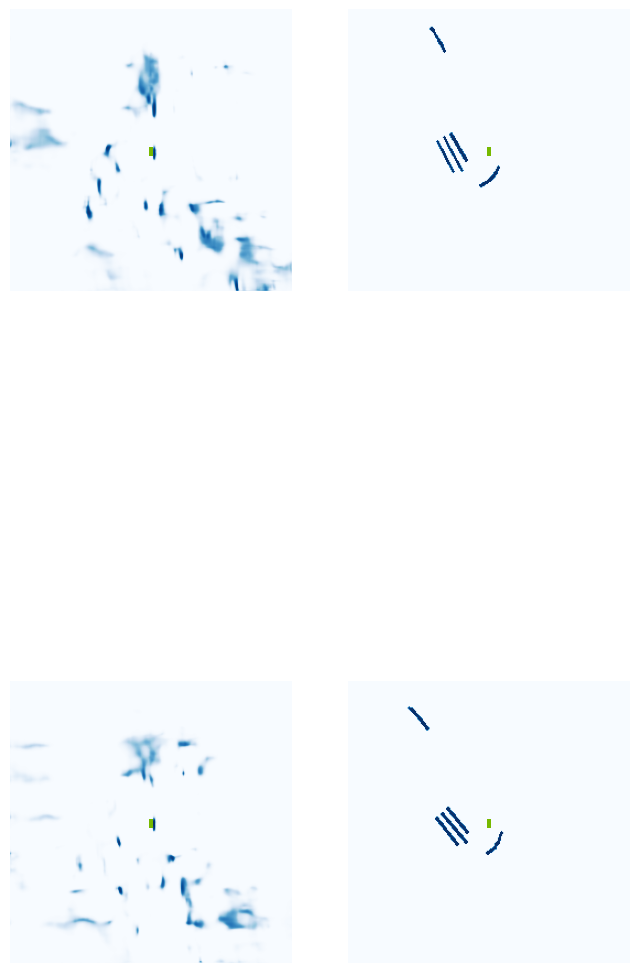

  2%|▎         | 1/40 [00:01<00:45,  1.17s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.01.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.72it/s]

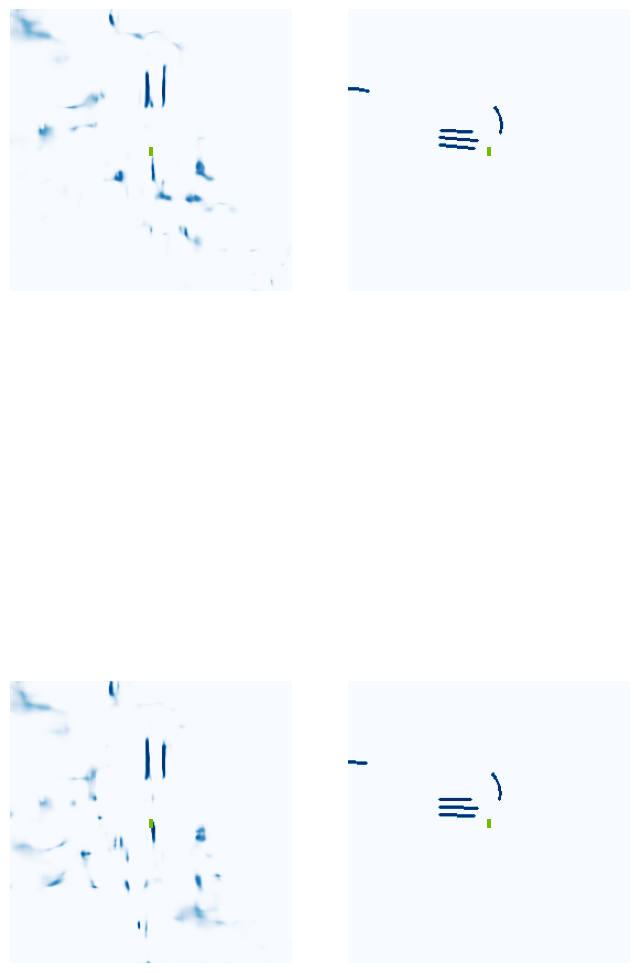

 15%|█▌        | 6/40 [00:02<00:14,  2.27it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.11it/s]

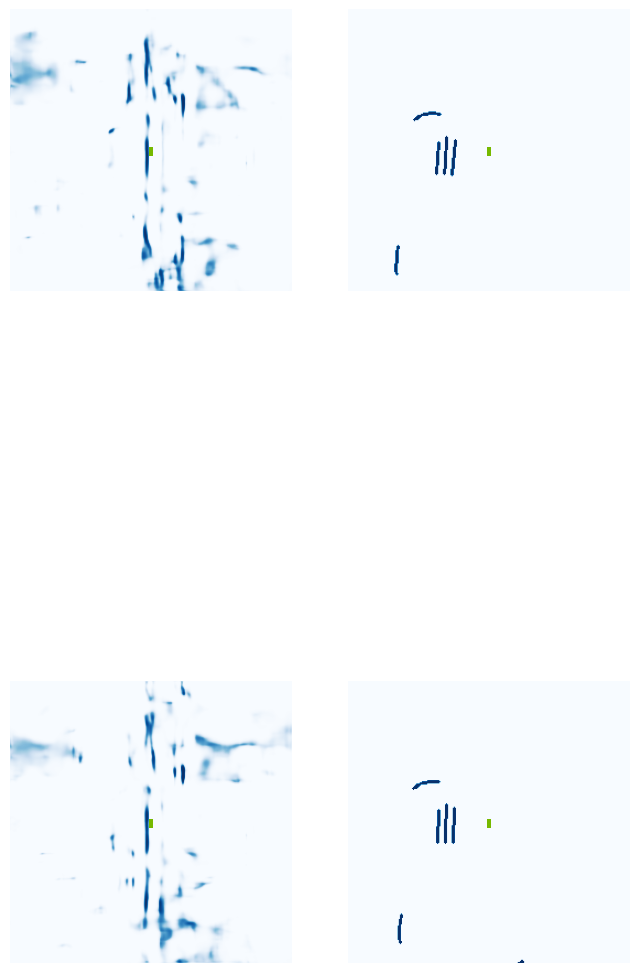

 28%|██▊       | 11/40 [00:04<00:11,  2.53it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.21it/s]

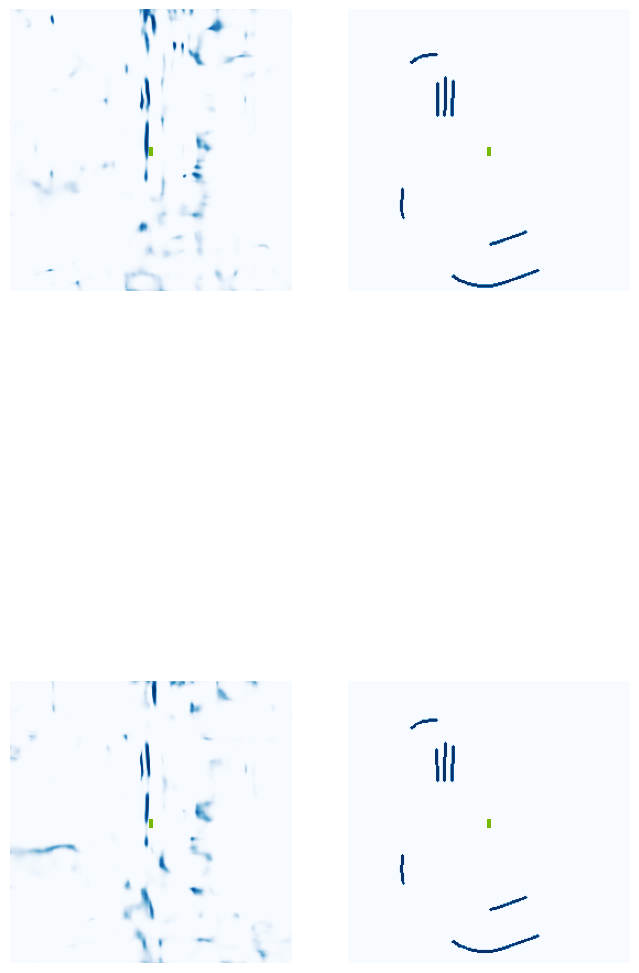

 40%|████      | 16/40 [00:06<00:09,  2.53it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.18it/s]

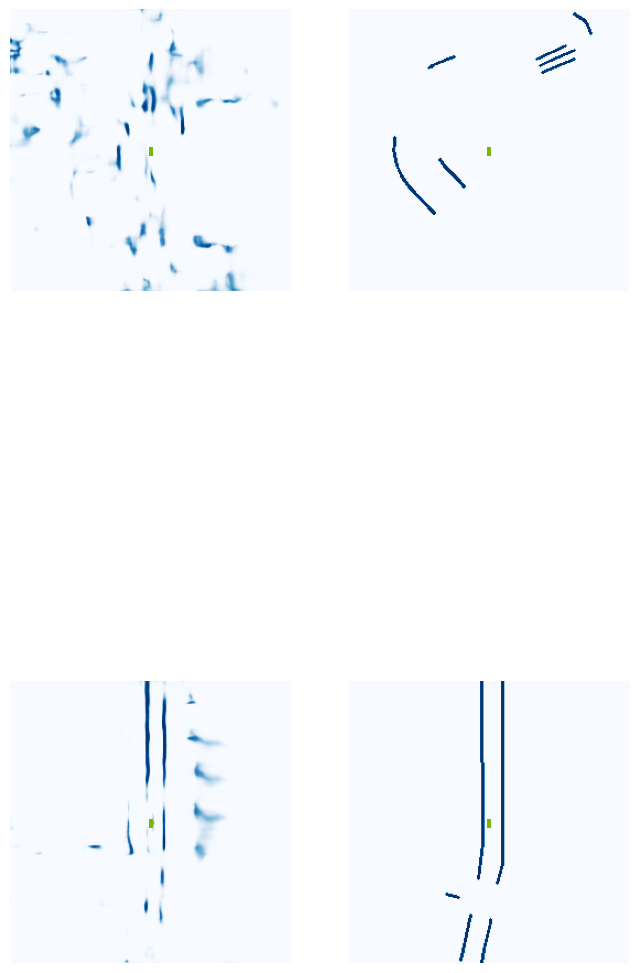

 52%|█████▎    | 21/40 [00:08<00:07,  2.57it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.09.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.20it/s]

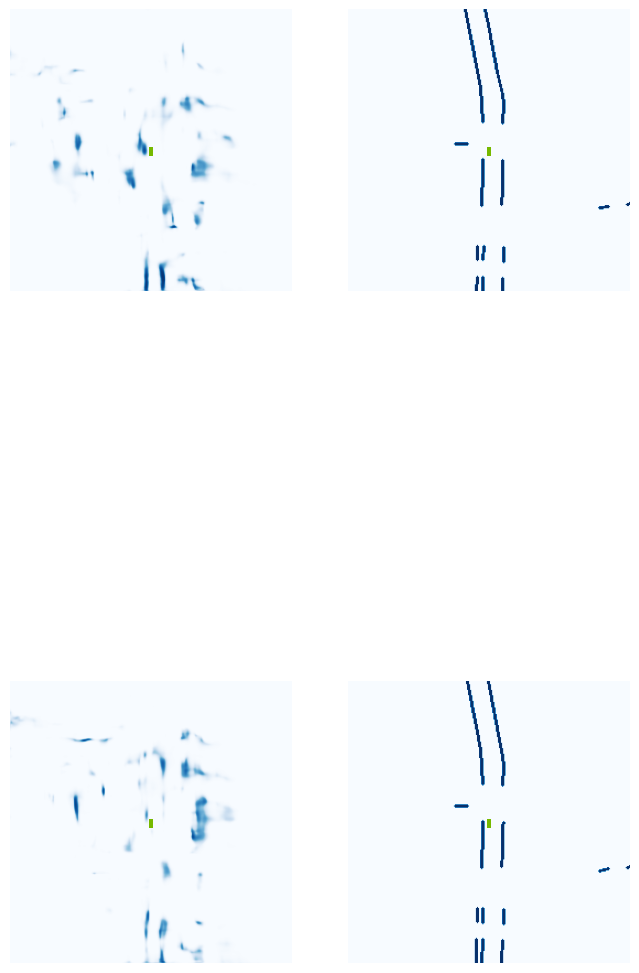

 65%|██████▌   | 26/40 [00:09<00:05,  2.56it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.01.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.19it/s]

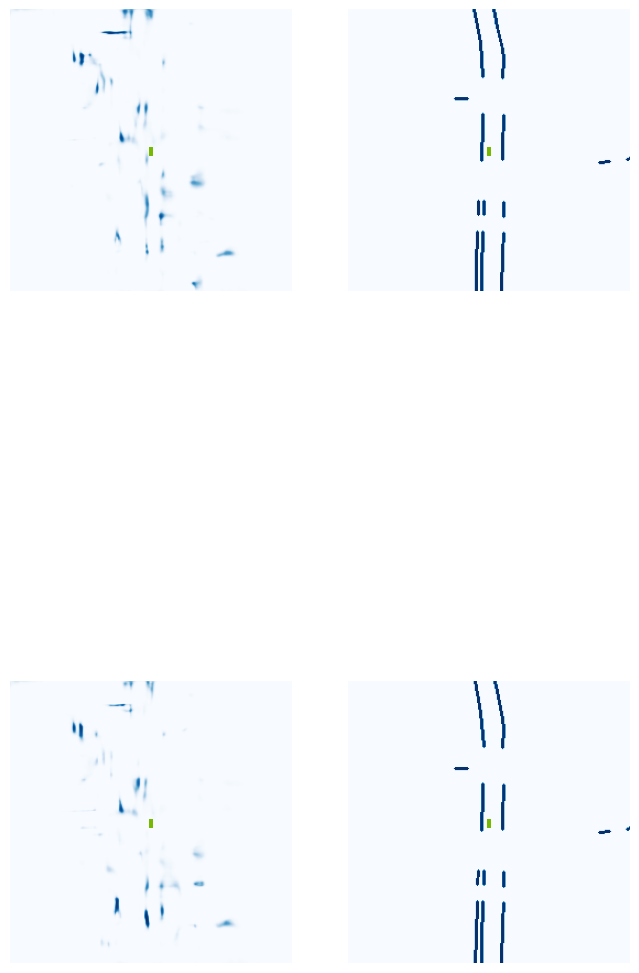

 78%|███████▊  | 31/40 [00:11<00:03,  2.54it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.02.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.18it/s]

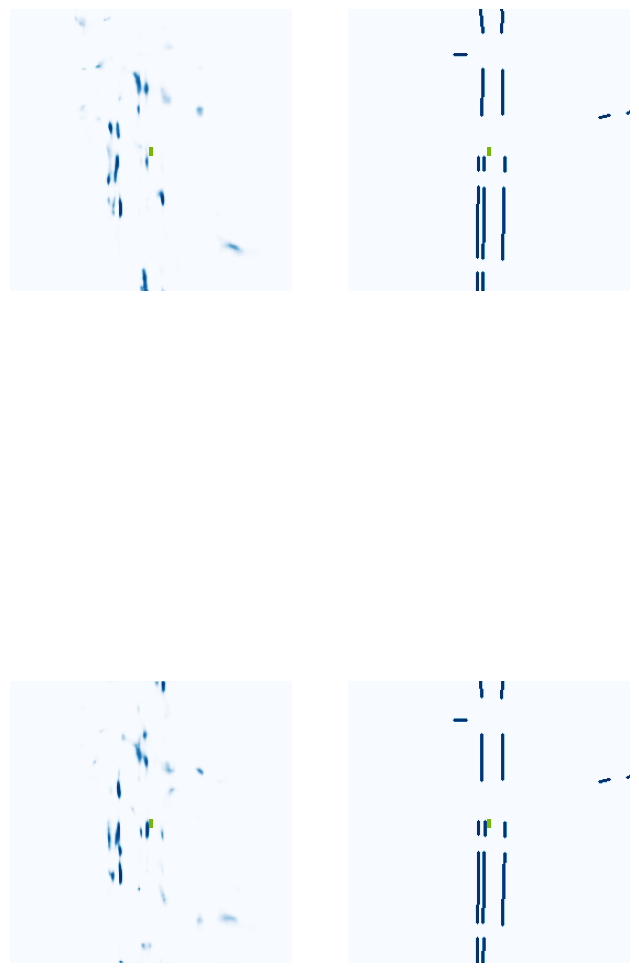

 90%|█████████ | 36/40 [00:13<00:01,  2.57it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.04.jpg


100%|██████████| 40/40 [00:14<00:00,  2.77it/s]


VAL {'loss': 0.24782147414890338, 'iou': 0.024345744321417884}
saving ...  ./runs/model5000.pt
5010 0.036457523703575134
5020 0.02665199153125286
5030 0.03287777677178383
5040 0.045112188905477524
5050 0.07381138205528259
5060 0.055099036544561386
5070 0.009918089024722576
5080 0.008905855007469654
5090 0.0427912212908268
5100 0.025805335491895676
5110 0.05019389092922211
5120 0.025831695646047592
5130 0.013181125745177269
5140 0.01980689913034439
5150 0.029782507568597794
Epoch: 33/60
5160 0.025464894250035286
5170 0.037629157304763794
5180 0.022831691429018974
5190 0.018167931586503983
5200 0.014289544895291328
5210 0.01148910354822874
5220 0.016825390979647636
5230 0.029024561867117882
5240 0.017718138173222542
5250 0.09428656101226807
5260 0.05743885412812233
5270 0.034480080008506775
5280 0.026086337864398956
5290 0.021333837881684303
5300 0.02329186350107193
5310 0.061156220734119415
Epoch: 34/60
5320 0.021289313212037086
5330 0.09359060227870941
5340 0.05589671432971954
5350 0.0

  0%|          | 0/40 [00:00<?, ?it/s]

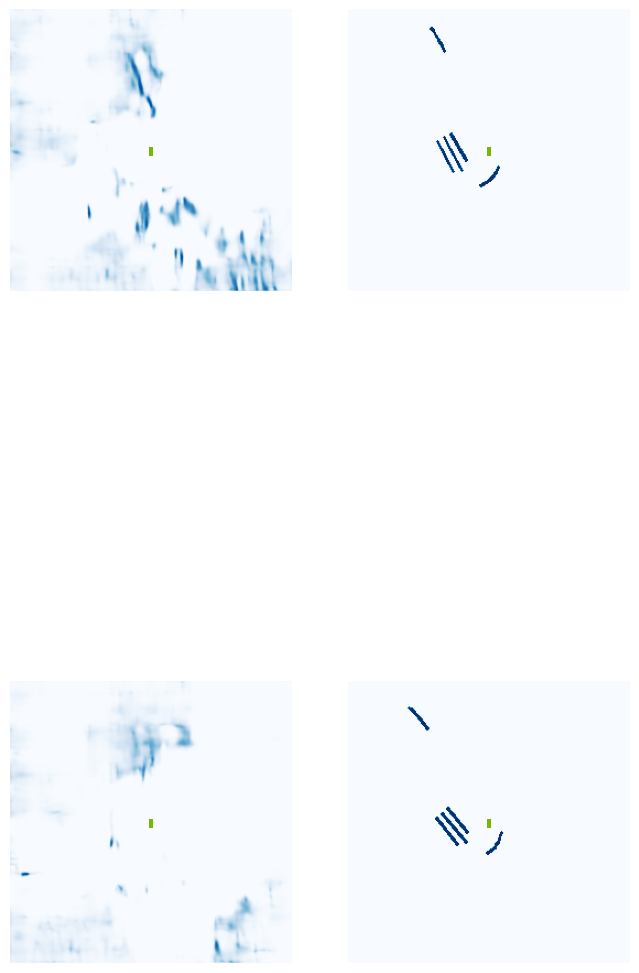

  2%|▎         | 1/40 [00:01<00:46,  1.20s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.73it/s]

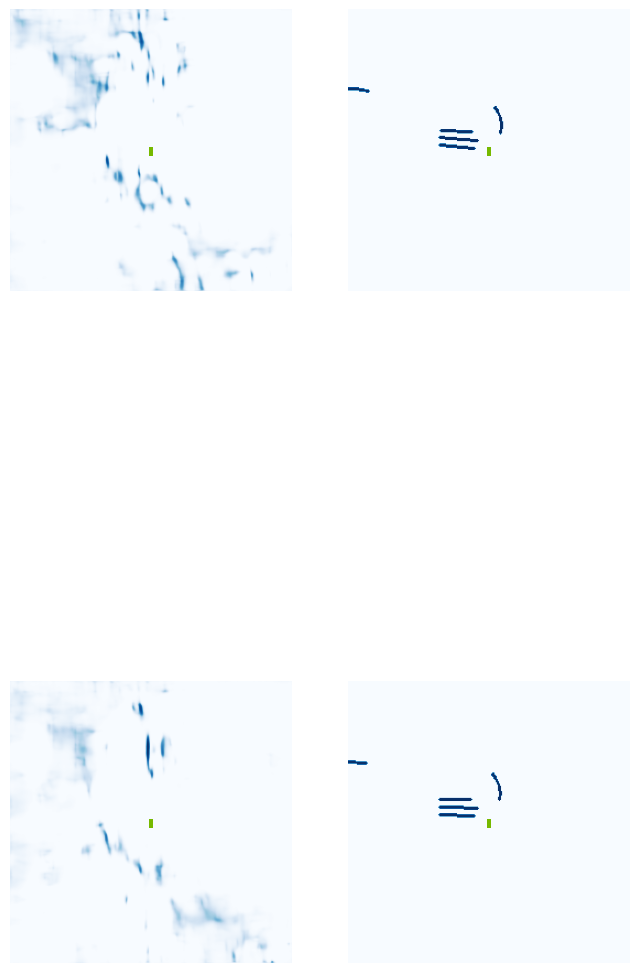

 15%|█▌        | 6/40 [00:02<00:14,  2.27it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.13it/s]

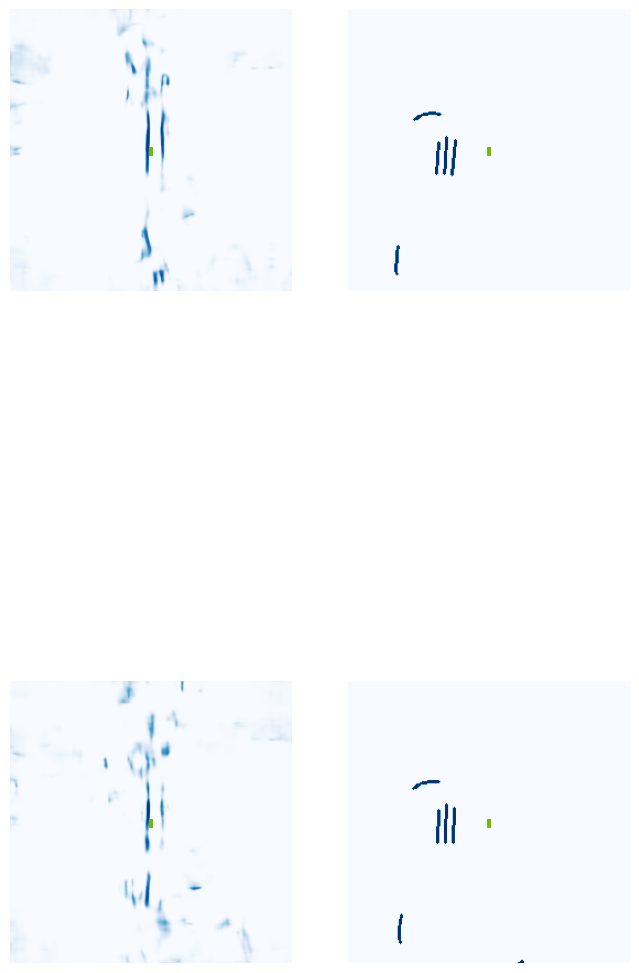

 28%|██▊       | 11/40 [00:04<00:11,  2.54it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.20it/s]

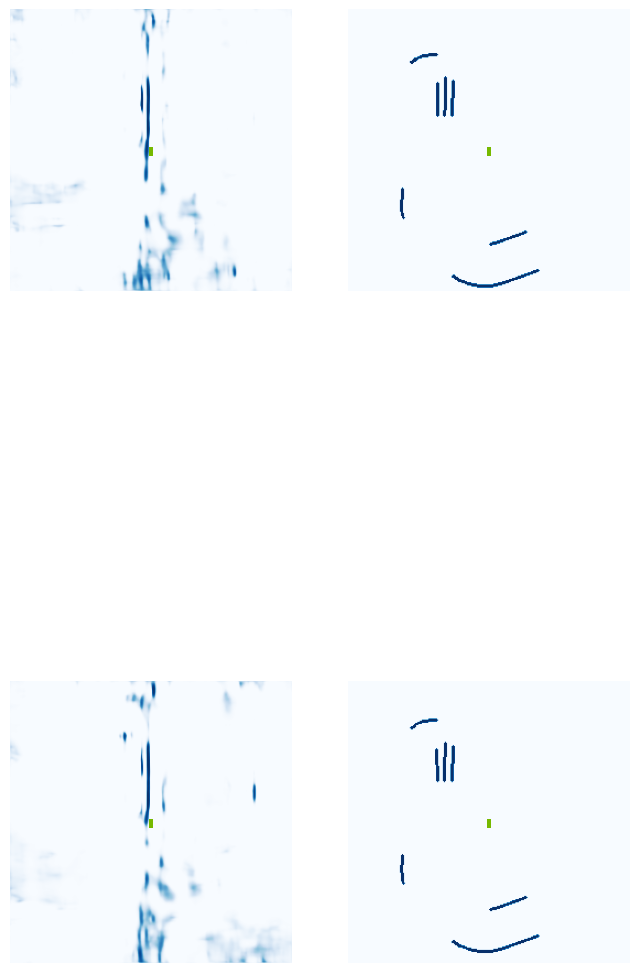

 40%|████      | 16/40 [00:06<00:09,  2.56it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.01.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.20it/s]

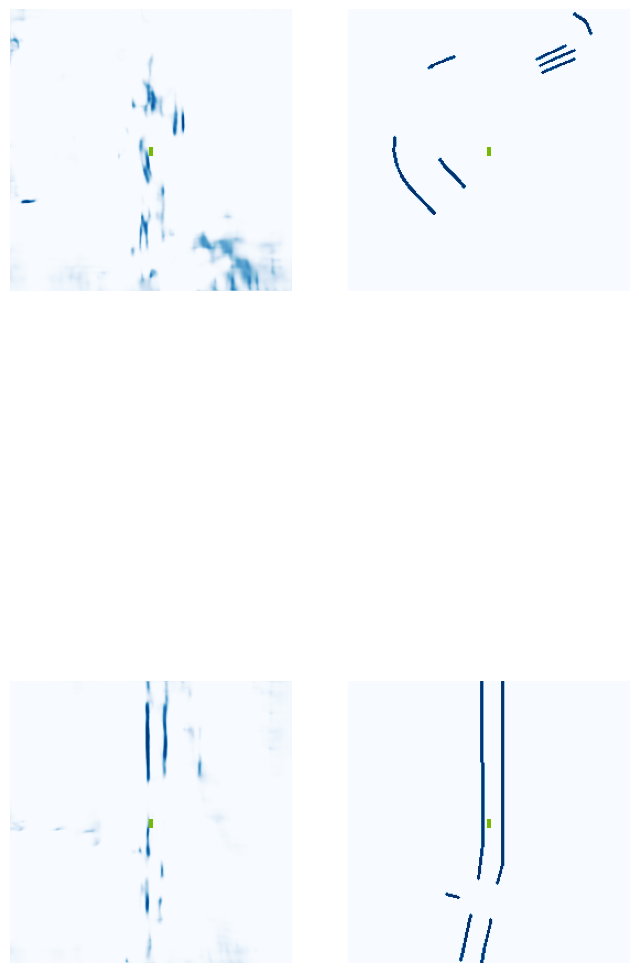

 52%|█████▎    | 21/40 [00:08<00:09,  2.06it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.06.jpg


 62%|██████▎   | 25/40 [00:09<00:05,  2.97it/s]

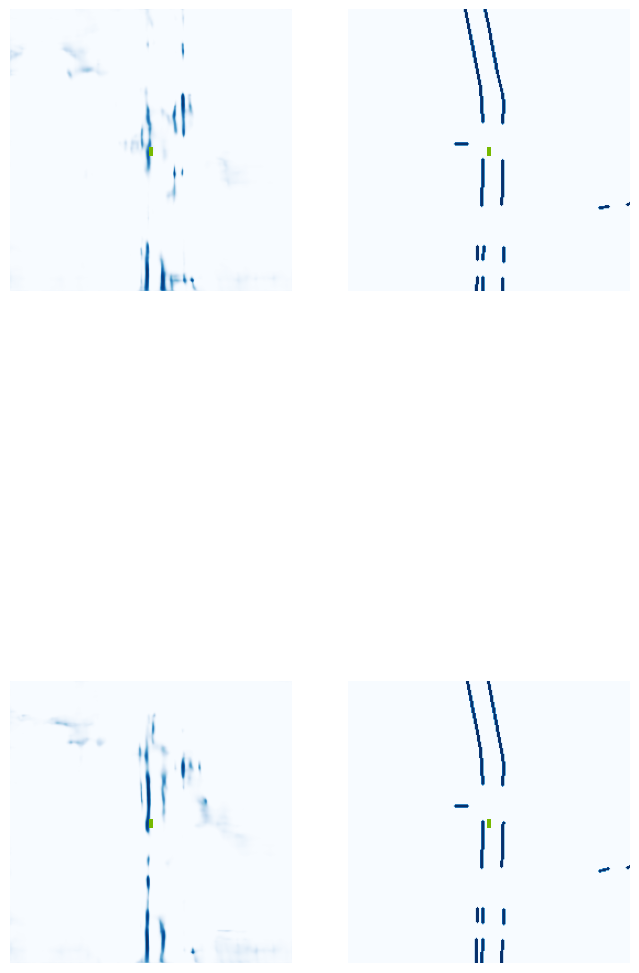

 65%|██████▌   | 26/40 [00:10<00:05,  2.48it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.02.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.17it/s]

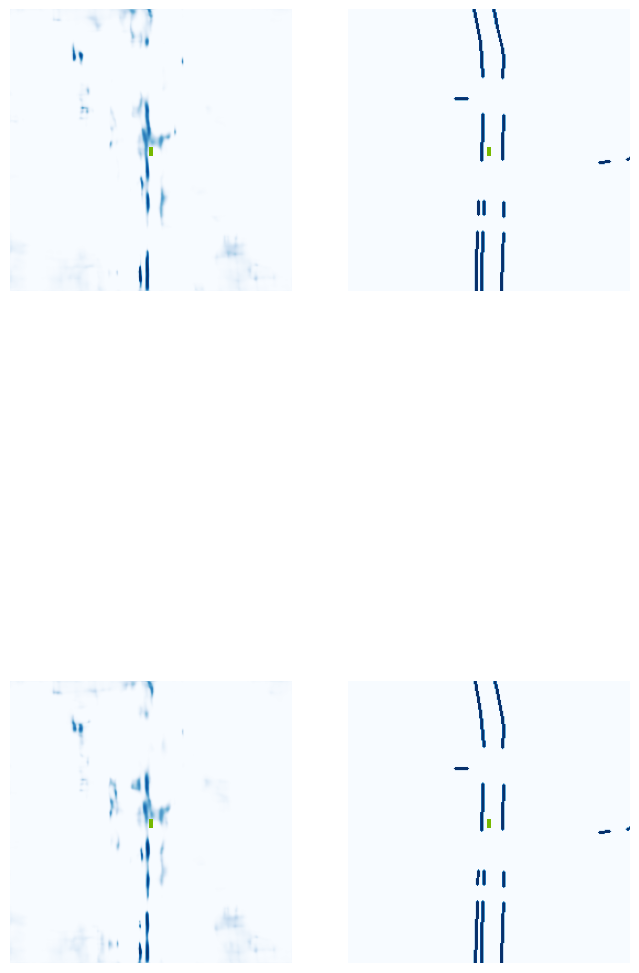

 78%|███████▊  | 31/40 [00:11<00:03,  2.54it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.05.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.20it/s]

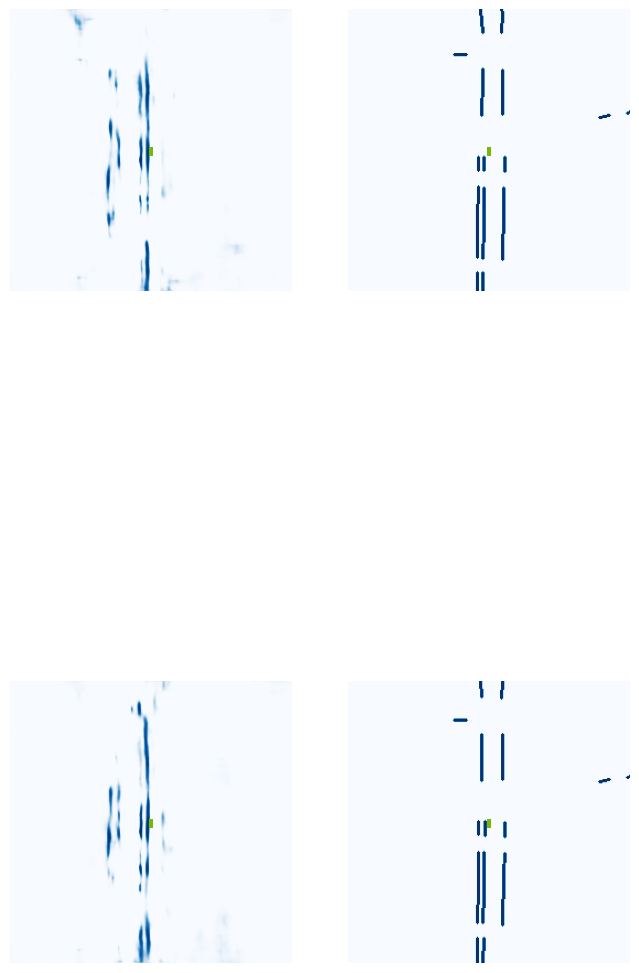

 90%|█████████ | 36/40 [00:13<00:01,  2.59it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.09.jpg


100%|██████████| 40/40 [00:14<00:00,  2.72it/s]


VAL {'loss': 0.3667428762088587, 'iou': 0.046050730275882}
saving ...  ./runs/model5500.pt
5510 0.07901088148355484
5520 0.09081479907035828
5530 0.03407183289527893
5540 0.03306696563959122
5550 0.037783488631248474
5560 0.028480086475610733
5570 0.029919471591711044
5580 0.02486717700958252
5590 0.01488164160400629
5600 0.02052365429699421
5610 0.033742792904376984
5620 0.02605963870882988
5630 0.03348714858293533
Epoch: 36/60
5640 0.019786499440670013
5650 0.02193017676472664
5660 0.021364513784646988
5670 0.028153978288173676
5680 0.012513543479144573
5690 0.025960754603147507
5700 0.013220975175499916
5710 0.03367488831281662
5720 0.01993533968925476
5730 0.04468365013599396
5740 0.02465887926518917
5750 0.06758733093738556
5760 0.09335629642009735
5770 0.1906360685825348
5780 0.05635104328393936
5790 0.03467072919011116
Epoch: 37/60
5800 0.059314608573913574
5810 0.03946857899427414
5820 0.045209821313619614
5830 0.036025092005729675
5840 0.03506462275981903
5850 0.01973306760191

  0%|          | 0/40 [00:00<?, ?it/s]

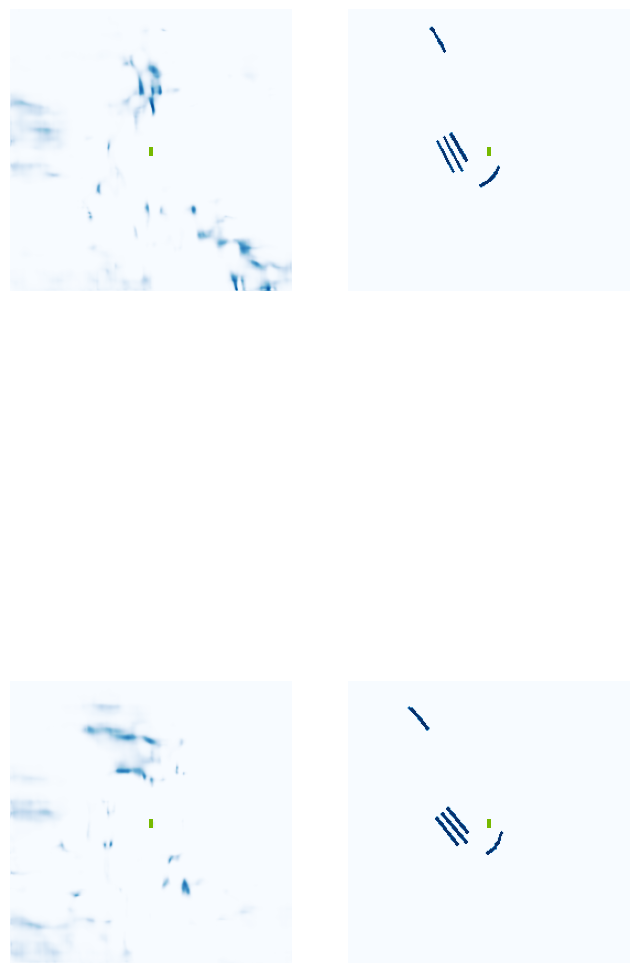

  2%|▎         | 1/40 [00:01<00:47,  1.21s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:13,  2.69it/s]

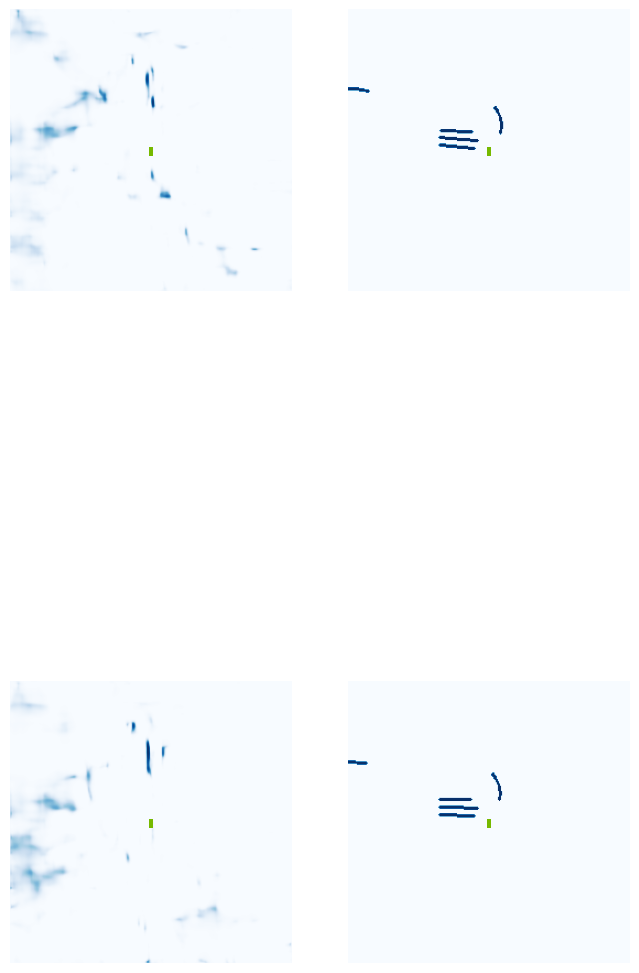

 15%|█▌        | 6/40 [00:03<00:18,  1.84it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:10,  2.87it/s]

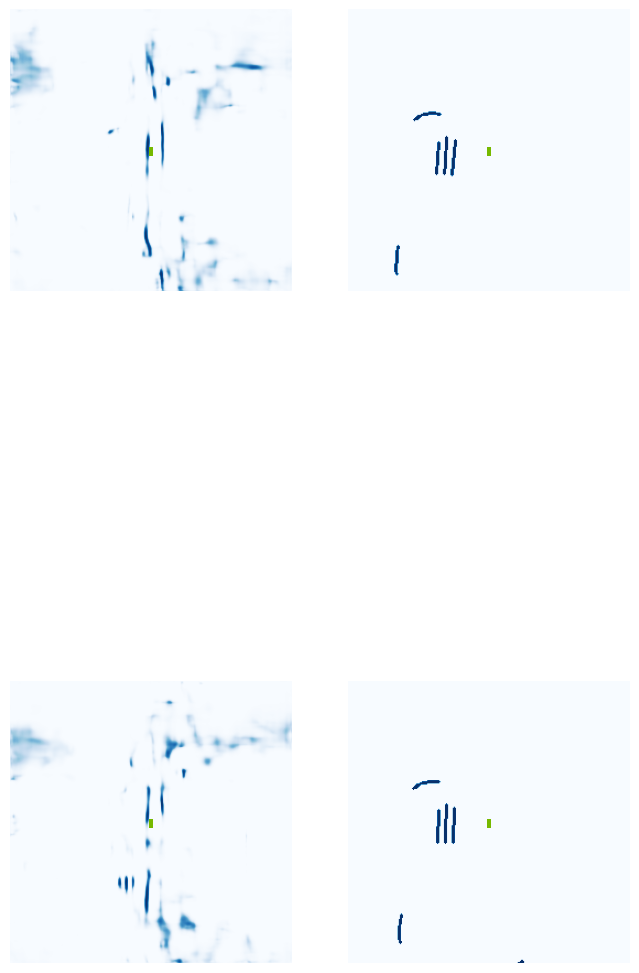

 28%|██▊       | 11/40 [00:04<00:12,  2.40it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:06<00:07,  3.13it/s]

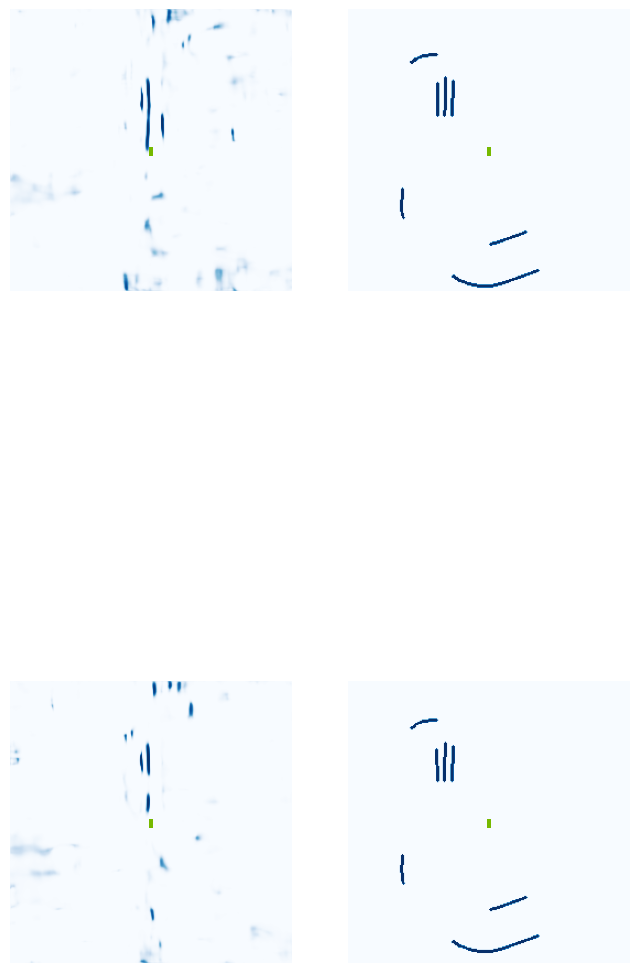

 40%|████      | 16/40 [00:06<00:09,  2.52it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.17it/s]

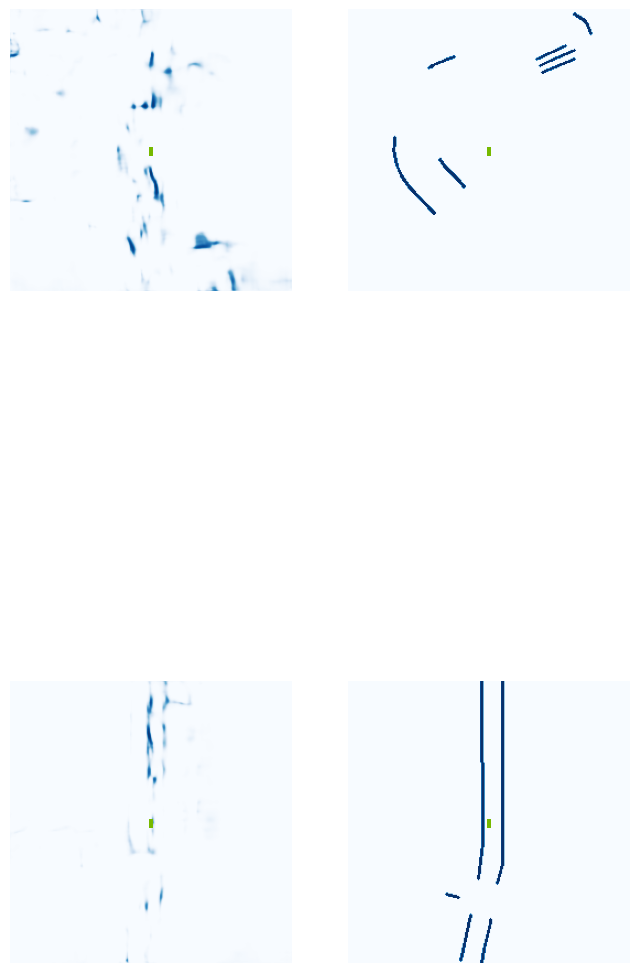

 52%|█████▎    | 21/40 [00:08<00:07,  2.55it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.00.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.20it/s]

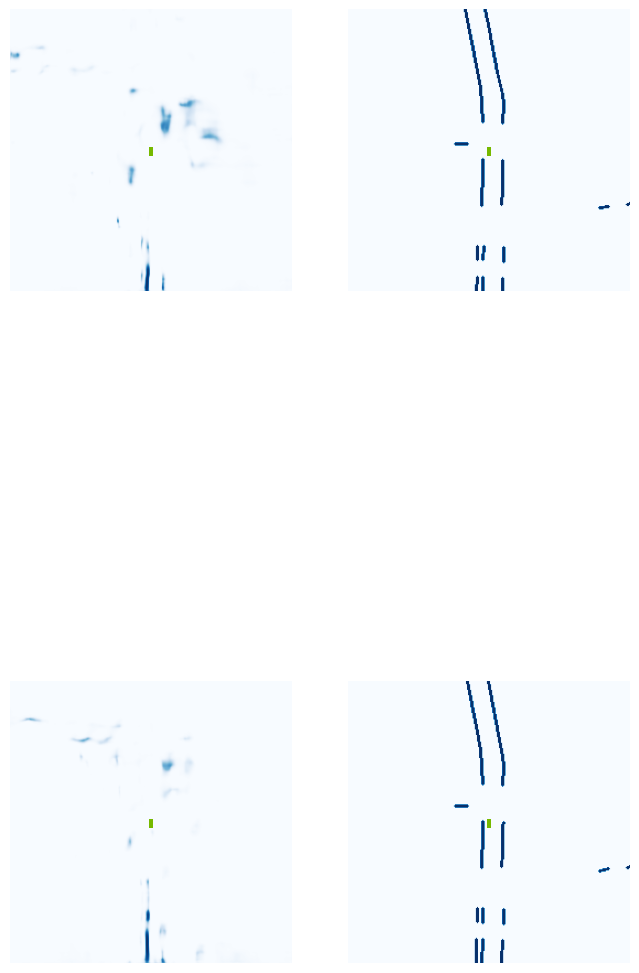

 65%|██████▌   | 26/40 [00:10<00:05,  2.59it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.01.jpg


 75%|███████▌  | 30/40 [00:11<00:03,  3.23it/s]

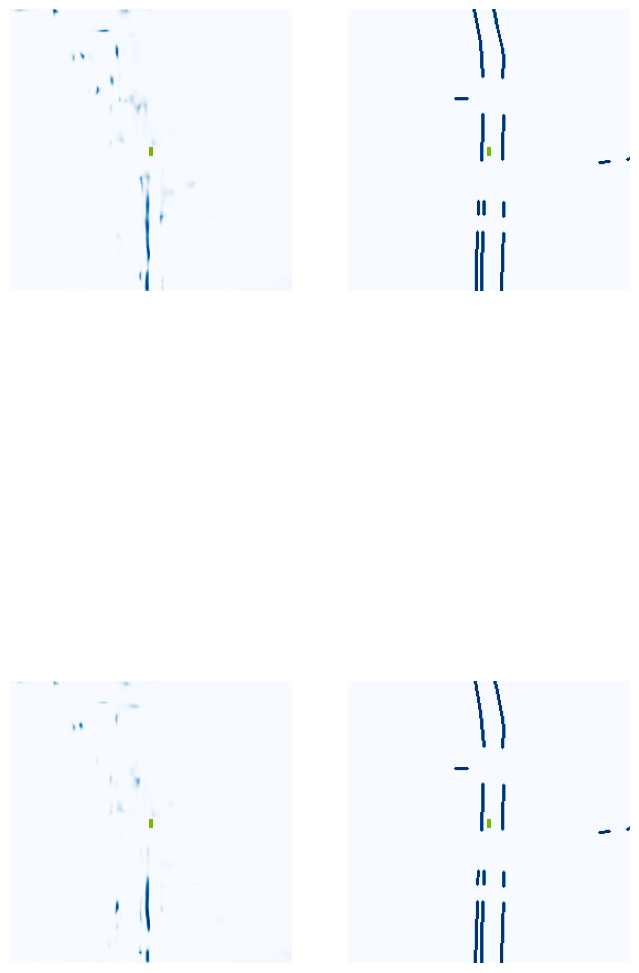

 78%|███████▊  | 31/40 [00:11<00:03,  2.62it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.02.jpg


 88%|████████▊ | 35/40 [00:13<00:01,  3.23it/s]

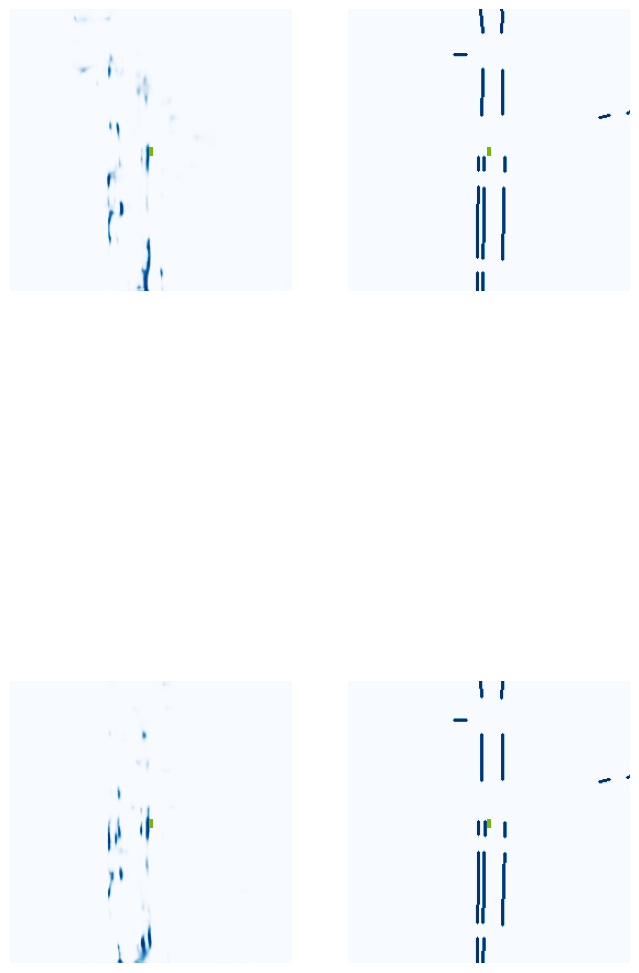

 90%|█████████ | 36/40 [00:13<00:01,  2.62it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.04.jpg


100%|██████████| 40/40 [00:14<00:00,  2.71it/s]


VAL {'loss': 0.24869920626098727, 'iou': 0.01864104768669084}
saving ...  ./runs/model6000.pt
6010 0.0366329662501812
6020 0.02202548459172249
6030 0.07520443201065063
6040 0.01226185541599989
6050 0.07417578250169754
6060 0.07991405576467514
6070 0.014204839244484901
6080 0.011725930497050285
6090 0.02387111634016037
6100 0.020341921597719193
6110 0.027374519035220146
Epoch: 39/60
6120 0.006777336820960045
6130 0.03648046404123306
6140 0.040830641984939575
6150 0.025318747386336327
6160 0.018916253000497818
6170 0.02777322381734848
6180 0.06634138524532318
6190 0.07729634642601013
6200 0.092253178358078
6210 0.01886615715920925
6220 0.06179339438676834
6230 0.055330101400613785
6240 0.02437264658510685
6250 0.02807576209306717
6260 0.05834045261144638
6270 0.03166989982128143
Epoch: 40/60
6280 0.02452394738793373
6290 0.049491383135318756
6300 0.054765745997428894
6310 0.03881608694791794
6320 0.03837176412343979
6330 0.060085736215114594
6340 0.02511301264166832
6350 0.03850839287042

  0%|          | 0/40 [00:00<?, ?it/s]

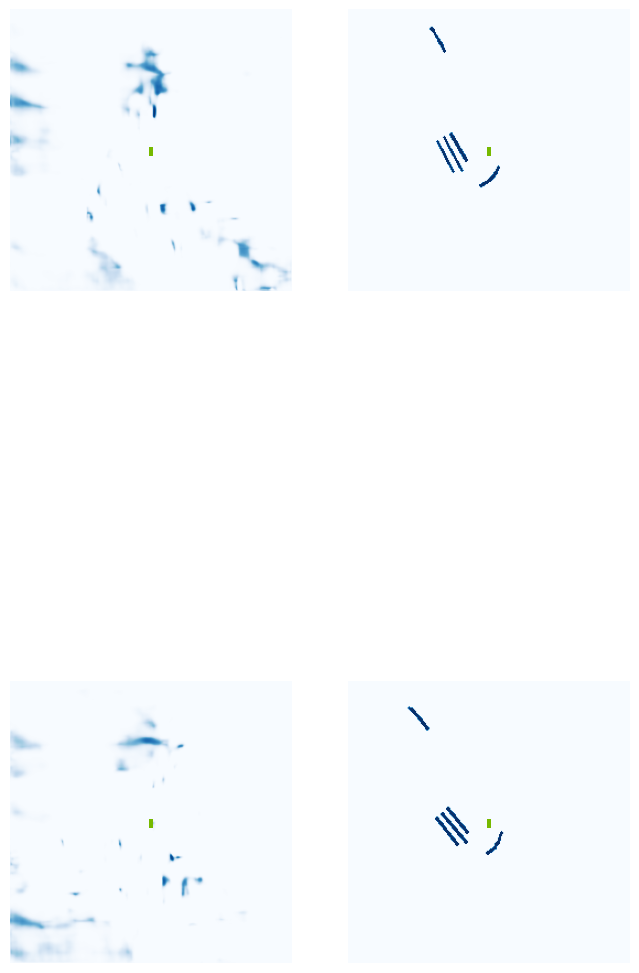

  2%|▎         | 1/40 [00:01<00:45,  1.18s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.72it/s]

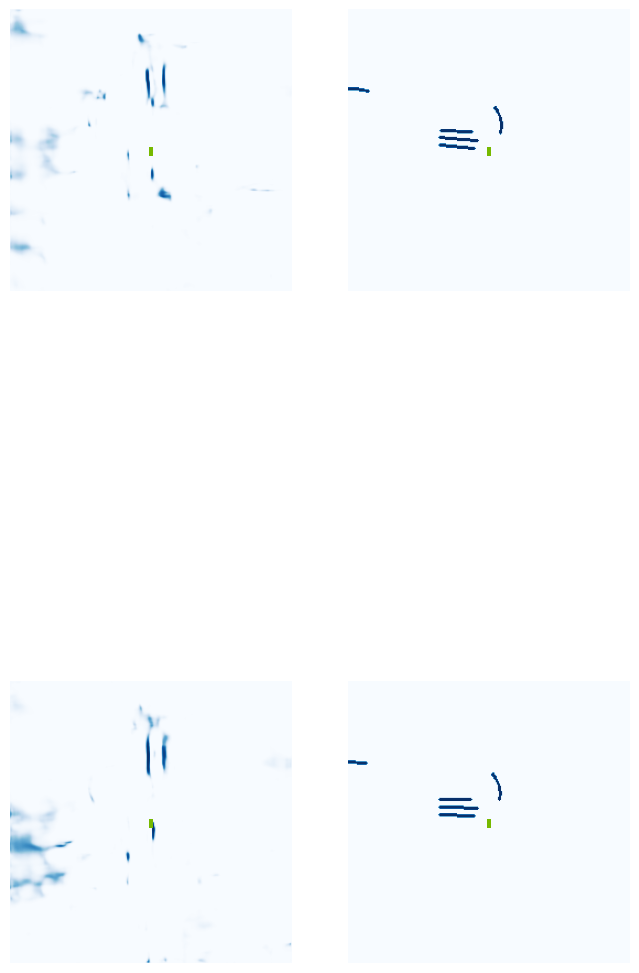

 15%|█▌        | 6/40 [00:02<00:15,  2.26it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.12it/s]

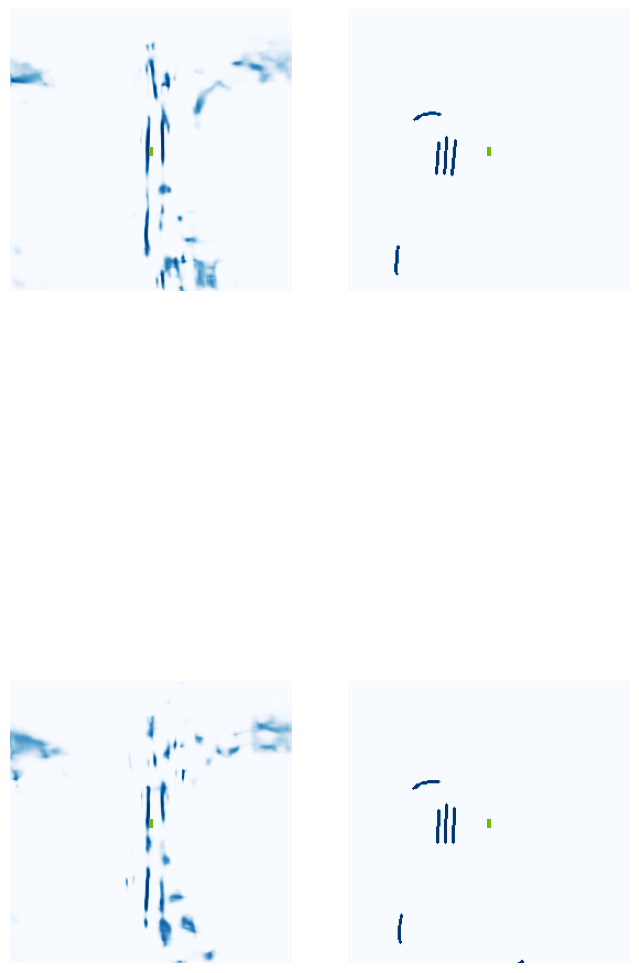

 28%|██▊       | 11/40 [00:04<00:11,  2.51it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.21it/s]

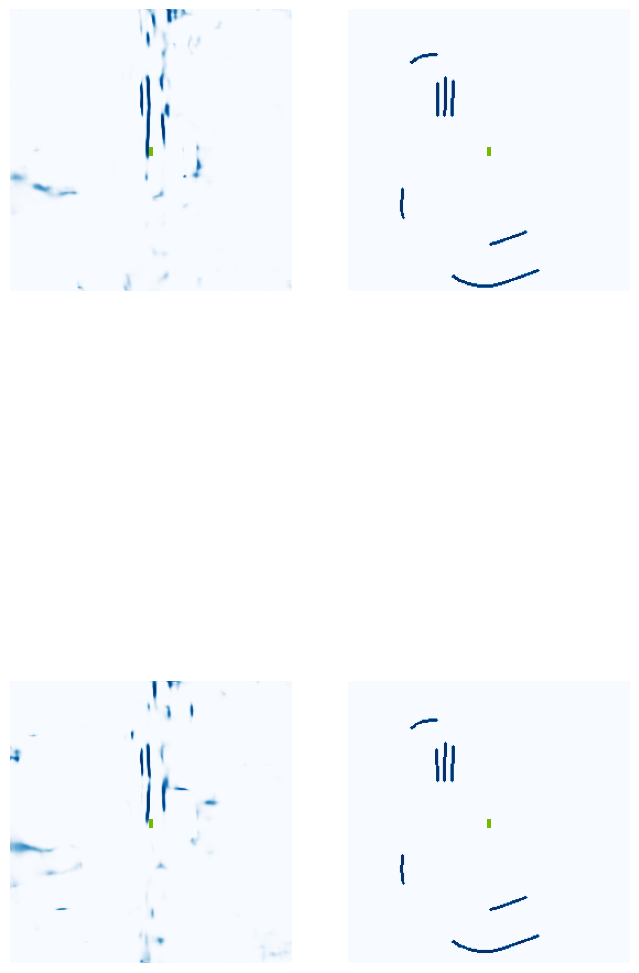

 40%|████      | 16/40 [00:06<00:09,  2.58it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.18it/s]

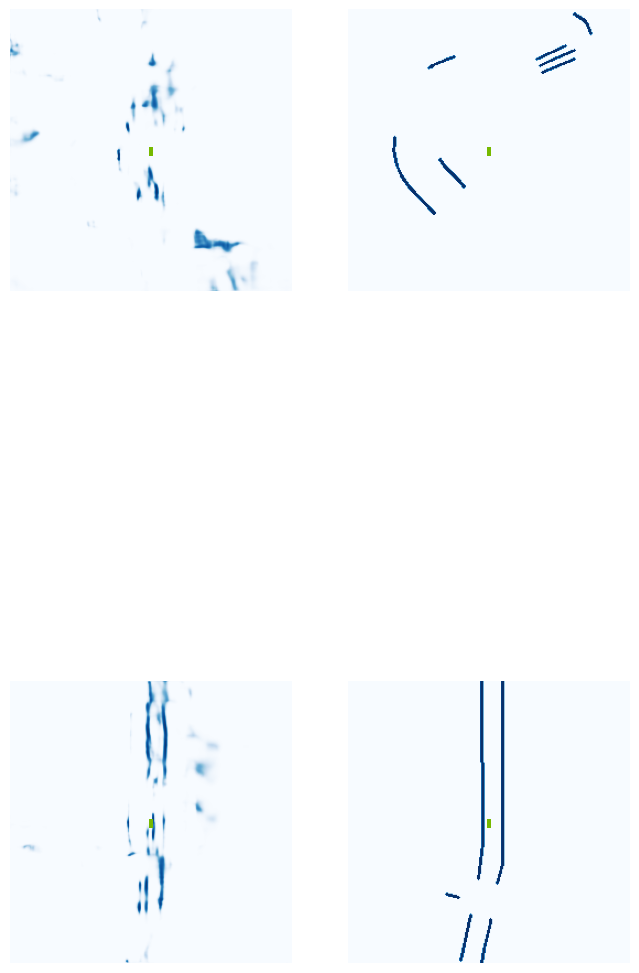

 52%|█████▎    | 21/40 [00:08<00:07,  2.58it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.07.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.18it/s]

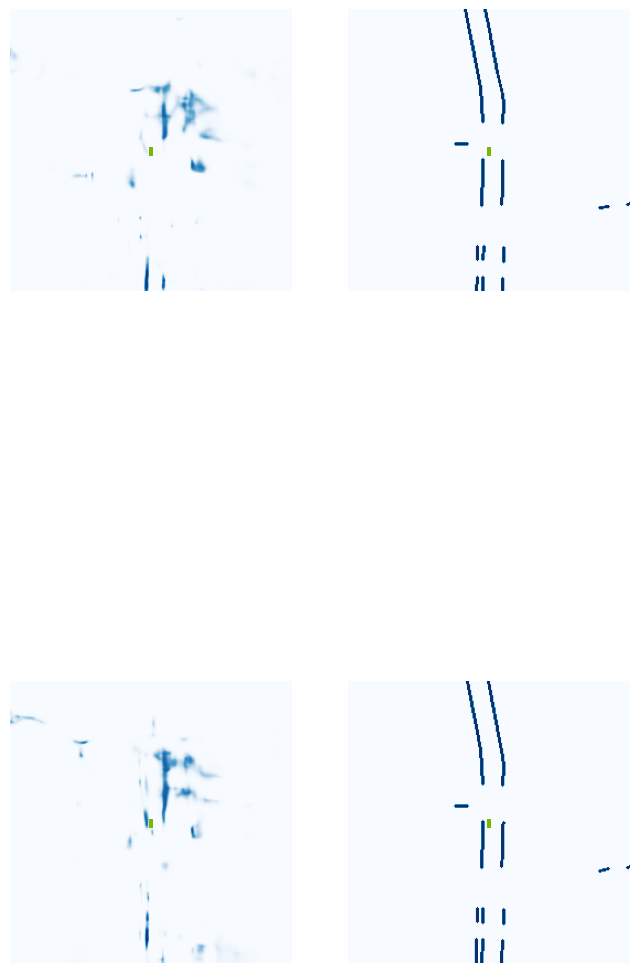

 65%|██████▌   | 26/40 [00:09<00:05,  2.56it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.06.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.19it/s]

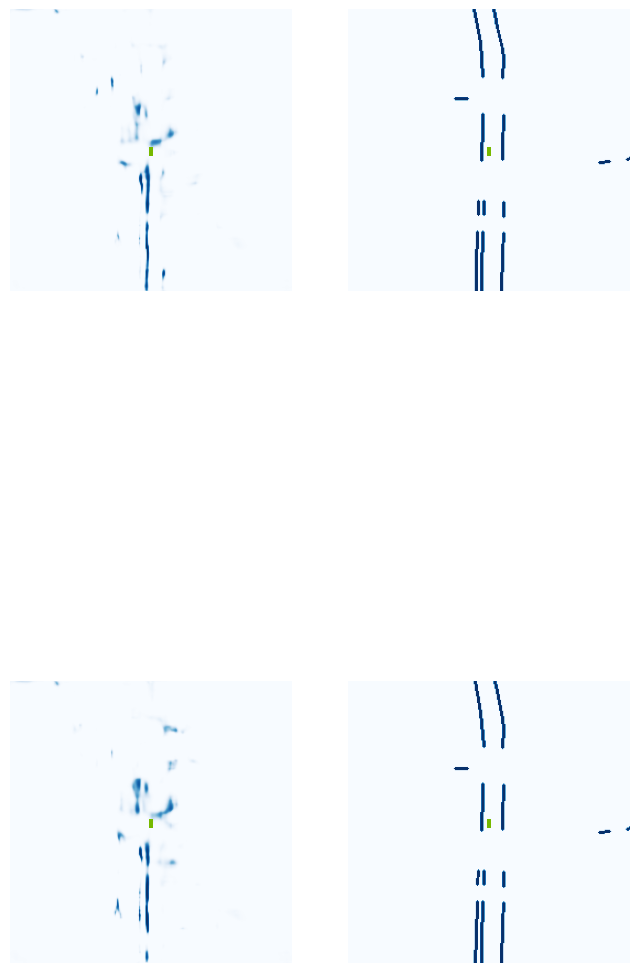

 78%|███████▊  | 31/40 [00:11<00:03,  2.59it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.05.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.21it/s]

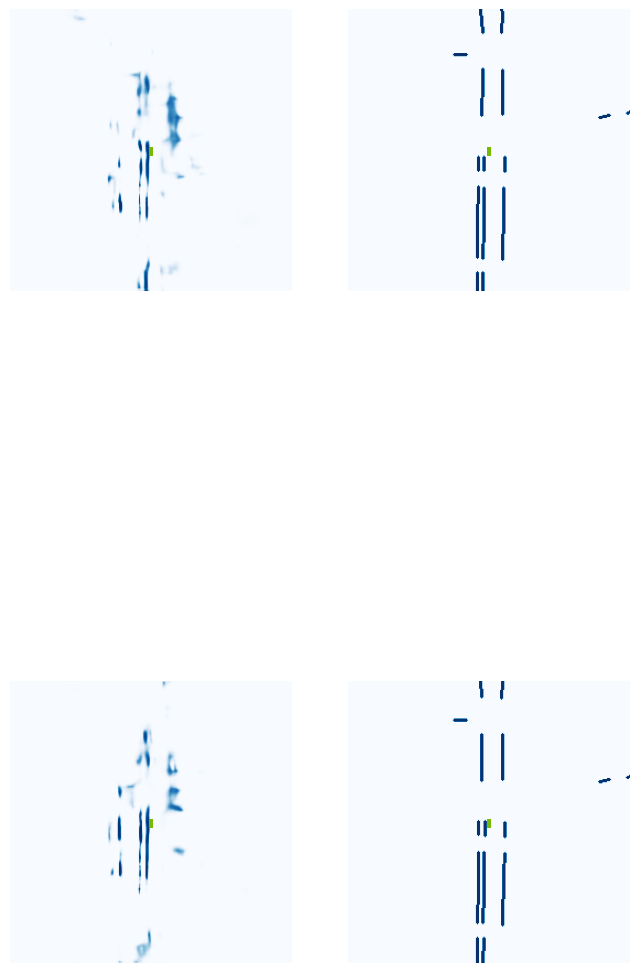

 90%|█████████ | 36/40 [00:13<00:01,  2.59it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.10.jpg


100%|██████████| 40/40 [00:14<00:00,  2.78it/s]


VAL {'loss': 0.26489869643140723, 'iou': 0.04835377935162936}
saving ...  ./runs/model6500.pt
6510 0.004368463531136513
6520 0.012895236723124981
6530 0.010635487735271454
6540 0.041315410286188126
6550 0.02295323833823204
6560 0.01611071638762951
6570 0.01985500194132328
6580 0.03885228559374809
6590 0.04432114213705063
6600 0.01970701850950718
Epoch: 42/60
6610 0.020950544625520706
6620 0.010561512783169746
6630 0.004956461489200592
6640 0.019600186496973038
6650 0.014896218664944172
6660 0.011649735271930695
6670 0.0488639734685421
6680 0.01658901385962963
6690 0.011959952302277088
6700 0.02121179923415184
6710 0.02954232692718506
6720 0.010816800408065319
6730 0.017873847857117653
6740 0.06580552458763123
6750 0.0627371221780777
6760 0.012327516451478004
Epoch: 43/60
6770 0.06951567530632019
6780 0.011642618104815483
6790 0.05140768736600876
6800 0.04949229210615158
6810 0.009516686201095581
6820 0.011753121390938759
6830 0.028353147208690643
6840 0.0071494001895189285
6850 0.02332

  0%|          | 0/40 [00:00<?, ?it/s]

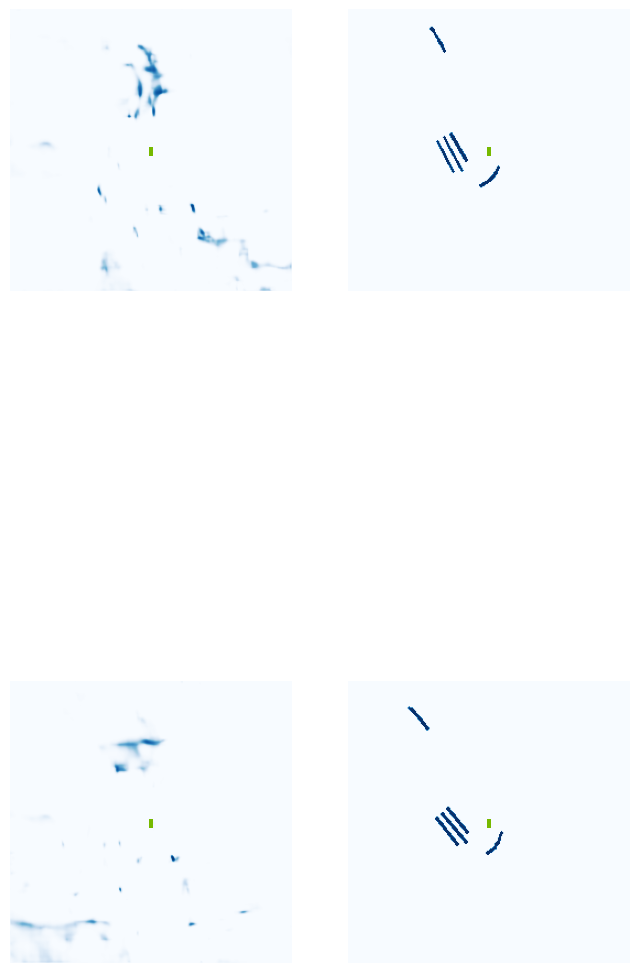

  2%|▎         | 1/40 [00:01<00:46,  1.20s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.70it/s]

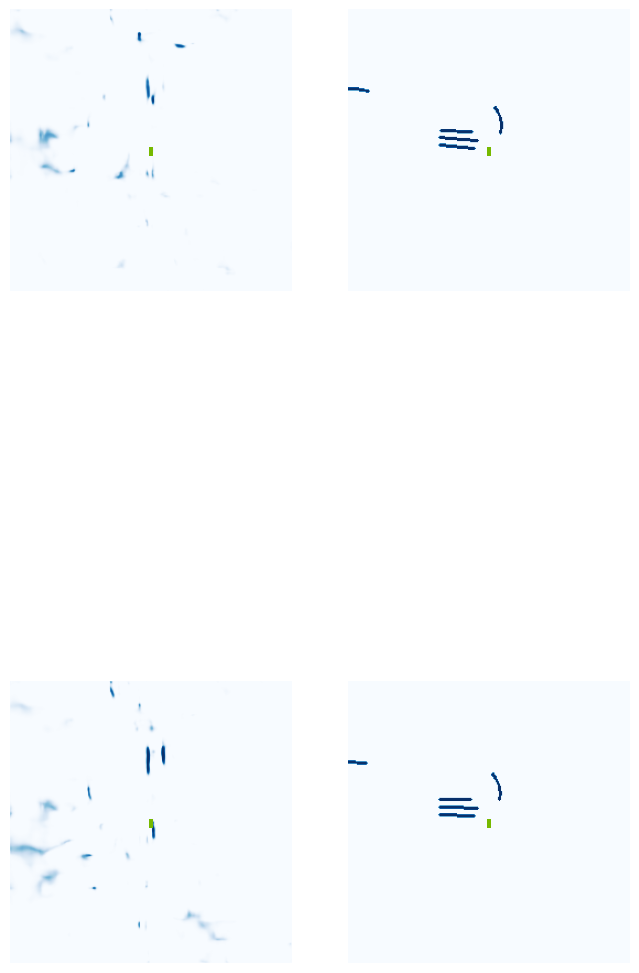

 15%|█▌        | 6/40 [00:02<00:14,  2.27it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.13it/s]

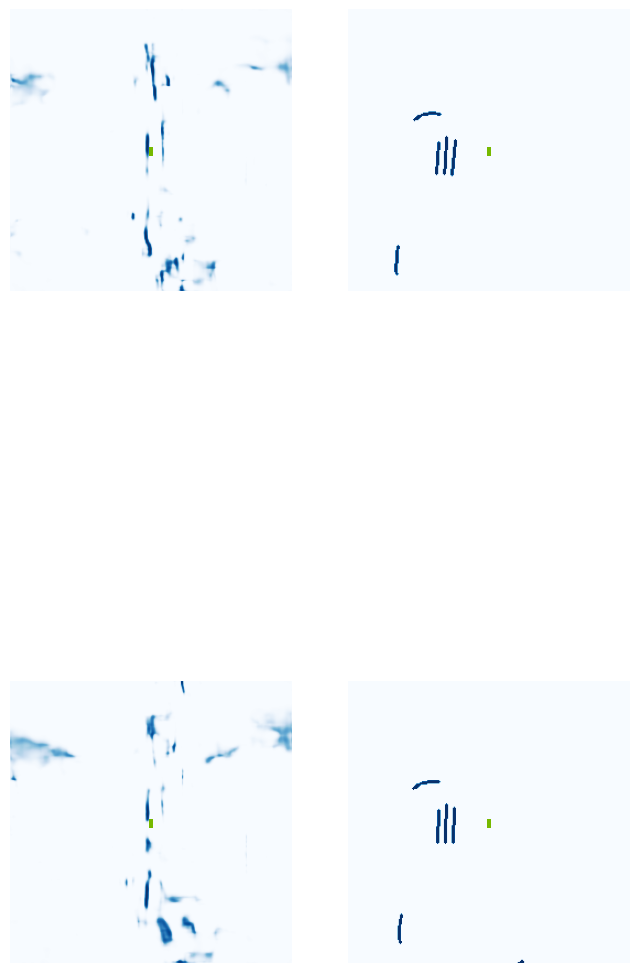

 28%|██▊       | 11/40 [00:04<00:11,  2.52it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.19it/s]

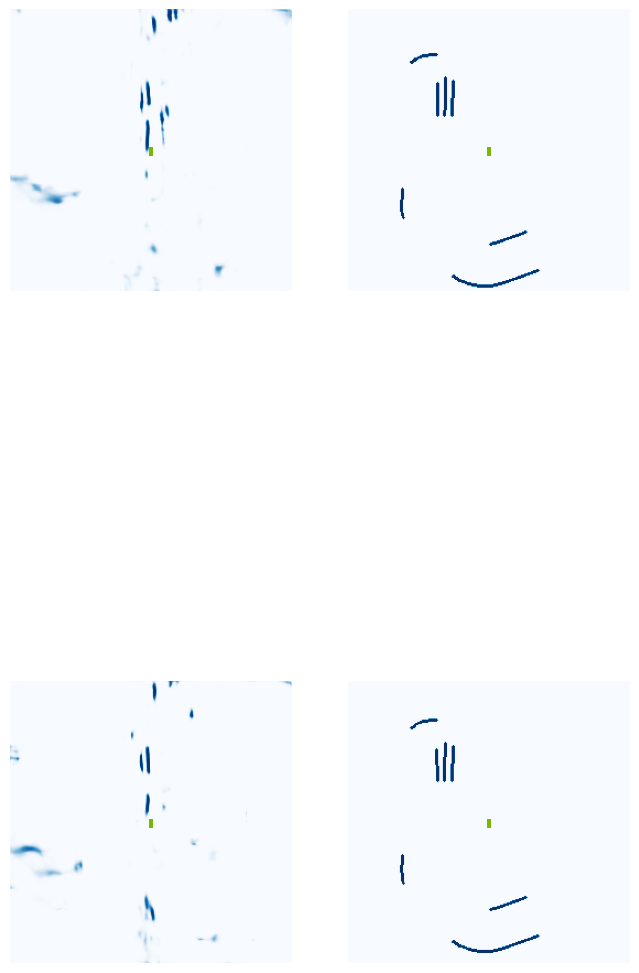

 40%|████      | 16/40 [00:06<00:09,  2.59it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.22it/s]

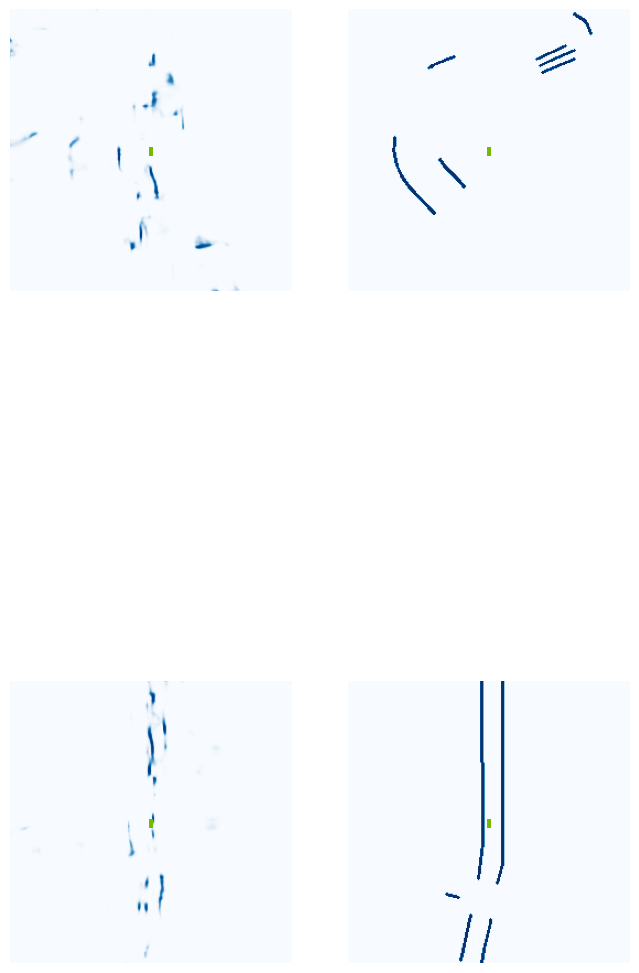

 52%|█████▎    | 21/40 [00:08<00:07,  2.61it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.02.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.22it/s]

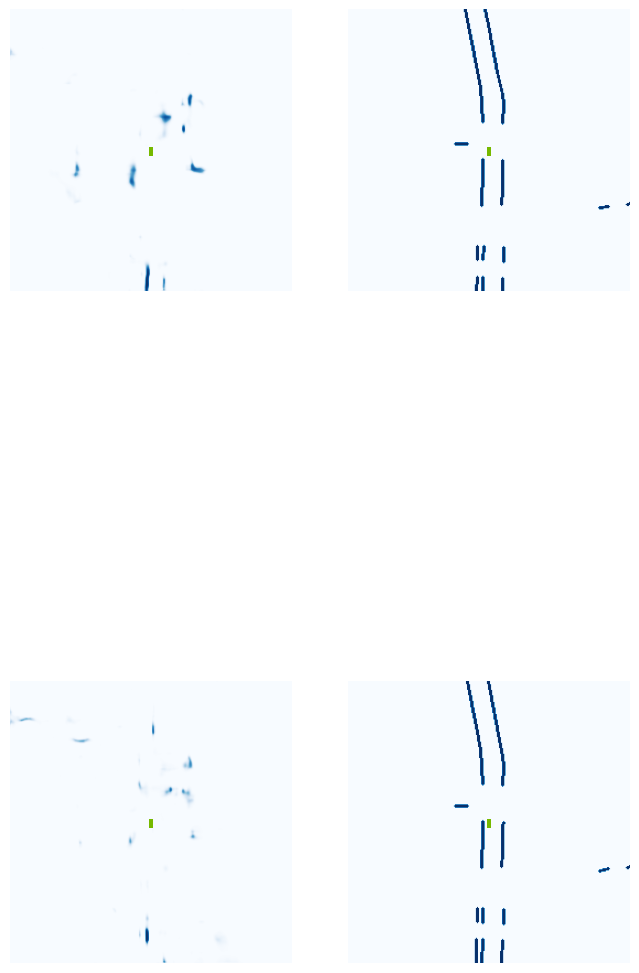

 65%|██████▌   | 26/40 [00:09<00:05,  2.58it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.01.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.21it/s]

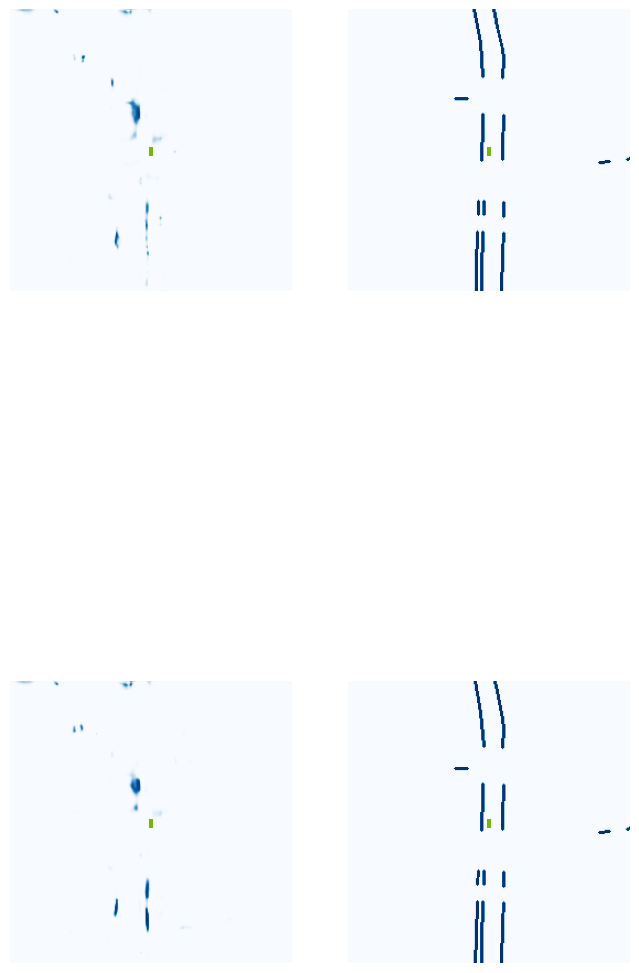

 78%|███████▊  | 31/40 [00:11<00:03,  2.61it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.02.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.25it/s]

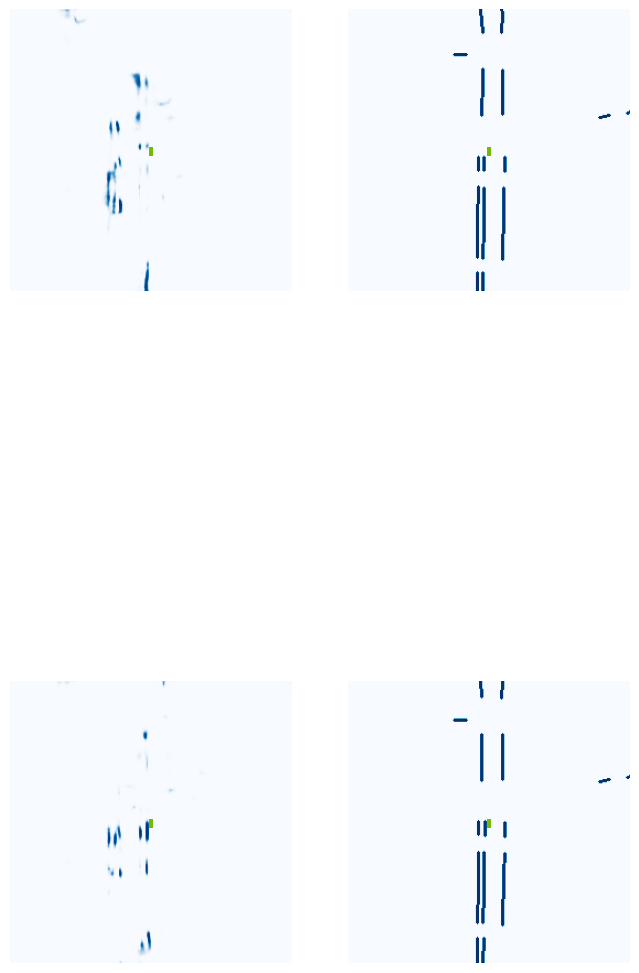

 90%|█████████ | 36/40 [00:13<00:01,  2.60it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.04.jpg


100%|██████████| 40/40 [00:14<00:00,  2.78it/s]


VAL {'loss': 0.30892893267266547, 'iou': 0.017876602148305745}
saving ...  ./runs/model7000.pt
7010 0.02178565412759781
7020 0.01668059453368187
7030 0.02159915119409561
7040 0.013087011873722076
7050 0.029684148728847504
7060 0.014050979167222977
7070 0.04281746596097946
7080 0.016320619732141495
Epoch: 45/60
7090 0.013760138303041458
7100 0.01067465078085661
7110 0.034696225076913834
7120 0.01575387641787529
7130 0.02054518461227417
7140 0.018340468406677246
7150 0.041021257638931274
7160 0.02863868698477745
7170 0.02159937098622322
7180 0.026993878185749054
7190 0.053460072726011276
7200 0.06521881371736526
7210 0.015545854344964027
7220 0.009696301072835922
7230 0.011113578453660011
7240 0.009481154382228851
Epoch: 46/60
7250 0.015714148059487343
7260 0.016481725499033928
7270 0.028245283290743828
7280 0.01679745689034462
7290 0.018901053816080093
7300 0.011878152377903461
7310 0.006823158822953701
7320 0.039664141833782196
7330 0.008936397731304169
7340 0.010924314148724079
7350 0

  0%|          | 0/40 [00:00<?, ?it/s]

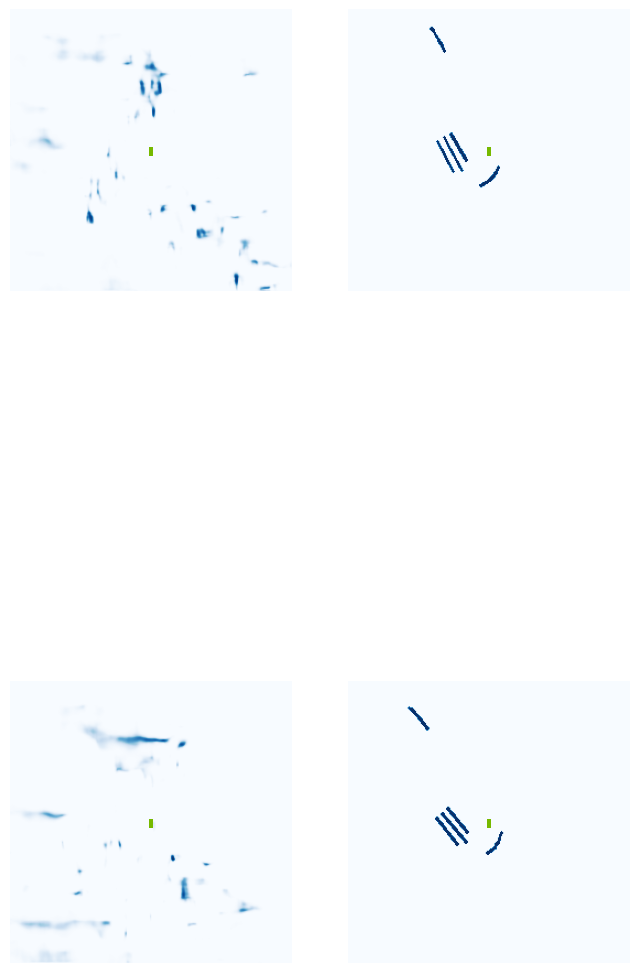

  2%|▎         | 1/40 [00:01<00:46,  1.19s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.73it/s]

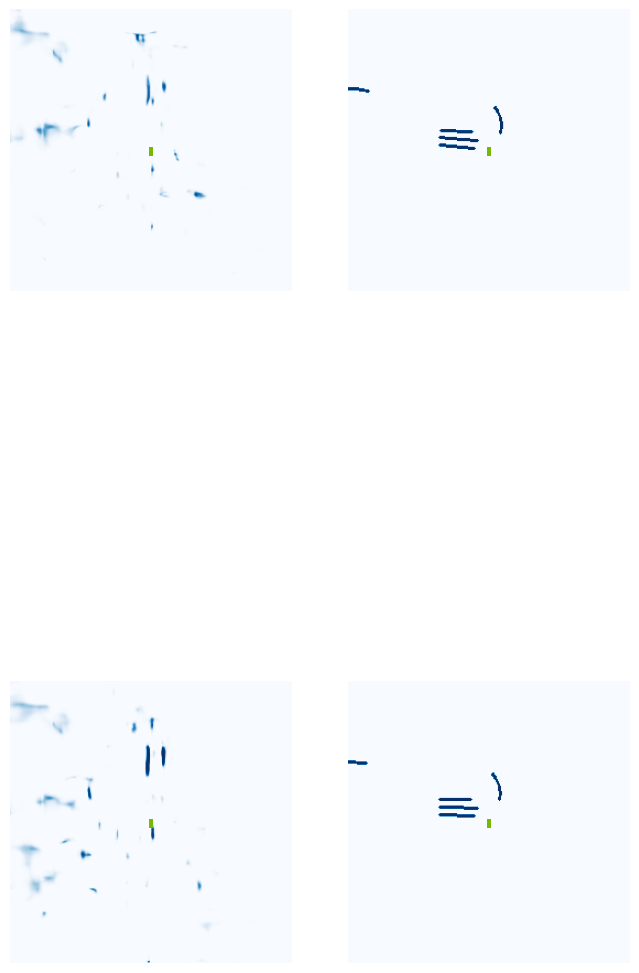

 15%|█▌        | 6/40 [00:02<00:14,  2.29it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.12it/s]

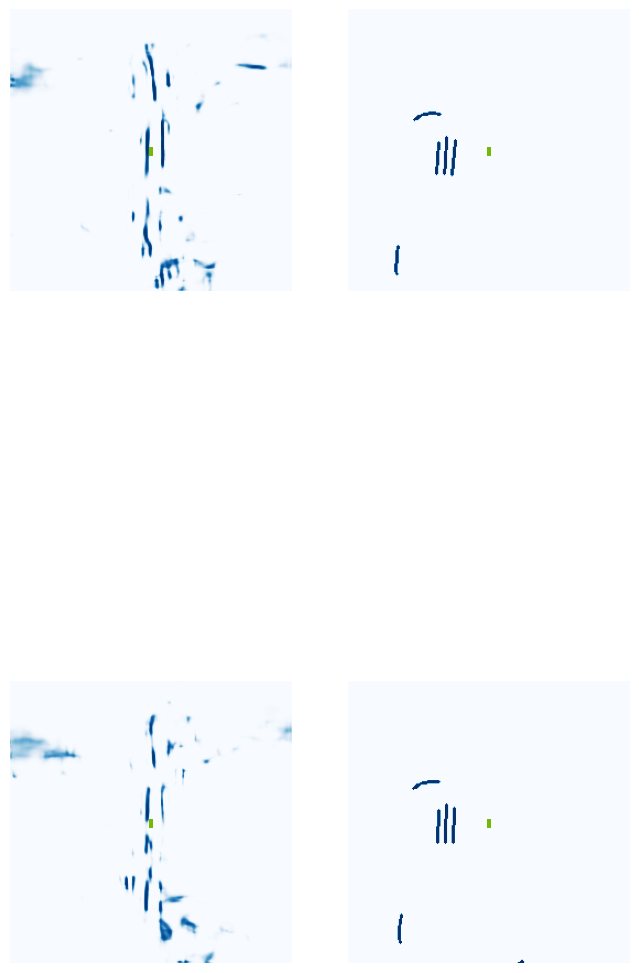

 28%|██▊       | 11/40 [00:04<00:11,  2.52it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.19it/s]

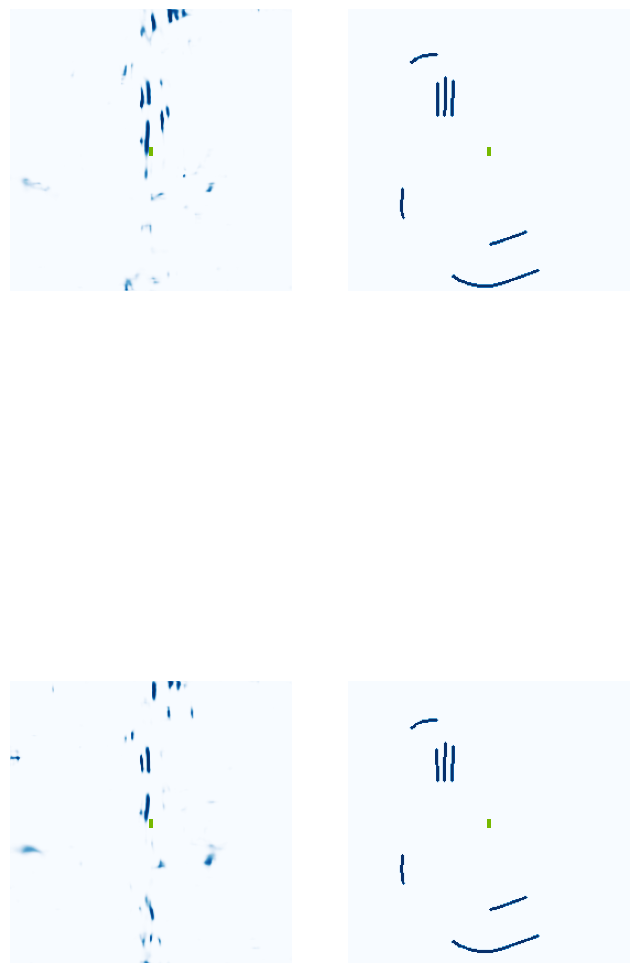

 40%|████      | 16/40 [00:06<00:09,  2.53it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.20it/s]

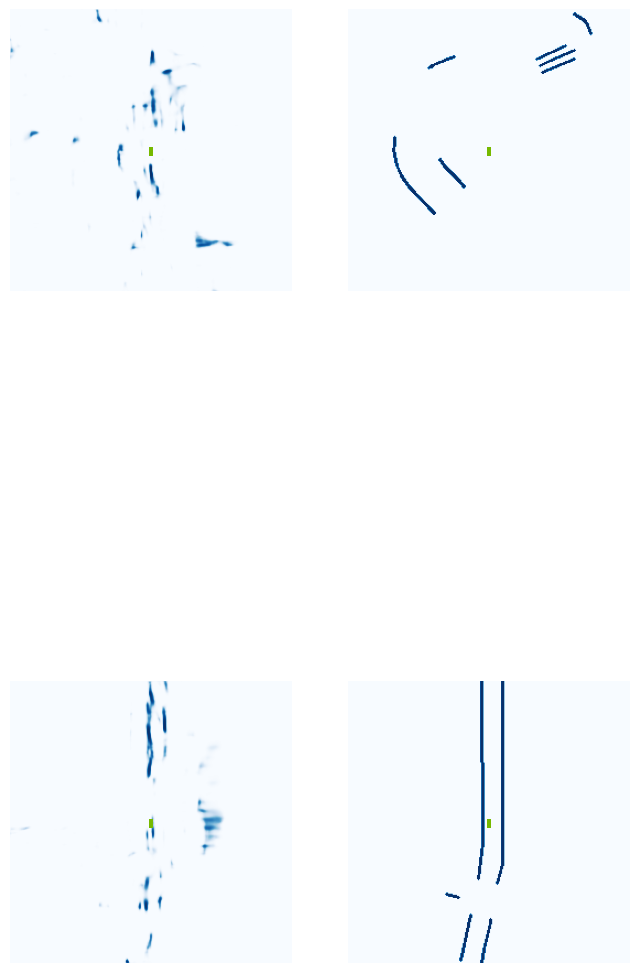

 52%|█████▎    | 21/40 [00:08<00:07,  2.58it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.02.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.19it/s]

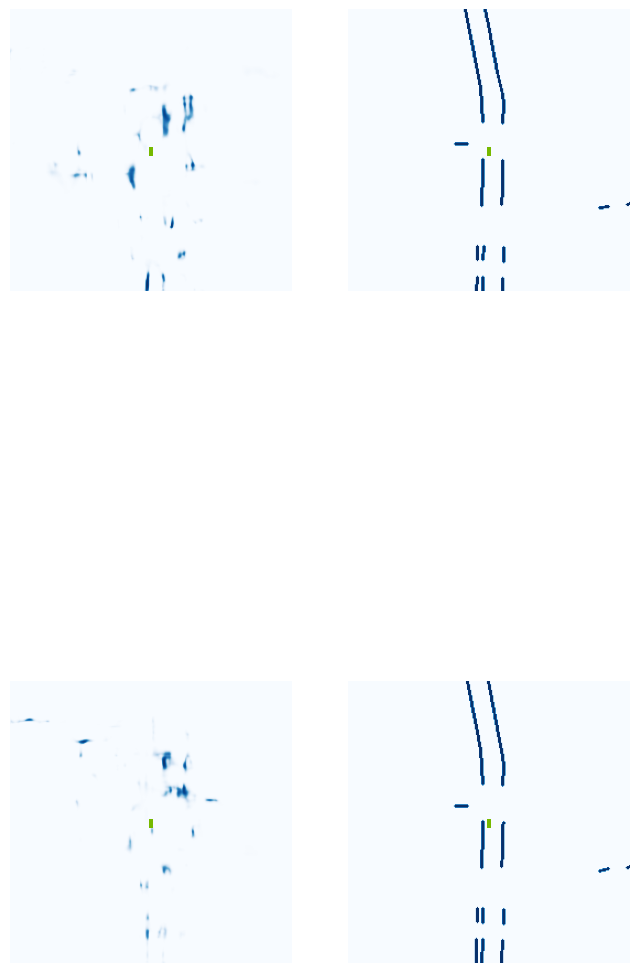

 65%|██████▌   | 26/40 [00:09<00:05,  2.59it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.21it/s]

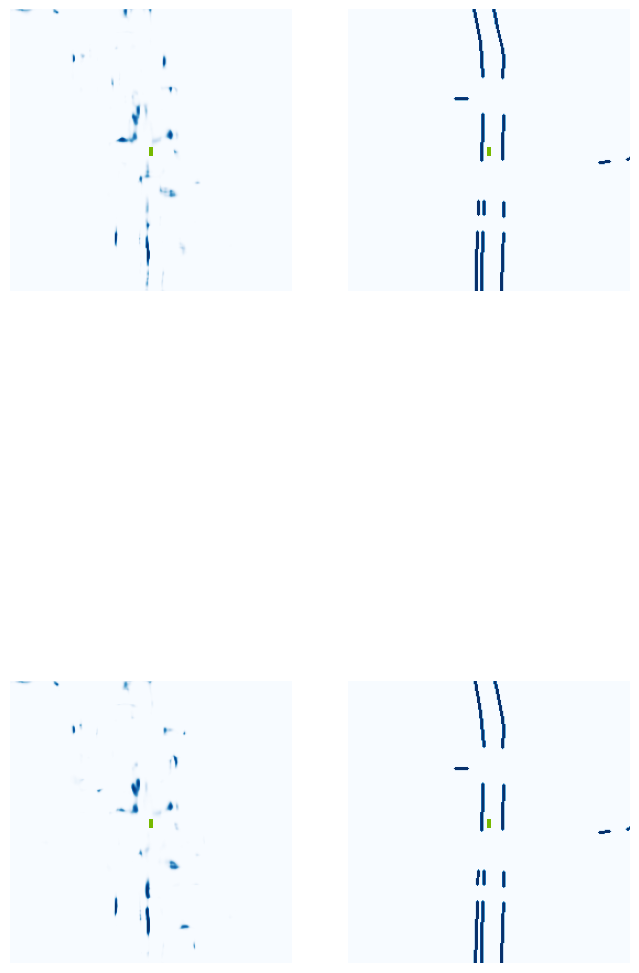

 78%|███████▊  | 31/40 [00:11<00:03,  2.54it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.02.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.21it/s]

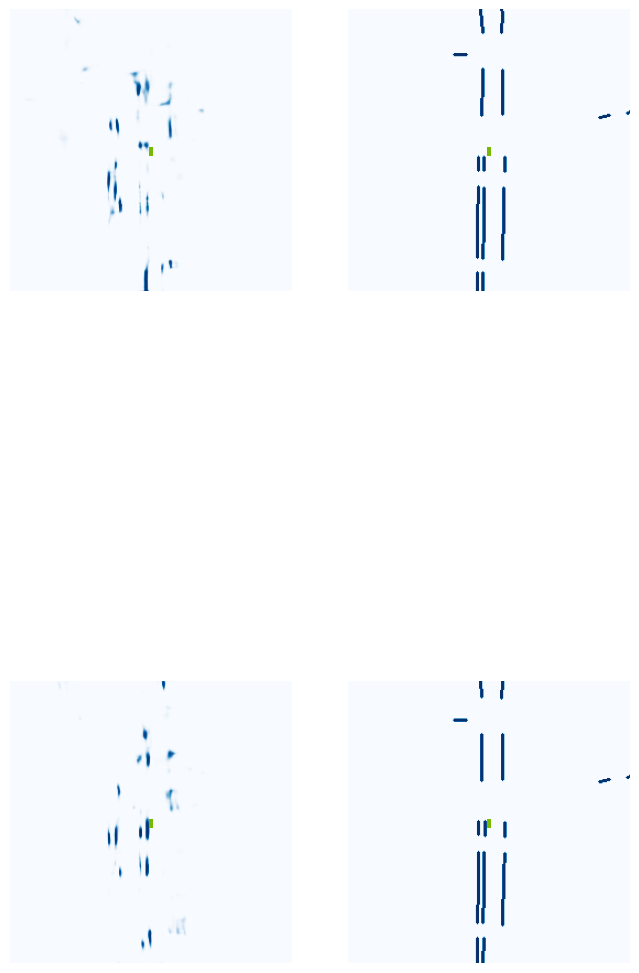

 90%|█████████ | 36/40 [00:13<00:01,  2.59it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.06.jpg


100%|██████████| 40/40 [00:14<00:00,  2.77it/s]


VAL {'loss': 0.31512954279228494, 'iou': 0.02350995266069697}
saving ...  ./runs/model7500.pt
7510 0.025677770376205444
7520 0.056096818298101425
7530 0.03967050462961197
7540 0.01668744906783104
7550 0.04009046405553818
7560 0.007937872782349586
Epoch: 48/60
7570 0.013513609766960144
7580 0.03425820916891098
7590 0.016795236617326736
7600 0.015770766884088516
7610 0.04844231903553009
7620 0.009981280192732811
7630 0.01446160115301609
7640 0.031975679099559784
7650 0.0030543990433216095
7660 0.03052820824086666
7670 0.009317051619291306
7680 0.003780058119446039
7690 0.04468994587659836
7700 0.041387394070625305
7710 0.06358658522367477
7720 0.016155976802110672
Epoch: 49/60
7730 0.008780631236732006
7740 0.009787855669856071
7750 0.039049841463565826
7760 0.00742362393066287
7770 0.008929824456572533
7780 0.03785101696848869
7790 0.01115189865231514
7800 0.0018583647906780243
7810 0.014929816126823425
7820 0.009187430143356323
7830 0.029614506289362907
7840 0.024053841829299927
7850 0

  0%|          | 0/40 [00:00<?, ?it/s]

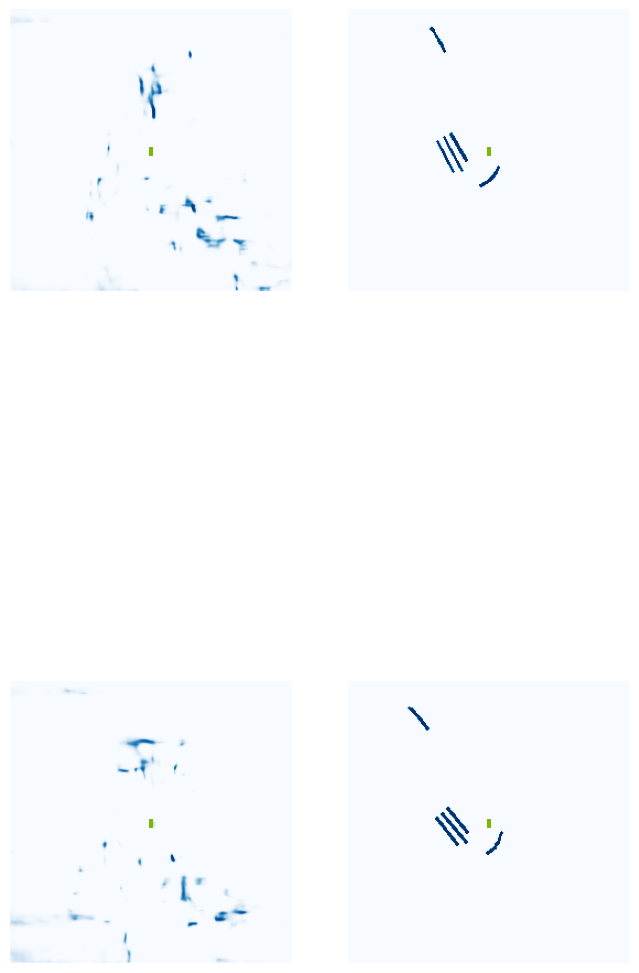

  2%|▎         | 1/40 [00:01<00:47,  1.21s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.71it/s]

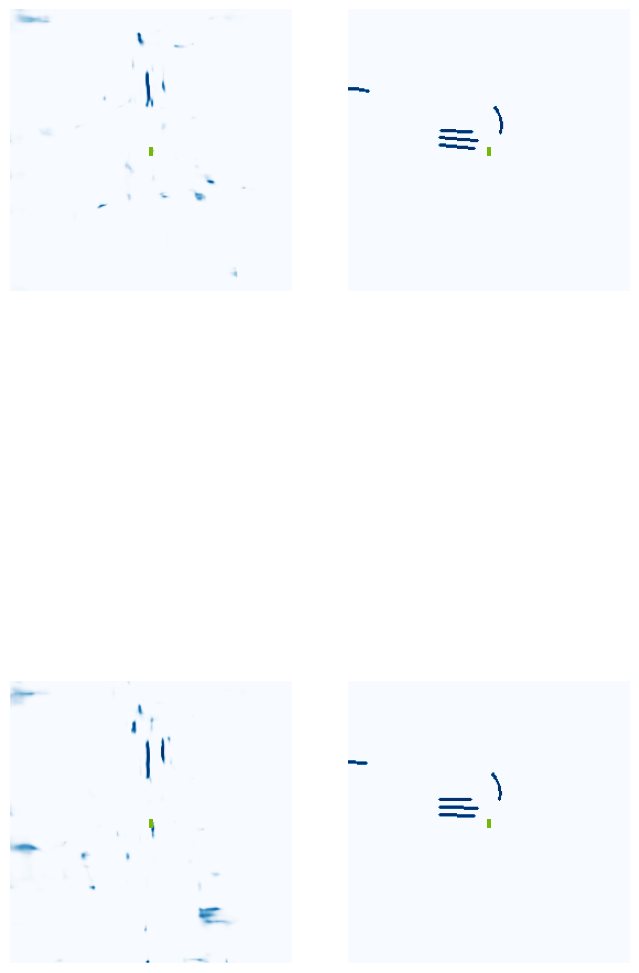

 15%|█▌        | 6/40 [00:02<00:14,  2.30it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.13it/s]

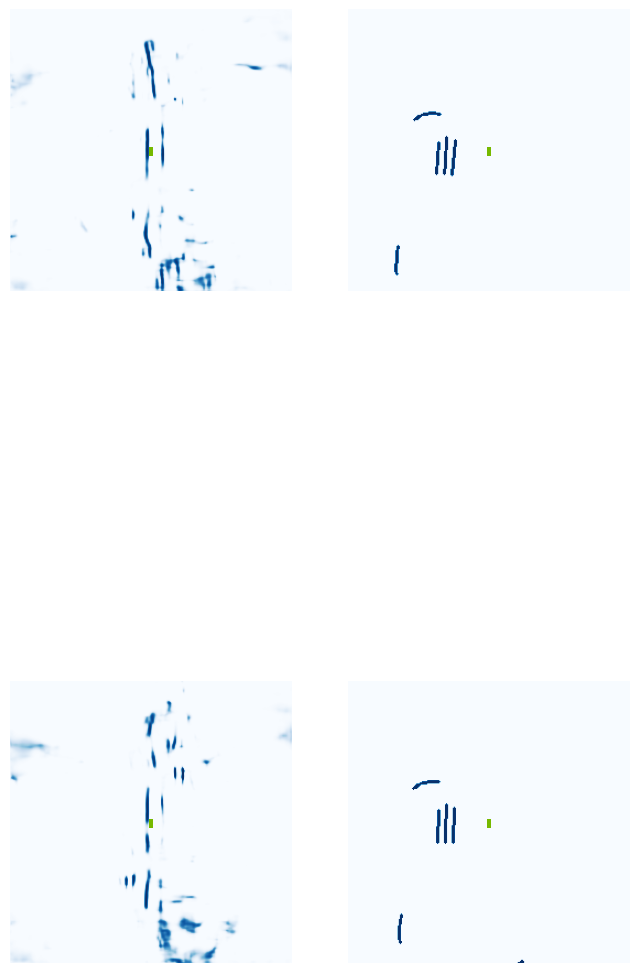

 28%|██▊       | 11/40 [00:04<00:11,  2.55it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.21it/s]

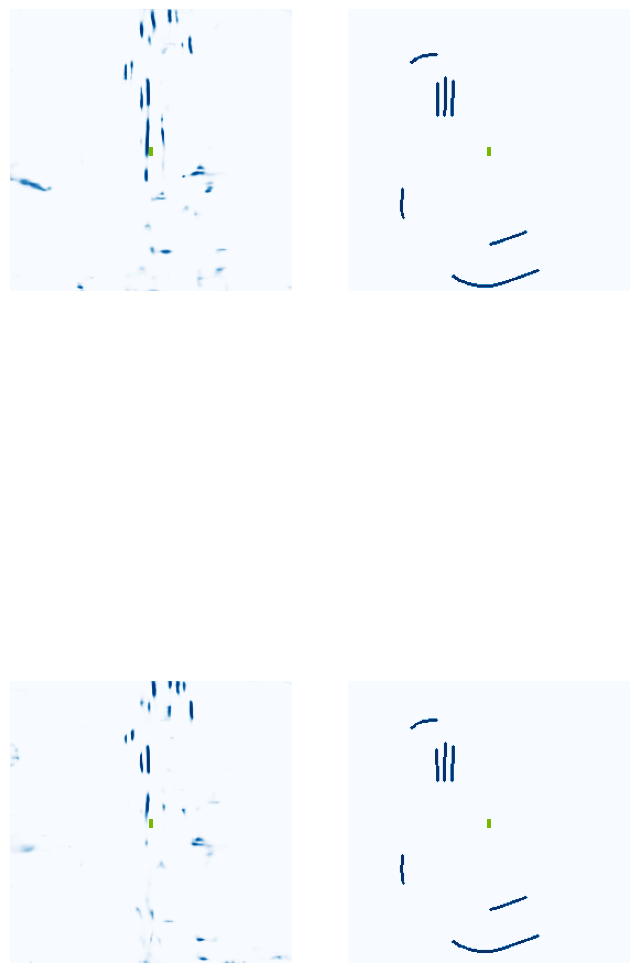

 40%|████      | 16/40 [00:06<00:09,  2.59it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.18it/s]

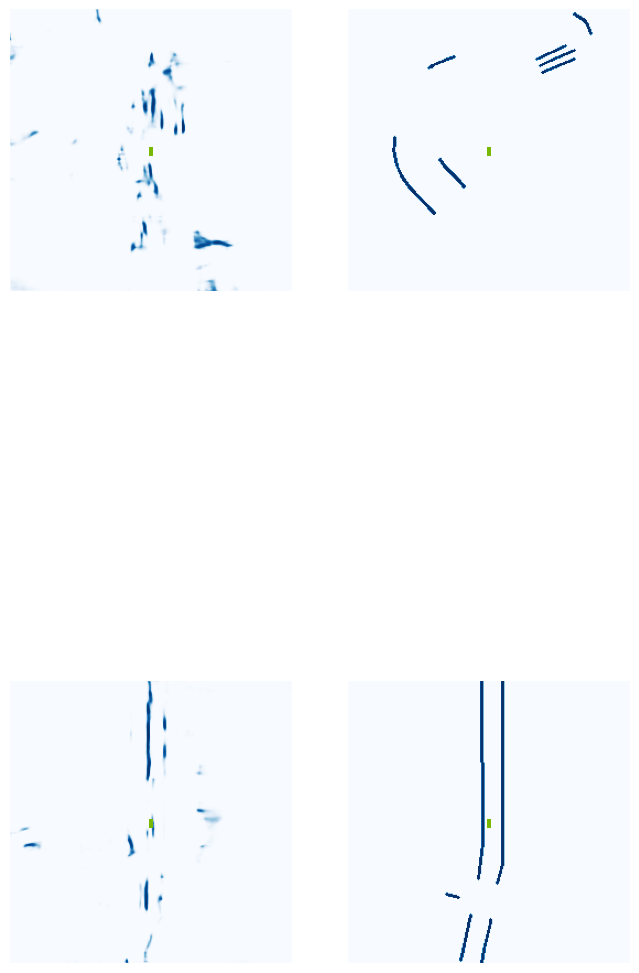

 52%|█████▎    | 21/40 [00:08<00:07,  2.57it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.02.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.18it/s]

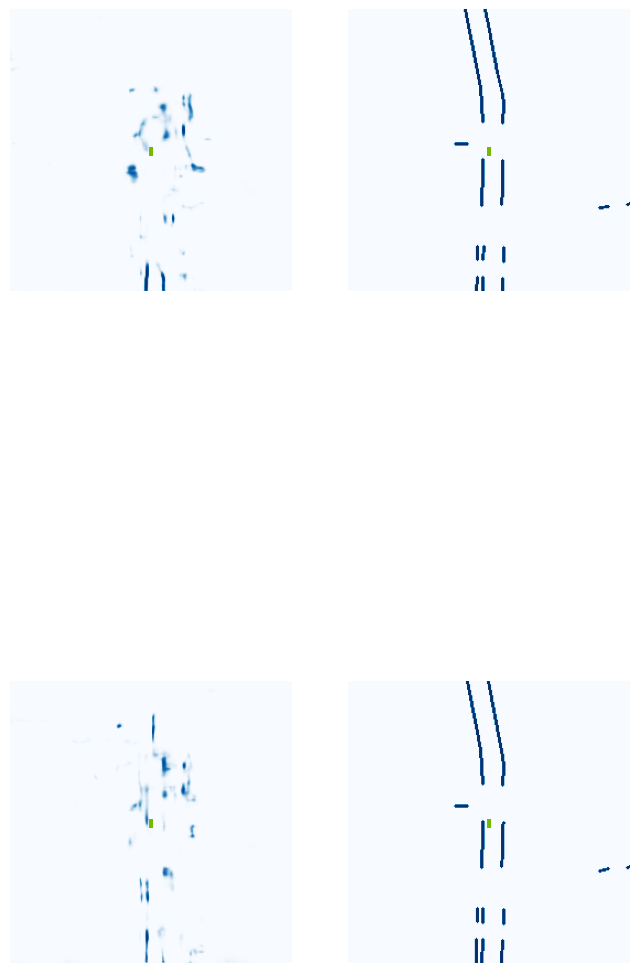

 65%|██████▌   | 26/40 [00:09<00:05,  2.58it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.02.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.22it/s]

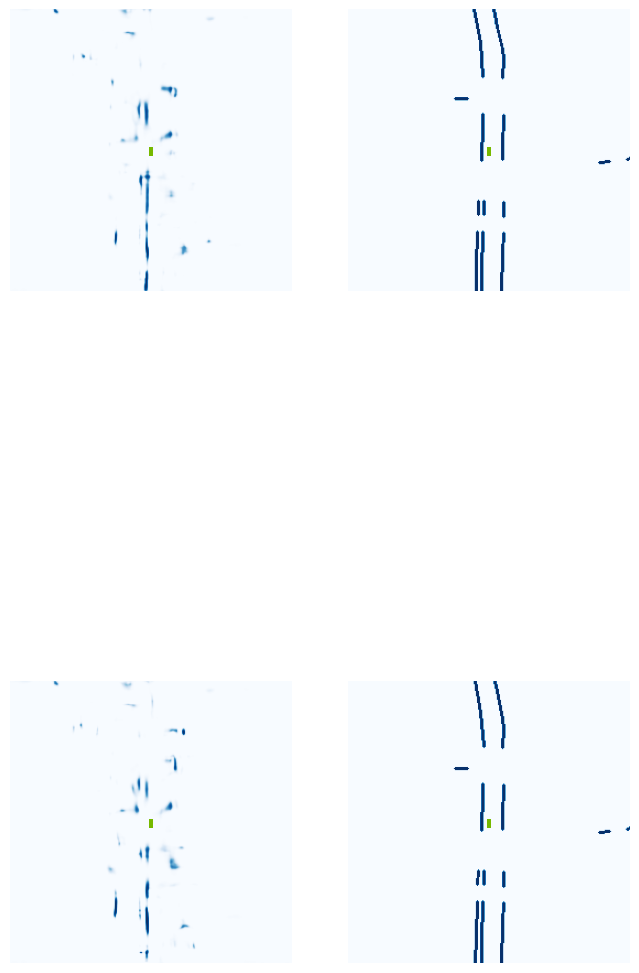

 78%|███████▊  | 31/40 [00:11<00:03,  2.57it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.04.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.17it/s]

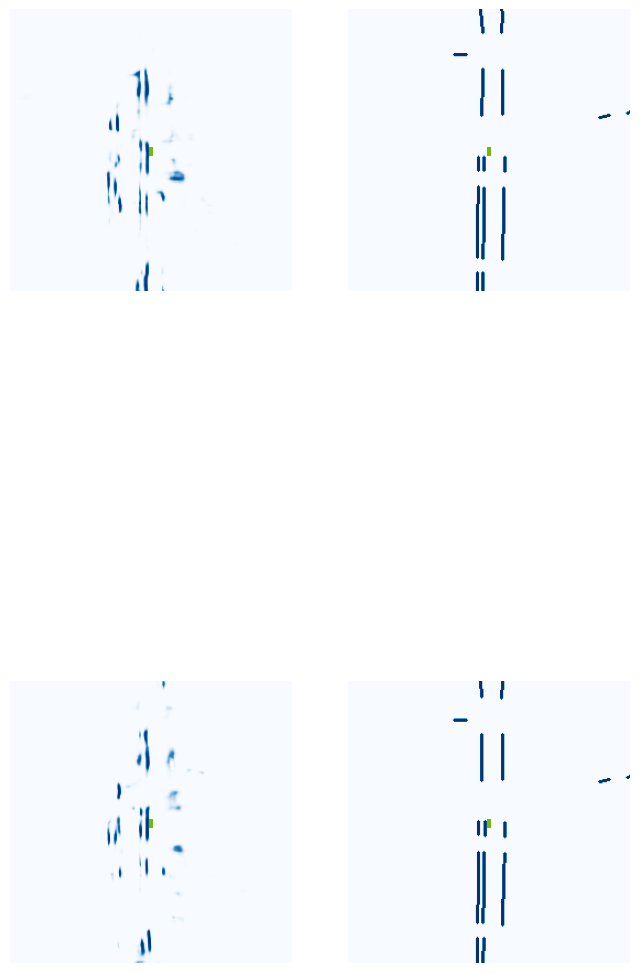

 90%|█████████ | 36/40 [00:13<00:01,  2.52it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.10.jpg


100%|██████████| 40/40 [00:14<00:00,  2.77it/s]


VAL {'loss': 0.2991811059139393, 'iou': 0.030489164362793187}
saving ...  ./runs/model8000.pt
8010 0.03171079605817795
8020 0.008771222084760666
8030 0.009049942716956139
8040 0.018623877316713333
8050 0.006359933875501156
Epoch: 51/60
8060 0.008194140158593655
8070 0.005040721967816353
8080 0.015645772218704224
8090 0.015208788216114044
8100 0.0733330175280571
8110 0.012055905535817146
8120 0.009960494935512543
8130 0.014384377747774124
8140 0.008677266538143158
8150 0.016847677528858185
8160 0.0049429405480623245
8170 0.01929377391934395
8180 0.01760132424533367
8190 0.010982457548379898
8200 0.036977190524339676
8210 0.00884859450161457
Epoch: 52/60
8220 0.051203709095716476
8230 0.023859595879912376
8240 0.022231392562389374
8250 0.007249857299029827
8260 0.013845947571098804
8270 0.009029997512698174
8280 0.017454732209444046
8290 0.08516885340213776
8300 0.009499985724687576
8310 0.01258860807865858
8320 0.034366343170404434
8330 0.004123589023947716
8340 0.013881920836865902
835

  0%|          | 0/40 [00:00<?, ?it/s]

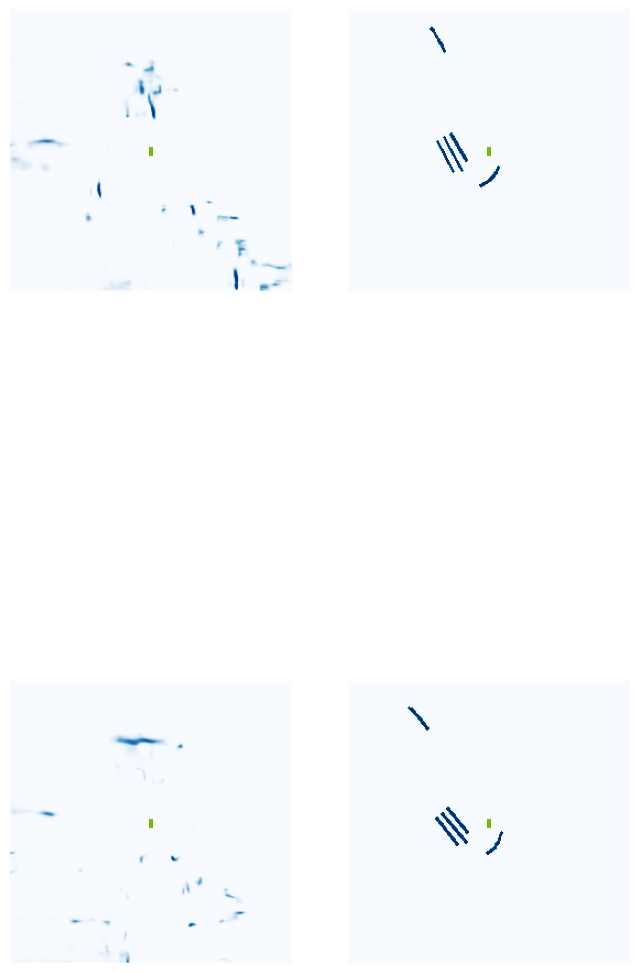

  2%|▎         | 1/40 [00:01<00:48,  1.24s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.69it/s]

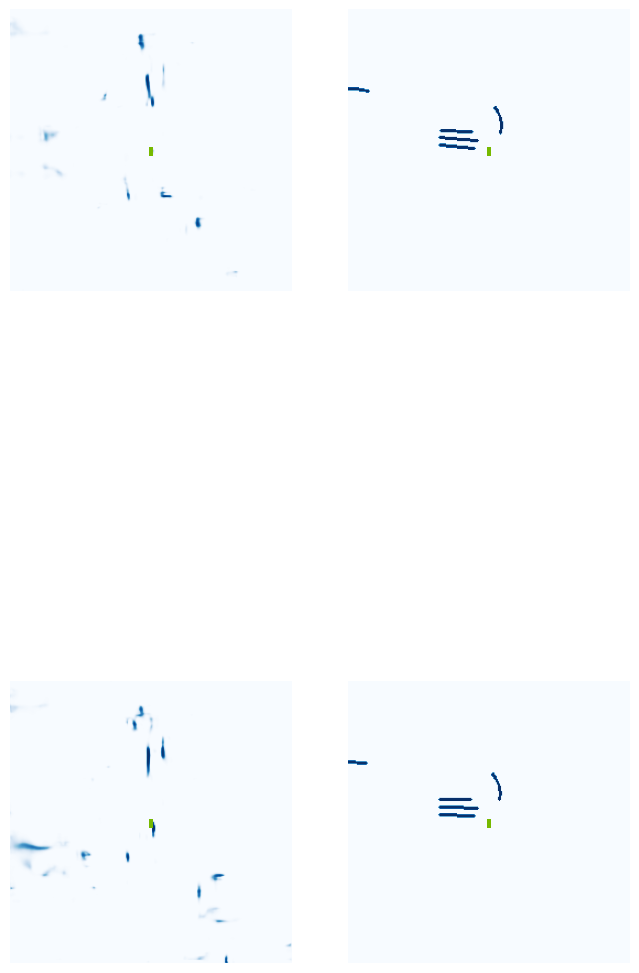

 15%|█▌        | 6/40 [00:02<00:14,  2.29it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.11it/s]

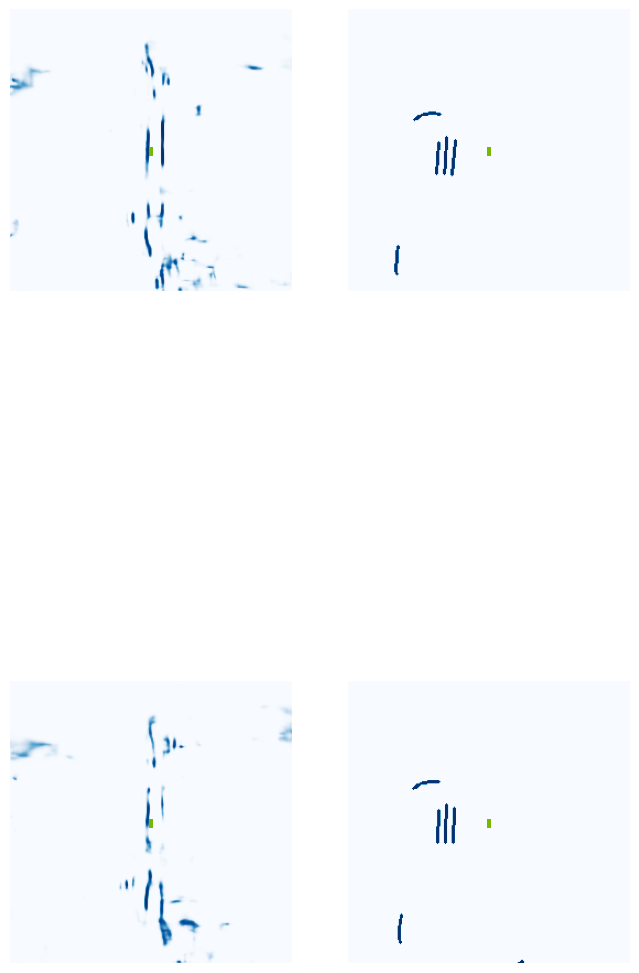

 28%|██▊       | 11/40 [00:04<00:11,  2.53it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.18it/s]

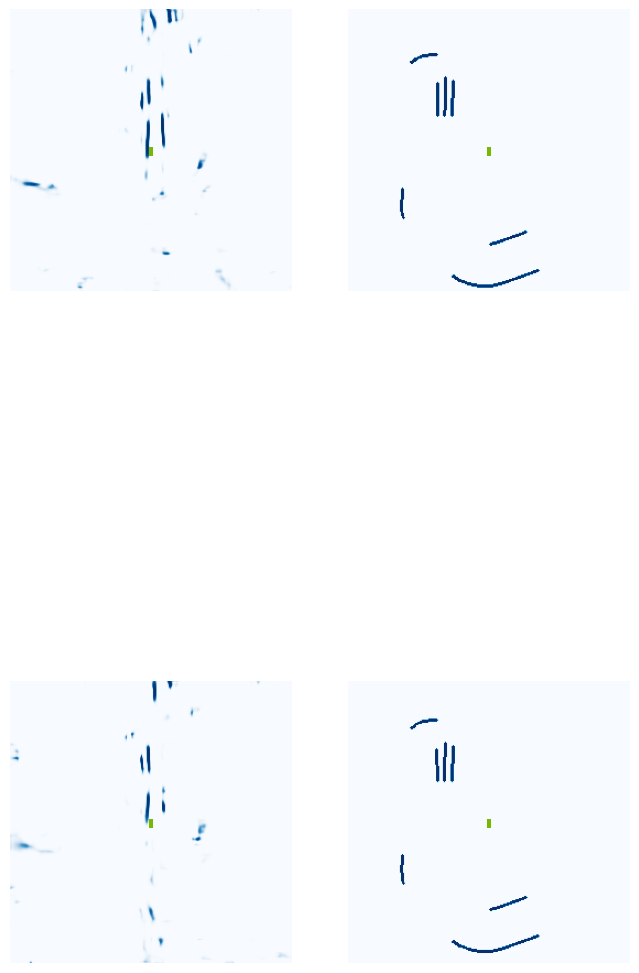

 40%|████      | 16/40 [00:06<00:09,  2.57it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.23it/s]

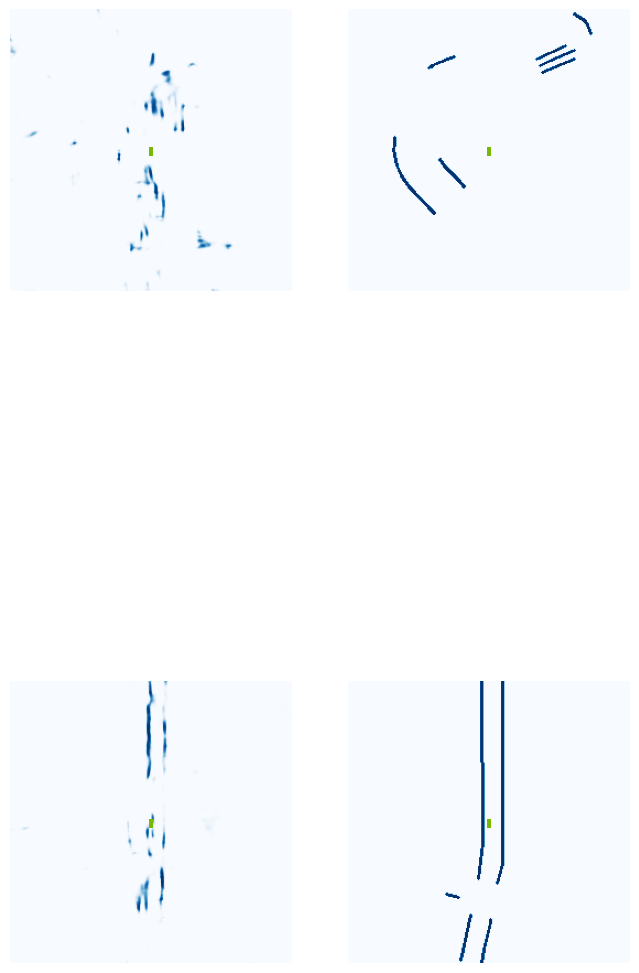

 52%|█████▎    | 21/40 [00:08<00:07,  2.60it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.04.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.21it/s]

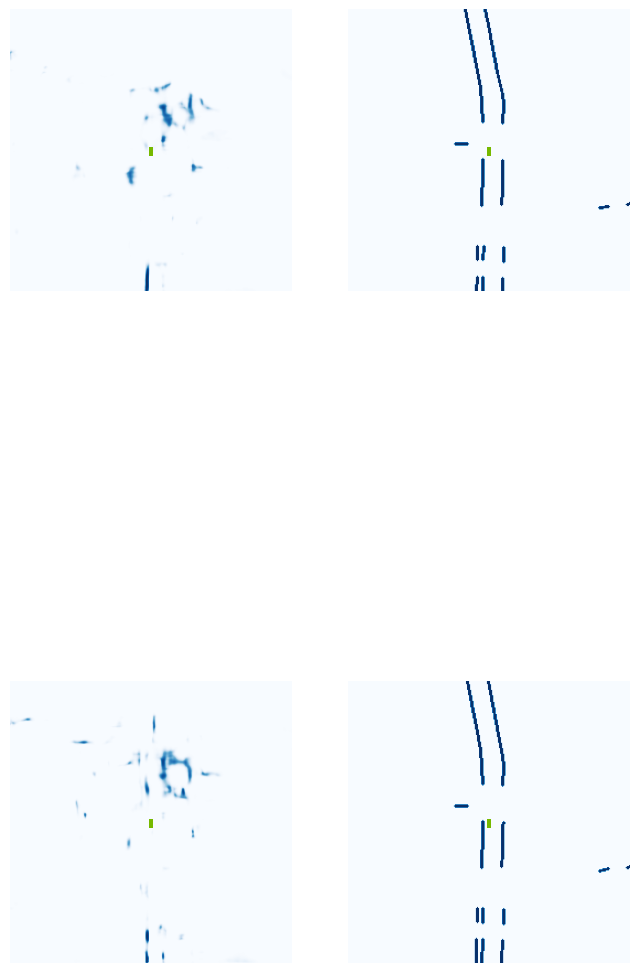

 65%|██████▌   | 26/40 [00:09<00:05,  2.58it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.04.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.21it/s]

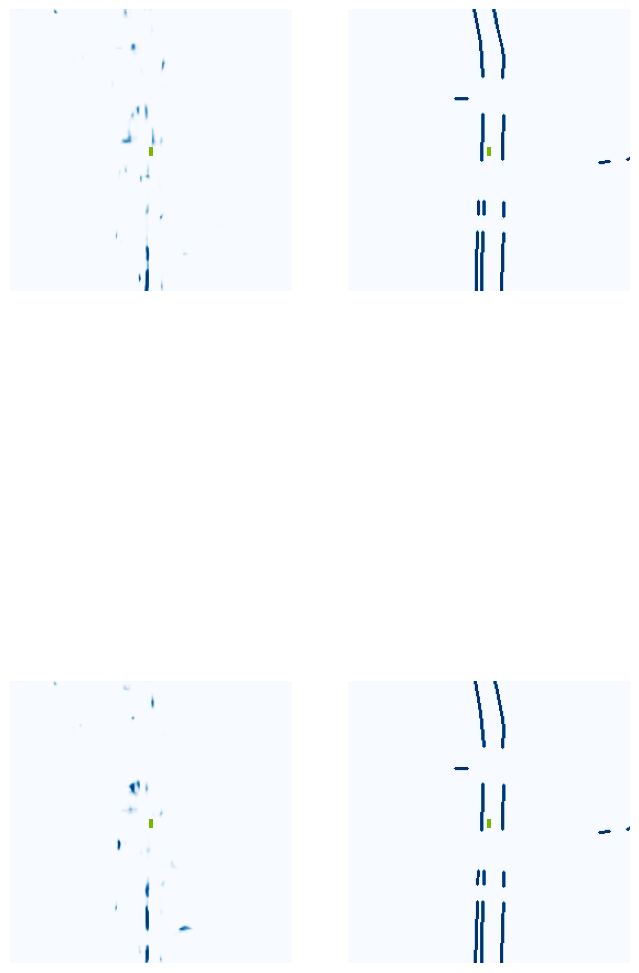

 78%|███████▊  | 31/40 [00:11<00:03,  2.61it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.01.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.21it/s]

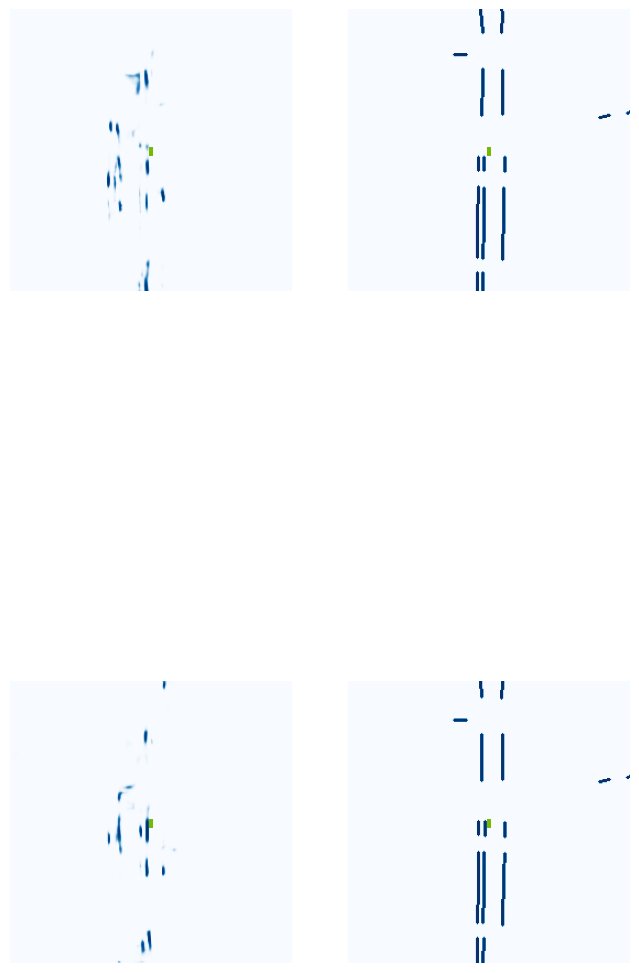

 90%|█████████ | 36/40 [00:13<00:01,  2.59it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.08.jpg


100%|██████████| 40/40 [00:14<00:00,  2.77it/s]


VAL {'loss': 0.3362182787171117, 'iou': 0.02593049481016286}
saving ...  ./runs/model8500.pt
8510 0.0315476730465889
8520 0.037267379462718964
8530 0.008434519171714783
Epoch: 54/60
8540 0.03808228671550751
8550 0.011626329272985458
8560 0.055902376770973206
8570 0.017309673130512238
8580 0.04226939007639885
8590 0.011657483875751495
8600 0.01261421013623476
8610 0.018336188048124313
8620 0.013644916005432606
8630 0.03404907137155533
8640 0.03582069277763367
8650 0.009373646229505539
8660 0.03845953196287155
8670 0.01654038392007351
8680 0.015149863436818123
8690 0.03429387882351875
Epoch: 55/60
8700 0.03448402136564255
8710 0.046293456107378006
8720 0.008022323250770569
8730 0.06742627918720245
8740 0.011247734539210796
8750 0.039515234529972076
8760 0.006765088066458702
8770 0.024749858304858208
8780 0.00862346775829792
8790 0.002873660996556282
8800 0.03515312075614929
8810 0.01072638388723135
8820 0.019490733742713928
8830 0.013670910149812698
8840 0.027516137808561325
8850 0.02645

  0%|          | 0/40 [00:00<?, ?it/s]

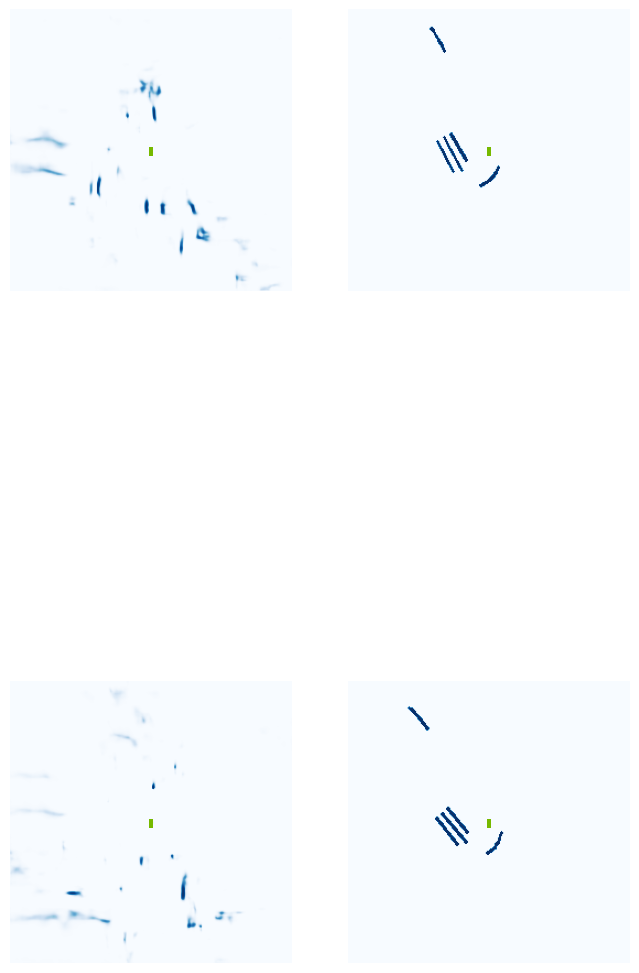

  2%|▎         | 1/40 [00:01<00:45,  1.17s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.73it/s]

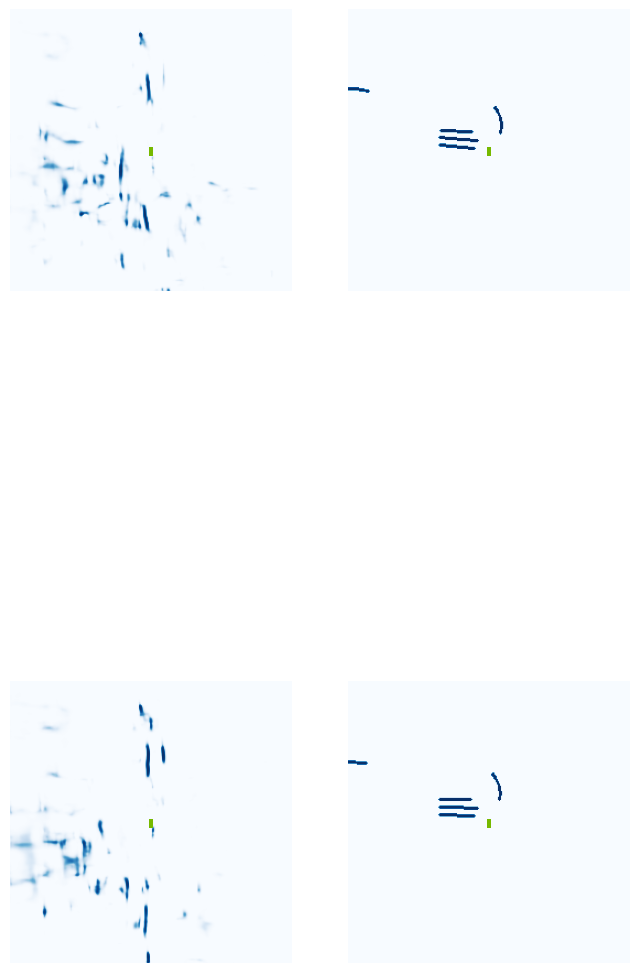

 15%|█▌        | 6/40 [00:02<00:14,  2.31it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.09it/s]

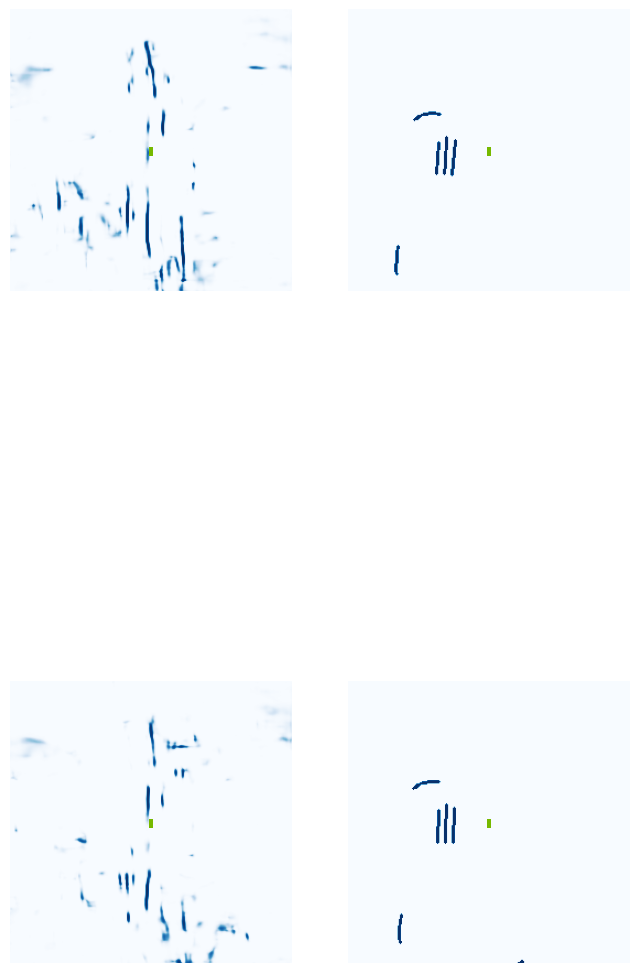

 28%|██▊       | 11/40 [00:04<00:11,  2.52it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.17it/s]

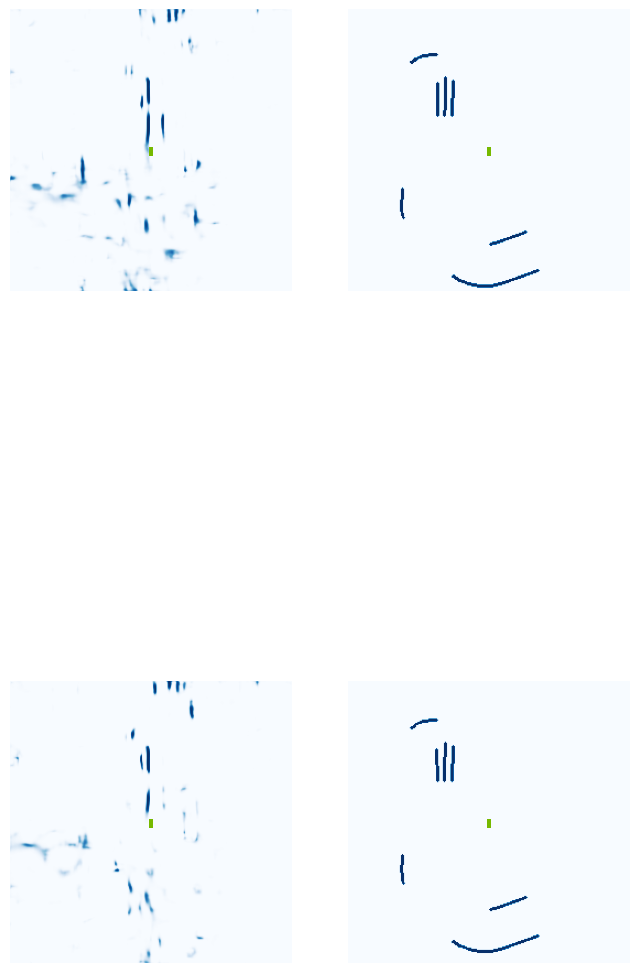

 40%|████      | 16/40 [00:06<00:09,  2.57it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.01.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.15it/s]

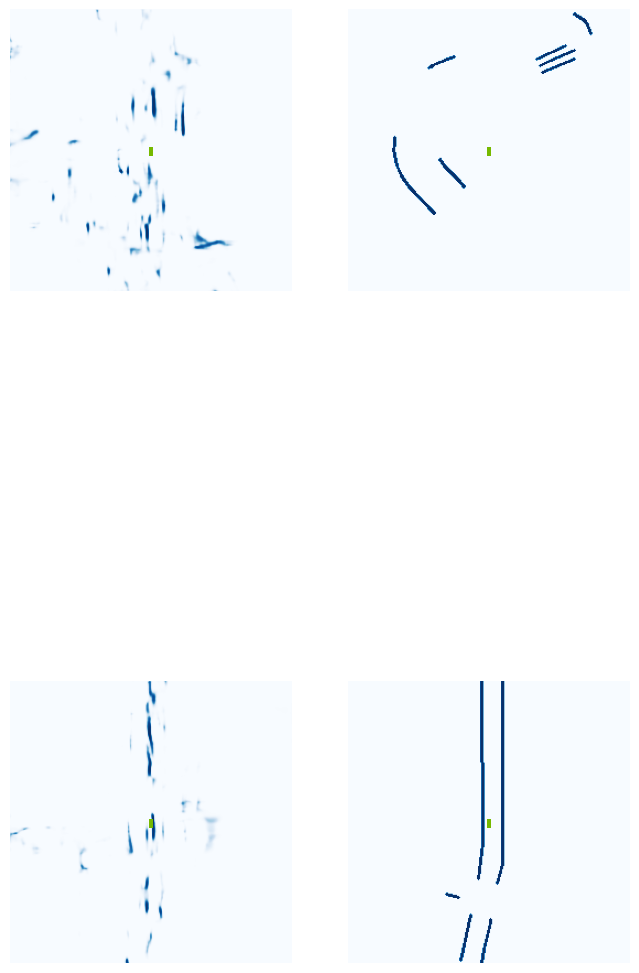

 52%|█████▎    | 21/40 [00:08<00:07,  2.57it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.00.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.20it/s]

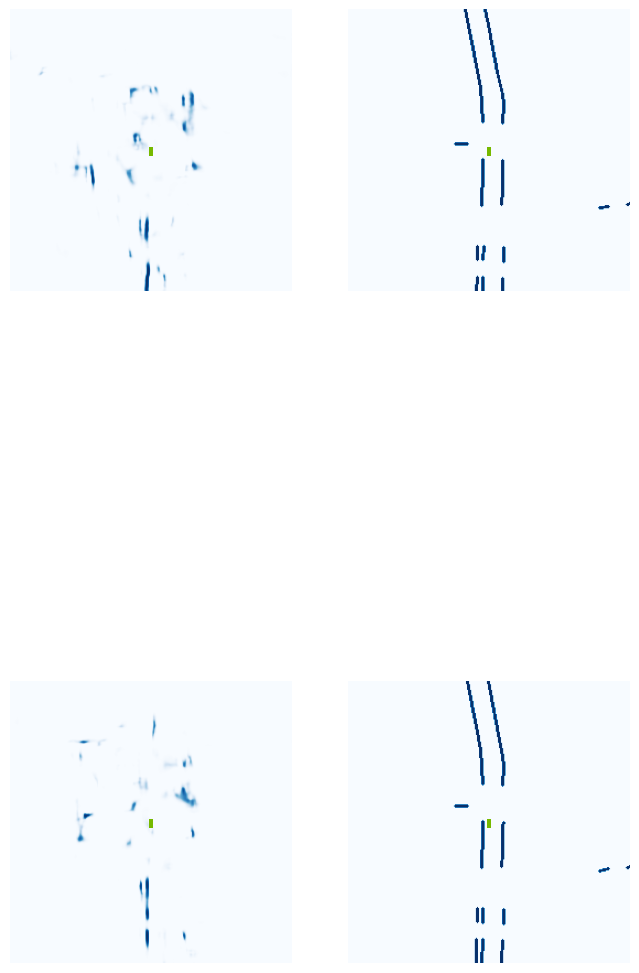

 65%|██████▌   | 26/40 [00:09<00:05,  2.60it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.00.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.20it/s]

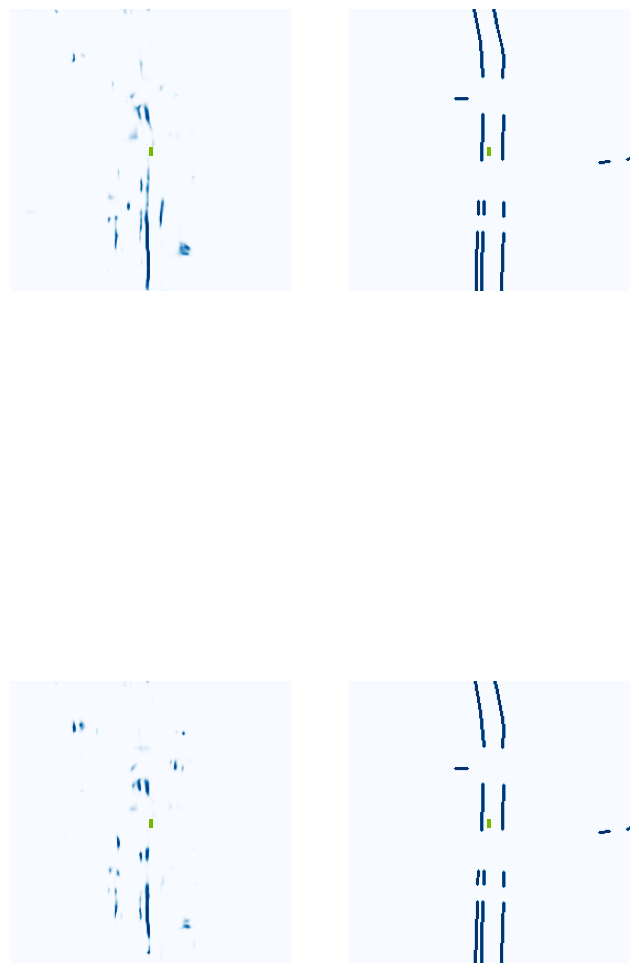

 78%|███████▊  | 31/40 [00:11<00:03,  2.56it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.03.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.19it/s]

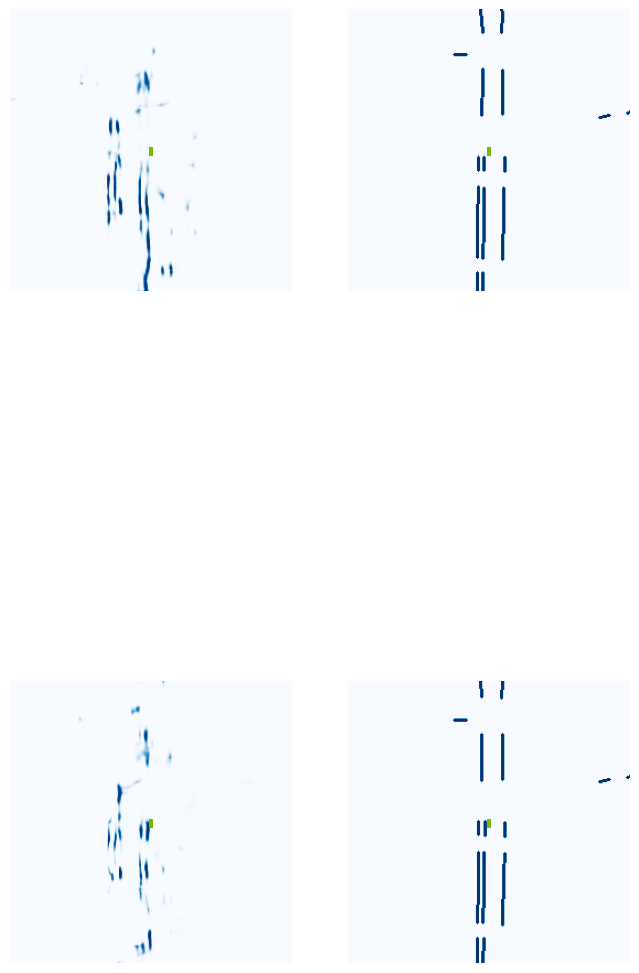

 90%|█████████ | 36/40 [00:13<00:01,  2.56it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.11.jpg


100%|██████████| 40/40 [00:14<00:00,  2.77it/s]


VAL {'loss': 0.28929778896732095, 'iou': 0.03432961999850182}
saving ...  ./runs/model9000.pt
9010 0.015998393297195435
Epoch: 57/60
9020 0.009803690016269684
9030 0.0037750229239463806
9040 0.004755581729114056
9050 0.010810984298586845
9060 0.04406442493200302
9070 0.02223198488354683
9080 0.014345339499413967
9090 0.013665751554071903
9100 0.005209025926887989
9110 0.011936871334910393
9120 0.03251507878303528
9130 0.00864502228796482
9140 0.015486938878893852
9150 0.0059520890936255455
9160 0.047166623175144196
9170 0.004415691364556551
Epoch: 58/60
9180 0.039427973330020905
9190 0.06413093209266663
9200 0.010548746213316917
9210 0.012894517742097378
9220 0.008534852415323257
9230 0.0060501922853291035
9240 0.009236374869942665
9250 0.00870123878121376
9260 0.01083032414317131
9270 0.02361864037811756
9280 0.008514504879713058
9290 0.03442404419183731
9300 0.03386126458644867
9310 0.0238528810441494
9320 0.00906638614833355
9330 0.0057192896492779255
Epoch: 59/60
9340 0.00887808948

  0%|          | 0/40 [00:00<?, ?it/s]

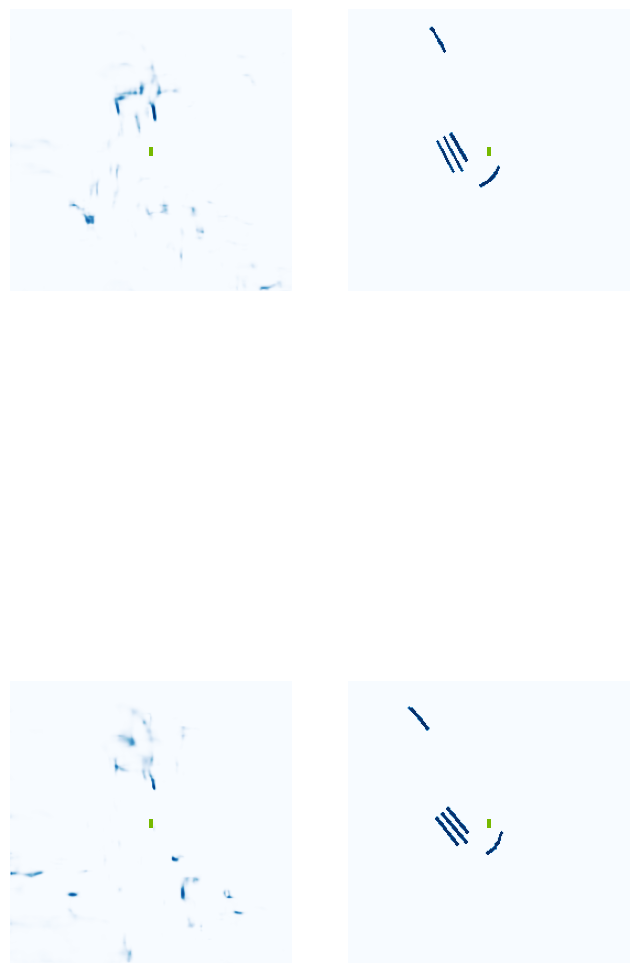

  2%|▎         | 1/40 [00:01<00:46,  1.20s/it]

Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg


 12%|█▎        | 5/40 [00:02<00:12,  2.71it/s]

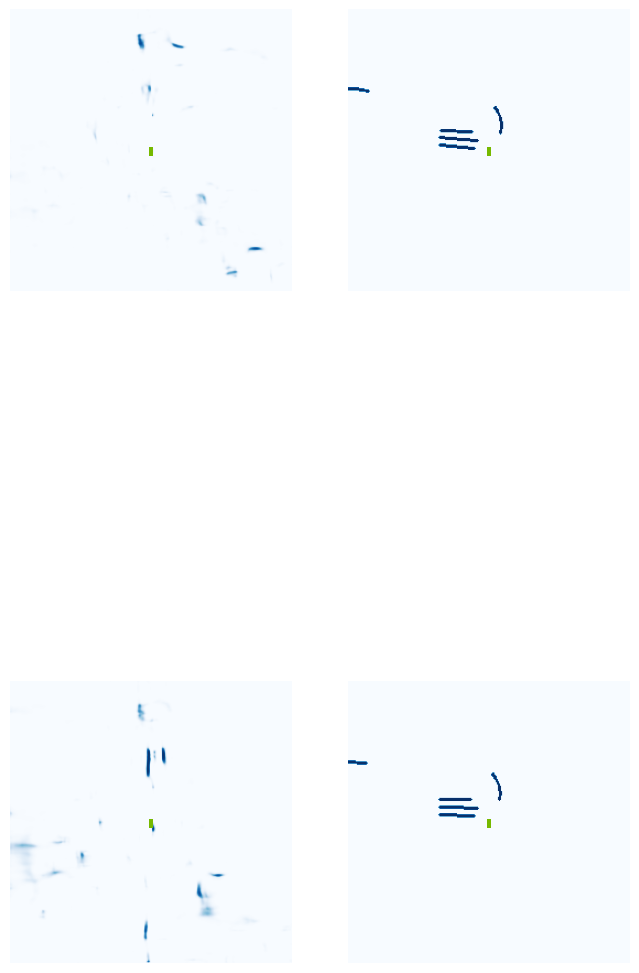

 15%|█▌        | 6/40 [00:02<00:14,  2.27it/s]

Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg


 25%|██▌       | 10/40 [00:04<00:09,  3.10it/s]

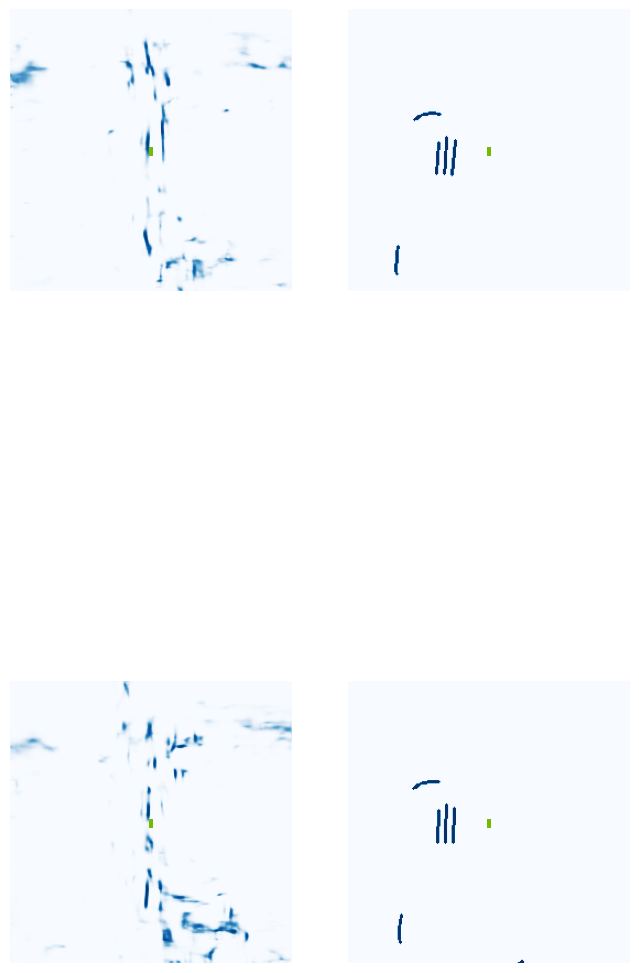

 28%|██▊       | 11/40 [00:04<00:11,  2.50it/s]

Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg


 38%|███▊      | 15/40 [00:05<00:07,  3.18it/s]

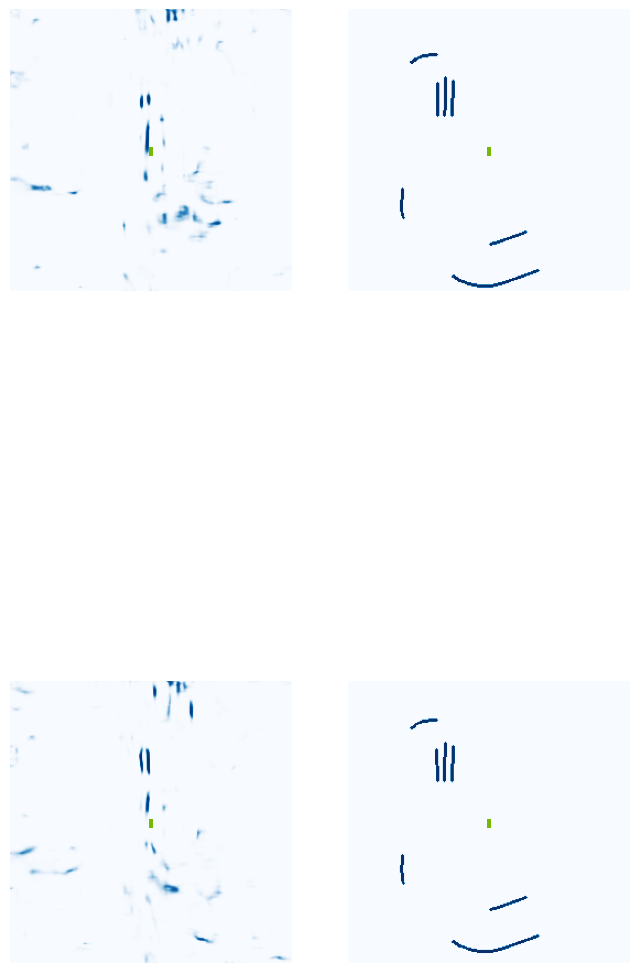

 40%|████      | 16/40 [00:06<00:09,  2.56it/s]

Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg


 50%|█████     | 20/40 [00:07<00:06,  3.20it/s]

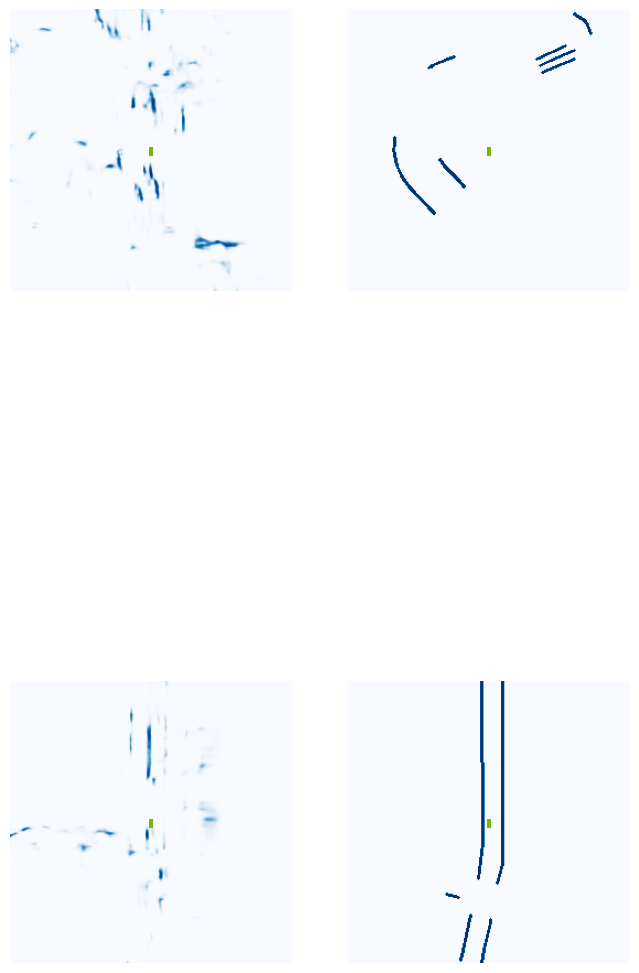

 52%|█████▎    | 21/40 [00:08<00:07,  2.57it/s]

Image saved! ... ./runs/get_val_info/20-iou-0.01.jpg


 62%|██████▎   | 25/40 [00:09<00:04,  3.20it/s]

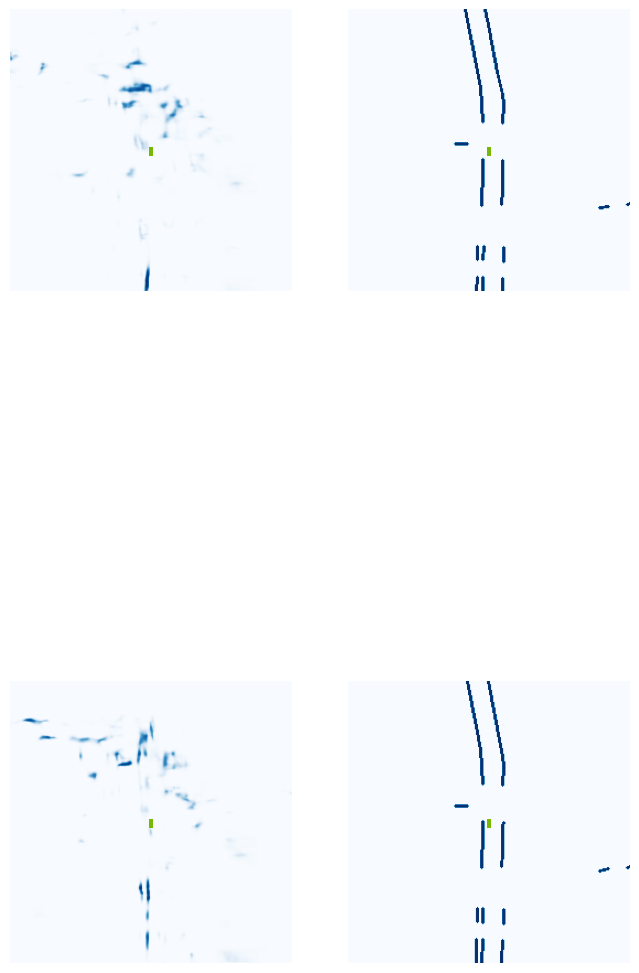

 65%|██████▌   | 26/40 [00:09<00:05,  2.59it/s]

Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg


 75%|███████▌  | 30/40 [00:10<00:03,  3.20it/s]

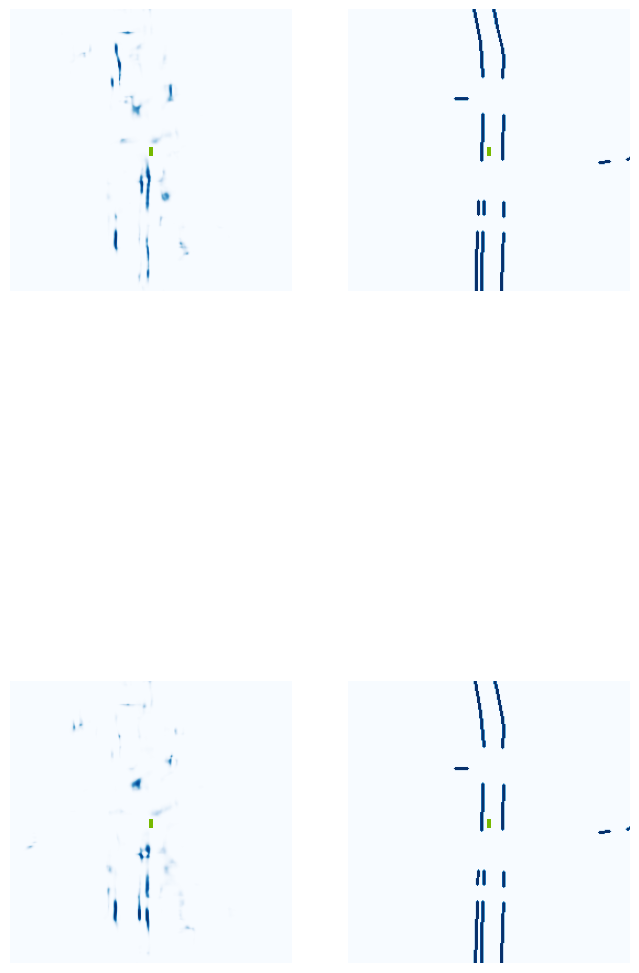

 78%|███████▊  | 31/40 [00:11<00:03,  2.57it/s]

Image saved! ... ./runs/get_val_info/30-iou-0.03.jpg


 88%|████████▊ | 35/40 [00:12<00:01,  3.21it/s]

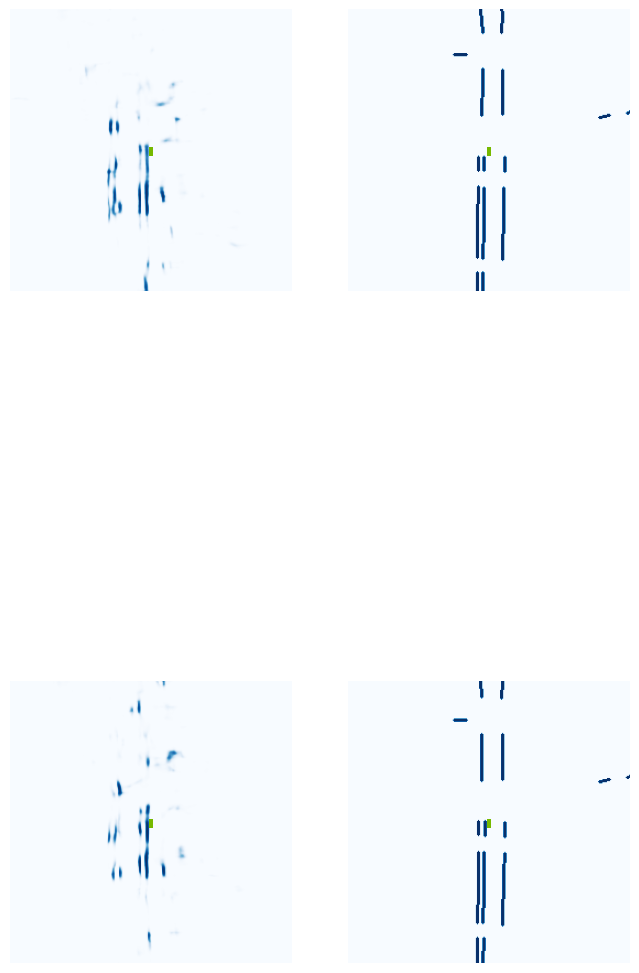

 90%|█████████ | 36/40 [00:13<00:01,  2.59it/s]

Image saved! ... ./runs/get_val_info/35-iou-0.12.jpg


100%|██████████| 40/40 [00:14<00:00,  2.77it/s]


VAL {'loss': 0.2536241379049089, 'iou': 0.03454084924370953}
saving ...  ./runs/model9500.pt
9510 0.011524312198162079
9520 0.03641432523727417
9530 0.03613727167248726
9540 0.008831895887851715
9550 0.024040181189775467
9560 0.010937144979834557
9570 0.009096326306462288
9580 0.0037298272363841534
9590 0.015011372044682503
9600 0.043869439512491226
9610 0.022776834666728973
9620 0.05613487958908081
9630 0.013715378940105438
9640 0.023470215499401093
9650 0.011401211842894554
9660 0.0044168513268232346


In [ ]:

#Now we want to actually call this function
train(train_label=train_label,
  version = version,
  dataroot= dataroot,
  nepochs = nepochs, #60 for full runs
  gpuid = gpuid, #since only one GPU is available and we start counting from 0
  H = H,
  W = W,
  resize_lim = resize_lim,
  final_dim = final_dim,
  bot_pct_lim = bot_pct_lim,
  rot_lim = rot_lim,
  rand_flip = rand_flip,
  ncams = ncams,
  max_grad_norm = max_grad_norm,
  pos_weight = pos_weight,
  logdir = logdir,
  xbound = xbound,
  ybound = ybound,
  zbound = zbound,
  dbound = dbound,

  bsz = bsz,
  nworkers = nworkers,
  lr = lr,
  weight_decay = weight_decay,
  num_points = num_points,
  n_points = n_points,

  max_points_voxel = max_points_voxel,
  max_voxels = max_voxels,
  input_features = input_features,
  use_norm = use_norm,
  vfe_filters = vfe_filters,
  with_distance = with_distance,

  n_head = n_head,
  block_exp = block_exp,
  n_layer = n_layer,
  vert_anchors = vert_anchors,
  horz_anchors = horz_anchors,
  seq_len = seq_len,
  embd_pdrop = embd_pdrop,
  resid_pdrop = resid_pdrop,
  attn_pdrop = attn_pdrop,
  n_views = n_views
      )

###Show loss and IOU statistics for train and val inline through Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

###Define helper functions for visualisations (as per "explore.py" in TF Grid)

In [ ]:
#All of the below is effectively taken from the explore.py file - want to run tests to make sure this works

import torch
import matplotlib as mpl
mpl.use('Agg')
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as mpatches

#fixing relative imports - due to change made in __init__.py
from data import compile_data
from tools import (ego_to_cam, get_only_in_img_mask, denormalize_img,
                    SimpleLoss, get_val_info, add_ego, gen_dx_bx,
                    get_nusc_maps, plot_nusc_map, points_to_voxel_loop) #NB CHANGE FROM LSS CODE - NEED points_to_voxel_loop to be able to assign
                                                                        #voxels, coors, num_points to be able to pass this in forward pass of model
                                                                        #same as in train.py

from models_TFGrid import compile_model #this is the script for the 4T version of TF Grid

#This is a visual check on input/output data - see Lift Splat Shoot GitHub home page
#We want to check that inputs/outputs are being parsed correctly
#passing viz_train = True allows us to see data augmentation
def lidar_check(train_label = train_label,
                version = version,
                dataroot = dataroot,
                show_lidar = show_lidar, #want to see lidar scans
                viz_train = viz_train, #set this to True to see data augmentation and visualise train data rather than val data
                nepochs=1, #SET THIS EXPLICITLY IN FUNCTION DEF - only want to train for a single epoch - just to visualise

                H = H, W = W,
                resize_lim = resize_lim,
                final_dim = final_dim,
                bot_pct_lim = bot_pct_lim,
                rot_lim = rot_lim,
                rand_flip = rand_flip,

                xbound = xbound,
                ybound = ybound,
                zbound = zbound,
                dbound = dbound,

                bsz = bsz,
                nworkers = nworkers,
                num_classes = num_classes,
                num_points = num_points,
                n_points = n_points,

                max_points_voxel = max_points_voxel,
                max_voxels = max_voxels,
                input_features = input_features,
                use_norm = use_norm,
                vfe_filters = vfe_filters,
                with_distance = with_distance,

                n_head = n_head,
                block_exp = block_exp,
                n_layer = n_layer,
                vert_anchors = vert_anchors,
                horz_anchors = horz_anchors,
                seq_len = seq_len,
                embd_pdrop = embd_pdrop,
                resid_pdrop = resid_pdrop,
                attn_pdrop = attn_pdrop,
                n_views = n_views

                ):
  #set up param dicts based on passed params
    grid_conf = {
        'xbound': xbound,
        'ybound': ybound,
        'zbound': zbound,
        'dbound': dbound,
    } #set grid_conf
    cams = ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT',
                             'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT'] #specify names of cams
    data_aug_conf = {
                    'resize_lim': resize_lim,
                    'final_dim': final_dim,
                    'rot_lim': rot_lim,
                    'H': H, 'W': W,
                    'rand_flip': rand_flip,
                    'bot_pct_lim': bot_pct_lim,
                    'cams': cams,
                    'Ncams': 5, #HERE THIS IS BASED ON LSS AND IS PASSED EXPLICITLY
                } #set up data_aug_conf - NB THE REASON FOR ONLY 5 CAMS IS THIS WAS SHOWN TO INCREASE ROBUSTNESS IN TRAINING WHEN
                  #ONE CAMERA WAS RANDONLY DROPPED

    #NB - NEED TO FIX THIS IN MY OWN EXPLORE.PY FILE - Crucial difference with LSS is we also need cfg_pp to be defined, to be passed to compile_model
    cfg_pp = {
    'num_classes':num_classes,
    'num_points': num_points,
    'pc_range': [xbound[0],ybound[0],-4,xbound[1],ybound[1],4],
    'voxel_size' : [xbound[2],ybound[2],8],
    'max_points_voxel' : max_points_voxel,
    'max_voxels': max_voxels,
    'input_features': input_features,
    'batch_size': bsz,
    'use_norm': use_norm,
    'vfe_filters': vfe_filters,
    'with_distance': with_distance,
    'n_points': n_points,
  }

    tf_config = {
        'n_head':n_head,
        'block_exp':block_exp,
        'n_layer':n_layer,
        'vert_anchors':vert_anchors,
        'horz_anchors':horz_anchors,
        'seq_len':seq_len,
        'embd_pdrop':embd_pdrop,
        'resid_pdrop':resid_pdrop,
        'attn_pdrop':attn_pdrop,
        'n_views':n_views

      }

    #compile the data to set up data loaders
    trainloader, valloader = compile_data(version, dataroot, data_aug_conf=data_aug_conf,
                                          grid_conf=grid_conf, bsz=bsz, nworkers=nworkers,
                                          parser_name='vizdata', cfg_pp = cfg_pp, train_label=train_label) #Note: parser can be 'vizdata' or 'segmentationdata'
                                                                 #the difference being in (see data.py) whether
                                                                 #get_lidar_data or get_point_cloud is used for the
                                                                 #lidar information - see commented data.py file for the difference
                                                                 #NB DON'T FORGET TO INCLUDE TRAIN_LABEL AND CFG_PP - THESE ARE NOT IN LSS

    loader = trainloader if viz_train else valloader #viz_train effectively selects which data loader to use

    model = compile_model(grid_conf, data_aug_conf, outC=1, cfg_pp=cfg_pp, tf_config = tf_config) #compile the model

    rat = H / W #set up parameters for outputting visualisations
    val = 10.1
    fig = plt.figure(figsize=(val + val/3*2*rat*3, val/3*2*rat))
    gs = mpl.gridspec.GridSpec(2, 6, width_ratios=(1, 1, 1, 2*rat, 2*rat, 2*rat))
    gs.update(wspace=0.0, hspace=0.0, left=0.0, right=1.0, top=1.0, bottom=0.0)

    for epoch in range(nepochs): #want to just run the model for a small number of epochs - nepochs = 1 above
        for batchi, (imgs, rots, trans, intrins, post_rots, post_trans, pts, binimgs) in enumerate(loader):

            img_pts = model.get_geometry(rots, trans, intrins, post_rots, post_trans)
            #for every batch we want to get the image points and plot them
            for si in range(imgs.shape[0]):
                plt.clf()
                final_ax = plt.subplot(gs[:, 5:6])
                for imgi, img in enumerate(imgs[si]):
                    ego_pts = ego_to_cam(pts[si], rots[si, imgi], trans[si, imgi], intrins[si, imgi])
                    mask = get_only_in_img_mask(ego_pts, H, W)
                    plot_pts = post_rots[si, imgi].matmul(ego_pts) + post_trans[si, imgi].unsqueeze(1)

                    ax = plt.subplot(gs[imgi // 3, imgi % 3])
                    showimg = denormalize_img(img)
                    plt.imshow(showimg)
                    if show_lidar: #also gets lidar points
                        plt.scatter(plot_pts[0, mask], plot_pts[1, mask], c=ego_pts[2, mask],
                                s=5, alpha=0.1, cmap='jet')
                    # plot_pts = post_rots[si, imgi].matmul(img_pts[si, imgi].view(-1, 3).t()) + post_trans[si, imgi].unsqueeze(1)
                    # plt.scatter(img_pts[:, :, :, 0].view(-1), img_pts[:, :, :, 1].view(-1), s=1)
                    plt.axis('off')

                    plt.sca(final_ax)
                    plt.plot(img_pts[si, imgi, :, :, :, 0].view(-1), img_pts[si, imgi, :, :, :, 1].view(-1), '.', label=cams[imgi].replace('_', ' '))

                plt.legend(loc='upper right')
                final_ax.set_aspect('equal')
                plt.xlim((-50, 50))
                plt.ylim((-50, 50))

                ax = plt.subplot(gs[:, 3:4])
                plt.scatter(pts[si, 0], pts[si, 1], c=pts[si, 2], vmin=-5, vmax=5, s=5)
                plt.xlim((-50, 50))
                plt.ylim((-50, 50))
                ax.set_aspect('equal')

                ax = plt.subplot(gs[:, 4:5])
                plt.imshow(binimgs[si].squeeze(0).T, origin='lower', cmap='Greys', vmin=0, vmax=1) #displays output

                imname = f'lcheck{epoch:03}_{batchi:05}_{si:02}.jpg'
                print('saving', imname)
                plt.savefig(imname) #saves output display to a file for that particular epoch and batch

#As far as I understand this is just a check to make sure that the result of autograd with and without
#the cumulative sum trick, match so that we can check that the cumsum trick is working properly
def cumsum_check(train_label = train_label,
                version = version,
                dataroot = dataroot,
                gpuid = gpuid,

                H = H, W = W,
                resize_lim = resize_lim,
                final_dim = final_dim,
                bot_pct_lim = bot_pct_lim,
                rot_lim = rot_lim,
                rand_flip = rand_flip,

                xbound = xbound,
                ybound = ybound,
                zbound = zbound,
                dbound = dbound,

                bsz = bsz,
                nworkers = nworkers,

                num_classes = num_classes,
                num_points = num_points,
                n_points = n_points,

                max_points_voxel = max_points_voxel,
                max_voxels = max_voxels,
                input_features = input_features,
                use_norm = use_norm,
                vfe_filters = vfe_filters,
                with_distance = with_distance,

                n_head = n_head,
                block_exp = block_exp,
                n_layer = n_layer,
                vert_anchors = vert_anchors,
                horz_anchors = horz_anchors,
                seq_len = seq_len,
                embd_pdrop = embd_pdrop,
                resid_pdrop = resid_pdrop,
                attn_pdrop = attn_pdrop,
                n_views = n_views
                ):
    #set up dicts based on above param values
    grid_conf = {
        'xbound': xbound,
        'ybound': ybound,
        'zbound': zbound,
        'dbound': dbound,
    }
    data_aug_conf = {
                    'resize_lim': resize_lim,
                    'final_dim': final_dim,
                    'rot_lim': rot_lim,
                    'H': H, 'W': W,
                    'rand_flip': rand_flip,
                    'bot_pct_lim': bot_pct_lim,
                    'cams': ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT',
                             'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT'],
                    'Ncams': 5, #THIS IS SET EXPLICITLY HERE BASED ON Lift Splat Shoot
                }
    #need cfg_pp to pass as an argument to compile_data - don't have this in LSS as it doesn't use PointPillars config
    cfg_pp = {
    'num_classes':num_classes,
    'num_points': num_points,
    'pc_range': [xbound[0],ybound[0],-4,xbound[1],ybound[1],4],
    'voxel_size' : [xbound[2],ybound[2],8],
    'max_points_voxel' : max_points_voxel,
    'max_voxels': max_voxels,
    'input_features': input_features,
    'batch_size': bsz,
    'use_norm': use_norm,
    'vfe_filters': vfe_filters,
    'with_distance': with_distance,
    'n_points': n_points,
  }
    tf_config = {
        'n_head':n_head,
        'block_exp':block_exp,
        'n_layer':n_layer,
        'vert_anchors':vert_anchors,
        'horz_anchors':horz_anchors,
        'seq_len':seq_len,
        'embd_pdrop':embd_pdrop,
        'resid_pdrop':resid_pdrop,
        'attn_pdrop':attn_pdrop,
        'n_views':n_views

      }
    #compile the data - with segmentation data
    trainloader, valloader = compile_data(version, dataroot, data_aug_conf=data_aug_conf,
                                          grid_conf=grid_conf, bsz=bsz, nworkers=nworkers,
                                          parser_name='segmentationdata', cfg_pp=cfg_pp, train_label=train_label) #other default arguments defined from data.py - but we need
                                                                                                                  #cfg_pp and train_label

    device = torch.device('cpu') if gpuid < 0 else torch.device(f'cuda:{gpuid}')
    loader = trainloader #want to load training data

    model = compile_model(grid_conf, data_aug_conf, outC=1, cfg_pp=cfg_pp, tf_config = tf_config) #compile the model
    model.to(device)

    model.eval()
    #effectively just run for a single epoch - we only want to do a backward pass and check autograd matches
    for batchi, (imgs, rots, trans, intrins, post_rots, post_trans, binimgs, points) in enumerate(loader):

        model.use_quickcumsum = False #this is without using quickcumsum - see model.py for how it handles when use_quickcumsum=False
        model.zero_grad()
        #NB - NOTE - IN ORDER TO ACTUALLY RUN THE FORWARD PASS OF OUR MODEL WE NEED voxels, coors and num_points
        #and these come from points_to_voxel_loop - see train.py - there it calls this to get these assigned before then passing these to actually do a forward pass of the model
        voxels, coors, num_points = points_to_voxel_loop(points, cfg_pp)

        out = model(imgs.to(device),
                rots.to(device),
                trans.to(device),
                intrins.to(device),
                post_rots.to(device),
                post_trans.to(device),
                voxels.to(device), #need voxels, coors and num_points - different to LSS code
                coors.to(device),
                num_points.to(device)
                )
        out.mean().backward()
        print('autograd:    ', out.mean().detach().item(), model.camencode.depthnet.weight.grad.mean().item())

        model.use_quickcumsum = True #this is with using quickcumsum - see model.py for how it handles when use_quickcumsum=True
        model.zero_grad()
        out = model(imgs.to(device),
                rots.to(device),
                trans.to(device),
                intrins.to(device),
                post_rots.to(device),
                post_trans.to(device),
                voxels.to(device), #need voxels, coors and num_points - different to LSS code
                coors.to(device),
                num_points.to(device)
                )
        out.mean().backward()
        print('quick cumsum:', out.mean().detach().item(), model.camencode.depthnet.weight.grad.mean().item())
        print()
        #Ultimately from the print statements we can compare if cumsum trick is working as expected or not

#NB THIS IS WHAT WE WANT TO GET OUT THE ACTUAL IOU PERFORMANCE OF THE MODEL ON VALIDATION DATA USING A FITTED MODEL
def eval_model_iou(modelf, #NB WILL NEED TO SPECIFY A MODEL_LOCATION WHERE THE TRAINED MODEL IS SAVED - THEN USE THIS TO EVALUATE
                        #Note: See the last part of train.py - it will tell your the MODEL_LOCATION based on mname where it saves
                        #a state_dict of the model after the count%val_step == 0 - take the latest model saved and use that when passing
                        #eval_model_iou  - ultimately based on get_val_info
                        #this is the validation info only for the same class as trained on
                        #will also need to edit get_val_info for where the images resulting from plot_bev are being saved version = "mini",
                        #NB Note - non-default arguments need to precede default arguments
                version = version,
                dataroot = dataroot,
                gpuid = gpuid,

                H = H, W = W,
                resize_lim = resize_lim,
                final_dim = final_dim,
                bot_pct_lim = bot_pct_lim,
                rot_lim = rot_lim,
                rand_flip = rand_flip,

                xbound = xbound,
                ybound = ybound,
                zbound = zbound,
                dbound = dbound,

                bsz = bsz,
                nworkers = nworkers,

                num_classes = num_classes,
                num_points = num_points,
                n_points = n_points, #trainval avg 34720  , mini avg 34718

                max_points_voxel = max_points_voxel,
                max_voxels = max_voxels,
                input_features = input_features,
                use_norm = use_norm,
                vfe_filters = vfe_filters,
                with_distance = with_distance,

                n_head = n_head,
                block_exp = block_exp,
                n_layer = n_layer,
                vert_anchors = vert_anchors,
                horz_anchors = horz_anchors,
                seq_len = seq_len,
                embd_pdrop = embd_pdrop,
                resid_pdrop = resid_pdrop,
                attn_pdrop = attn_pdrop,
                n_views = n_views

                ):
    grid_conf = {
        'xbound': xbound,
        'ybound': ybound,
        'zbound': zbound,
        'dbound': dbound,
    }
    data_aug_conf = {
                    'resize_lim': resize_lim,
                    'final_dim': final_dim,
                    'rot_lim': rot_lim,
                    'H': H, 'W': W,
                    'rand_flip': rand_flip,
                    'bot_pct_lim': bot_pct_lim,
                    'cams': ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT',
                             'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT'],
                    'Ncams': 5, #THIS IS PASSED EXPLICITLY HERE
                }
    #need cfg_pp to pass as an argument to compile_data - don't have this in LSS as it doesn't use PointPillars config
    cfg_pp = {
    'num_classes':num_classes,
    'num_points': num_points,
    'pc_range': [xbound[0],ybound[0],-4,xbound[1],ybound[1],4],
    'voxel_size' : [xbound[2],ybound[2],8],
    'max_points_voxel' : max_points_voxel,
    'max_voxels': max_voxels,
    'input_features': input_features,
    'batch_size': bsz,
    'use_norm': use_norm,
    'vfe_filters': vfe_filters,
    'with_distance': with_distance,
    'n_points': n_points,
  }

    tf_config = {
        'n_head':n_head,
        'block_exp':block_exp,
        'n_layer':n_layer,
        'vert_anchors':vert_anchors,
        'horz_anchors':horz_anchors,
        'seq_len':seq_len,
        'embd_pdrop':embd_pdrop,
        'resid_pdrop':resid_pdrop,
        'attn_pdrop':attn_pdrop,
        'n_views':n_views

      }
    trainloader, valloader = compile_data(version, dataroot, data_aug_conf=data_aug_conf,
                                          grid_conf=grid_conf, bsz=bsz, nworkers=nworkers,
                                          parser_name='segmentationdata', cfg_pp=cfg_pp, train_label = train_label) #all other default params passed from data.py but we need cfg_pp and
                                                                                                                    #train_label - unlike LSS code

    device = torch.device('cpu') if gpuid < 0 else torch.device(f'cuda:{gpuid}')

    model = compile_model(grid_conf, data_aug_conf, outC=1, cfg_pp = cfg_pp, tf_config = tf_config) #compile model
    print('loading', modelf)
    #within modelf there are keys - epoch, model_state_dict, optimizer_state_dict, loss and counter
    #we can't just load the entire state_dict we want to be specific and look at only model_state_dict
    model.load_state_dict(torch.load(modelf)['model_state_dict'])
    model.to(device)

    loss_fn = SimpleLoss(1.0).cuda(gpuid)

    model.eval()
    val_info = get_val_info(model, valloader, loss_fn, device, cfg_pp = cfg_pp, grid_conf=grid_conf) #ultimate output is a dict of loss and iou across all batches
                                                               #plus images stored in a folder (to be set) with the outputs of
                                                               #plot_bev
                                                               #NB - NOTE - the way it is defined in tools.py it requires a cfg argument - really this is cfg_pp - as it gets
                                                               #passed to points_to_voxel_loop to get voxels, coors, num_points etc
    print(val_info)


def viz_model_preds(modelf, #this is to be a file path to a fitted model
                    version = version,
                    dataroot= dataroot,
                    map_folder = map_folder, #sets the folder where maps are to be found
                    img_save = img_save_dir, # Need to pass a directory I actually have access to
                    gpuid = gpuid,#start counting from 0 when using just one GPU
                    viz_train = viz_train,

                    H = H, W = W,
                    resize_lim = resize_lim,
                    final_dim = final_dim,
                    bot_pct_lim = bot_pct_lim,
                    rot_lim = rot_lim,
                    rand_flip = rand_flip,

                    xbound = xbound,
                    ybound = ybound,
                    zbound = zbound,
                    dbound = dbound,

                    bsz = bsz,
                    nworkers = nworkers,

                    num_classes = num_classes, #NEED TO PUT THIS IN HERE AS IT ISN'T COMING FROM THE CONFIG FILE
                    num_points = num_points,
                    n_points = n_points, #trainval avg 34720  , mini avg 34718

                    max_points_voxel = max_points_voxel,
                    max_voxels = max_voxels,
                    input_features = input_features,
                    use_norm = use_norm,
                    vfe_filters = vfe_filters,
                    with_distance = with_distance,

                    n_head = n_head,
                    block_exp = block_exp,
                    n_layer = n_layer,
                    vert_anchors = vert_anchors,
                    horz_anchors = horz_anchors,
                    seq_len = seq_len,
                    embd_pdrop = embd_pdrop,
                    resid_pdrop = resid_pdrop,
                    attn_pdrop = attn_pdrop,
                    n_views = n_views

                    ):
    #set dicts for passed params
    grid_conf = {
        'xbound': xbound,
        'ybound': ybound,
        'zbound': zbound,
        'dbound': dbound,
    }
    cams = ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT',
            'CAM_BACK_LEFT', 'CAM_BACK', 'CAM_BACK_RIGHT']
    data_aug_conf = {
                    'resize_lim': resize_lim,
                    'final_dim': final_dim,
                    'rot_lim': rot_lim,
                    'H': H, 'W': W,
                    'rand_flip': rand_flip,
                    'bot_pct_lim': bot_pct_lim,
                    'cams': cams,
                    'Ncams': 5, #THIS IS PASSED EXPLICITLY - based on Lift Splat Shoot
                }
    #need cfg_pp to pass as an argument to compile_data - don't have this in LSS as it doesn't use PointPillars config
    cfg_pp = {
    'num_classes':num_classes,
    'num_points': num_points,
    'pc_range': [xbound[0],ybound[0],-4,xbound[1],ybound[1],4],
    'voxel_size' : [xbound[2],ybound[2],8],
    'max_points_voxel' : max_points_voxel,
    'max_voxels': max_voxels,
    'input_features': input_features,
    'batch_size': bsz,
    'use_norm': use_norm,
    'vfe_filters': vfe_filters,
    'with_distance': with_distance,
    'n_points': n_points,
  }

    tf_config = {
        'n_head':n_head,
        'block_exp':block_exp,
        'n_layer':n_layer,
        'vert_anchors':vert_anchors,
        'horz_anchors':horz_anchors,
        'seq_len':seq_len,
        'embd_pdrop':embd_pdrop,
        'resid_pdrop':resid_pdrop,
        'attn_pdrop':attn_pdrop,
        'n_views':n_views

      }
    #compile data
    trainloader, valloader = compile_data(version, dataroot, data_aug_conf=data_aug_conf,
                                          grid_conf=grid_conf, bsz=bsz, nworkers=nworkers,
                                          parser_name='segmentationdata', cfg_pp = cfg_pp, train_label=train_label) #need cfg_pp and train_label all rest default from data.py
    loader = trainloader if viz_train else valloader #decide whether visualising train or val data
    nusc_maps = get_nusc_maps(map_folder) #NEED TO DOUBLE CHECK WHAT THIS FUNCTION DOES AND WHAT IT RETURNS - Should generally get the maps

    device = torch.device('cpu') if gpuid < 0 else torch.device(f'cuda:{gpuid}')

    model = compile_model(grid_conf, data_aug_conf, outC=1,cfg_pp = cfg_pp, tf_config = tf_config) #compile the model
    print('loading', modelf)
    print('device: ',device) ###
    #Want to generally load a fitted model
    #within modelf there are keys - epoch, model_state_dict, optimizer_state_dict, loss and counter
    #we can't just load the entire state_dict we want to be specific and look at only model_state_dict
    model.load_state_dict(torch.load(modelf)['model_state_dict'])####,map_location=device
    model.to(device)

    dx, bx, _ = gen_dx_bx(grid_conf['xbound'], grid_conf['ybound'], grid_conf['zbound'])
    dx, bx = dx[:2].numpy(), bx[:2].numpy()

    scene2map = {}
    for rec in loader.dataset.nusc.scene:
        log = loader.dataset.nusc.get('log', rec['log_token'])
        scene2map[rec['name']] = log['location']

    #this is for setting up plotting
    val = 0.01
    fH, fW = final_dim
    fig = plt.figure(figsize=(3*fW*val, (1.5*fW + 2*fH)*val))
    gs = mpl.gridspec.GridSpec(3, 3, height_ratios=(1.5*fW, fH, fH))
    gs.update(wspace=0.0, hspace=0.0, left=0.0, right=1.0, top=1.0, bottom=0.0)

    model.eval() #switch model to eval mode
    counter = 0
    with torch.no_grad():
        for batchi, (imgs, rots, trans, intrins, post_rots, post_trans, binimgs, points) in enumerate(loader): #need points also
            voxels, coors, num_points = points_to_voxel_loop(points, cfg_pp) #need voxels, coors and num_points to run forward pass on model

            out = model(imgs.to(device),
                    rots.to(device),
                    trans.to(device),
                    intrins.to(device),
                    post_rots.to(device),
                    post_trans.to(device),
                    voxels.to(device), #need voxels, coors and num_points - different to LSS code
                    coors.to(device),
                    num_points.to(device)
                    )
            out = out.sigmoid().cpu() #### why applies sigmoid to output???


            for si in range(imgs.shape[0]):
                plt.clf()
                for imgi, img in enumerate(imgs[si]):
                    ax = plt.subplot(gs[1 + imgi // 3, imgi % 3])
                    showimg = denormalize_img(img)
                    # flip the bottom images
                    if imgi > 2:
                        showimg = showimg.transpose(Image.FLIP_LEFT_RIGHT)
                    plt.imshow(showimg)
                    plt.axis('off')
                    plt.annotate(cams[imgi].replace('_', ' '), (0.01, 0.92), xycoords='axes fraction')

                ax = plt.subplot(gs[0, :])
                ax.get_xaxis().set_ticks([])
                ax.get_yaxis().set_ticks([])
                plt.setp(ax.spines.values(), color='b', linewidth=2)
                plt.legend(handles=[
                    mpatches.Patch(color=(0.0, 0.0, 1.0, 1.0), label='Output Vehicle Segmentation'),
                    mpatches.Patch(color='#76b900', label='Ego Vehicle'),
                    mpatches.Patch(color=(1.00, 0.50, 0.31, 0.8), label='Map (for visualization purposes only)')
                ], loc=(0.01, 0.86))
                plt.imshow(out[si].squeeze(0), vmin=0, vmax=1, cmap='Blues')

                # plot static map (improves visualization)
                rec = loader.dataset.ixes[counter]
                plot_nusc_map(rec, nusc_maps, loader.dataset.nusc, scene2map, dx, bx)
                plt.xlim((out.shape[3], 0))
                plt.ylim((0, out.shape[3]))
                add_ego(bx, dx)

                imname = f'eval{batchi:06}_{si:03}.jpg'
                print('saving', imname)
                plt.savefig(img_save + imname) #saves all these figures named based on batch number and enumerated image number
                counter += 1


###Call eval_model_iou() to get IOU and loss

In [ ]:
eval_model_iou(modelf = os.path.join(logdir, "model9500.pt"),
                version = version,
                dataroot = dataroot,
                gpuid = gpuid, #only 1 gpu on Colab

                H = H, W = W,
                resize_lim = resize_lim,
                final_dim = final_dim,
                bot_pct_lim = bot_pct_lim,
                rot_lim = rot_lim,
                rand_flip = rand_flip,

                xbound = xbound,
                ybound = ybound,
                zbound = zbound,
                dbound = dbound,

                bsz = bsz,
                nworkers = nworkers,

                num_classes = num_classes,
                num_points = num_points,

                n_points = n_points, #trainval avg 34720  , mini avg 34718
                max_points_voxel = max_points_voxel,
                max_voxels = max_voxels,
                input_features = input_features,
                use_norm = use_norm,
                vfe_filters = vfe_filters,
                with_distance = with_distance,

                n_head = n_head,
                block_exp = block_exp,
                n_layer = n_layer,
                vert_anchors = vert_anchors,
                horz_anchors = horz_anchors,
                seq_len = seq_len,
                embd_pdrop = embd_pdrop,
                resid_pdrop = resid_pdrop,
                attn_pdrop = attn_pdrop,
                n_views = n_views

                )


Getting all samples
Getting all samples
Loaded pretrained weights for efficientnet-b0


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


loading ./runs/model9500.pt
running eval...
Image saved! ... ./runs/get_val_info/0-iou-0.00.jpg
Image saved! ... ./runs/get_val_info/5-iou-0.00.jpg
Image saved! ... ./runs/get_val_info/10-iou-0.00.jpg
Image saved! ... ./runs/get_val_info/15-iou-0.00.jpg
Image saved! ... ./runs/get_val_info/20-iou-0.01.jpg
Image saved! ... ./runs/get_val_info/25-iou-0.03.jpg
Image saved! ... ./runs/get_val_info/30-iou-0.03.jpg
Image saved! ... ./runs/get_val_info/35-iou-0.12.jpg
{'loss': 0.12777909452532543, 'iou': 0.03453466008863618}


###Call viz_model_preds() to visualise output predictions

In [ ]:
#call viz_model_preds - to actually try to visualise outputs of model as a BEV map
viz_model_preds(modelf = os.path.join(logdir, "model9500.pt"), #file path to a fitted model - to get the actual model state_dict will need to access ['model_state_dict'] of this
                    version = version,
                    dataroot = dataroot,
                    map_folder = map_folder, #sets the folder where maps are to be found - NB get_nusc_maps will append maps/expansions/... to get relevant file
                    img_save = img_save_dir, #Chnaged this to a directory I have access to - save output in same place as all other run related output
                    gpuid = gpuid,
                    viz_train = viz_train,

                    H = H, W = W,
                    resize_lim = resize_lim,
                    final_dim = final_dim,
                    bot_pct_lim = bot_pct_lim,
                    rot_lim = rot_lim,
                    rand_flip = rand_flip,

                    xbound = xbound,
                    ybound = ybound,
                    zbound = zbound,
                    dbound = dbound,

                    bsz = bsz,
                    nworkers = nworkers,

                    num_classes = num_classes,
                    num_points = num_points,

                    n_points = n_points, #trainval avg 34720  , mini avg 34718
                    max_points_voxel = max_points_voxel,
                    max_voxels = max_voxels,
                    input_features = input_features,
                    use_norm = use_norm,
                    vfe_filters = vfe_filters,
                    with_distance = with_distance,

                    n_head = n_head,
                    block_exp = block_exp,
                    n_layer = n_layer,
                    vert_anchors = vert_anchors,
                    horz_anchors = horz_anchors,
                    seq_len = seq_len,
                    embd_pdrop = embd_pdrop,
                    resid_pdrop = resid_pdrop,
                    attn_pdrop = attn_pdrop,
                    n_views = n_views
)

Getting all samples
Getting all samples
Loaded pretrained weights for efficientnet-b0
loading ./runs/model9500.pt
device:  cuda:0
saving eval000000_000.jpg
saving eval000000_001.jpg
saving eval000001_000.jpg
saving eval000001_001.jpg
saving eval000002_000.jpg
saving eval000002_001.jpg
saving eval000003_000.jpg
saving eval000003_001.jpg
saving eval000004_000.jpg
saving eval000004_001.jpg
saving eval000005_000.jpg
saving eval000005_001.jpg
saving eval000006_000.jpg
saving eval000006_001.jpg
saving eval000007_000.jpg
saving eval000007_001.jpg
saving eval000008_000.jpg
saving eval000008_001.jpg
saving eval000009_000.jpg
saving eval000009_001.jpg
saving eval000010_000.jpg
saving eval000010_001.jpg
saving eval000011_000.jpg
saving eval000011_001.jpg
saving eval000012_000.jpg
saving eval000012_001.jpg
saving eval000013_000.jpg
saving eval000013_001.jpg
saving eval000014_000.jpg
saving eval000014_001.jpg
saving eval000015_000.jpg
saving eval000015_001.jpg
saving eval000016_000.jpg
saving eval0

###Make a gif out of images produced by viz_model_preds()

In [ ]:
import glob
from PIL import Image
def make_gif(frame_folder, train_label):
    frames = [Image.open(image) for image in glob.glob(f"{frame_folder}/*.jpg")]
    frame_one = frames[0]
    frame_one.save(f"model_preds_visualisation_{train_label}_TF_Grid_4T.gif", format="GIF", append_images=frames,
               save_all=True, duration=100, loop=0)

#Call function
make_gif(frame_folder = img_save_dir, train_label = train_label)